# **Prototipo**
Actividad presentada por el grupo conformado por:


*   Juan Manuel Isaza Vergara
*   Miguel Angel Mira Ortega
*   Santiago Arbelaez Contreras


# **Comprension del Negocio**

## **Caso de estudio: Pronóstico multivariante de variables meteorológicas**

El conjunto de datos utilizado corresponde a un registro meteorológico compuesto por aproximadamente 52.696 observaciones, tomadas a intervalos de 10 minutos, que representan aproximadamente un año de información. Cada observación contiene una variable temporal (fecha) y 21 variables numéricas meteorológicas relacionadas con las condiciones atmosféricas. Entre estas variables se encuentran la presión atmosférica, temperatura, temperatura potencial, temperatura de rocío, humedad relativa, presión de vapor, humedad específica, concentración de vapor de agua, densidad del aire, velocidad y dirección del viento, precipitación, duración de la lluvia, radiación de onda corta, radiación fotosintéticamente activa, temperatura de registro y concentración de CO₂. En conjunto, estas variables permiten representar diferentes aspectos del estado atmosférico y sus relaciones a lo largo del tiempo.

El dataset contiene información meteorológica registrada de forma secuencial, por lo que las observaciones presentan una dependencia temporal. Adicionalmente, algunas variables presentan valores faltantes representados originalmente mediante el valor -9999, el cual fue interpretado como un código de ausencia de información y no como una medición meteorológica válida. Como parte del procesamiento de los datos, estos valores son tratados como datos faltantes y posteriormente se realizan los procedimientos de imputación correspondientes. Asimismo, los registros son ordenados cronológicamente para preservar la estructura temporal del conjunto de datos.

El objetivo consiste en realizar un forecasting multivariante, en el que las 21 variables meteorológicas son consideradas simultáneamente como variables de entrada y de salida. De esta manera, el modelo debe aprender tanto la evolución temporal de cada variable como las relaciones existentes entre las diferentes variables meteorológicas. Por ejemplo, la temperatura, la humedad, la presión atmosférica y el viento pueden presentar relaciones entre sí que pueden ser aprovechadas para mejorar las predicciones.

Para garantizar una evaluación adecuada de los modelos, el conjunto de datos se divide respetando estrictamente el orden cronológico. Se utiliza una partición de 70 % para entrenamiento, 15 % para validación y 15 % para prueba.

En este contexto, el objetivo del proyecto consiste en desarrollar y comparar diferentes métodos estadísticos y arquitecturas de inteligencia artificial capaces de realizar pronósticos multivariantes de variables meteorológicas. Para ello se consideran cuatro enfoques: Vector Autoregression (VAR) como modelo estadístico de referencia, Long Short-Term Memory (LSTM) como arquitectura recurrente, TSMixer como arquitectura basada en mezcladores de información temporal y de variables, e iTransformer como arquitectura basada en Transformers diseñada específicamente para forecasting multivariante. Todos los modelos serán evaluados sobre el mismo problema, utilizando ventanas históricas y horizontes de predicción equivalentes.

En este contexto, la pregunta de investigación principal es ¿qué arquitectura captura mejor las relaciones temporales y multivariantes existentes entre las variables meteorológicas, particularmente entre temperatura, humedad, viento y presión? La comparación entre VAR, LSTM, TSMixer e iTransformer permitirá analizar las diferencias entre un enfoque estadístico tradicional y diferentes arquitecturas de aprendizaje profundo, determinando cuál consigue representar de manera más efectiva la dinámica conjunta de las variables meteorológicas y obtener pronósticos más precisos para los diferentes horizontes de predicción.

## Importación de libreías

In [ ]:
# =========================
# Librerías estándar
# =========================
import os
import warnings

# =========================
# Manipulación de datos
# =========================
import numpy as np
import pandas as pd

# =========================
# Visualización
# =========================
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
import plotly.express as px

# =========================
# Descarga / acceso a datos
# =========================
import kagglehub
import gdown

# =========================
# Configuración
# =========================
!pip -q install gdown

# Comprensión de los datos

## Carga de los datos


In [ ]:
sheet_id = "11pubePt1wQMoobkDQnpj8PLK_84-2mzFXhg0-dP5mUs"

url = f"https://docs.google.com/spreadsheets/d/{sheet_id}/export?format=csv"

df = pd.read_csv(url)

df

,date,p (mbar),T (degC),Tpot (K),Tdew (degC),rh (%),VPmax (mbar),VPact (mbar),VPdef (mbar),sh (g/kg),...,wv (m/s),max. wv (m/s),wd (deg),rain (mm),raining (s),SWDR (W/m�),PAR (�mol/m�/s),max. PAR (�mol/m�/s),Tlog (degC),OT
0,2020-01-01 0:10:00,1008.89,0.71,273.18,-1.33,86.1,6.43,5.54,0.89,3.42,...,1.02,1.60,224.3,0.0,0.0,0.0,0.0,0.0,11.45,428.1
1,2020-01-01 0:20:00,1008.76,0.75,273.22,-1.44,85.2,6.45,5.49,0.95,3.39,...,0.43,0.84,206.8,0.0,0.0,0.0,0.0,0.0,11.51,428.0
2,2020-01-01 0:30:00,1008.66,0.73,273.21,-1.48,85.1,6.44,5.48,0.96,3.39,...,0.61,1.48,197.1,0.0,0.0,0.0,0.0,0.0,11.60,427.6
3,2020-01-01 0:40:00,1008.64,0.37,272.86,-1.64,86.3,6.27,5.41,0.86,3.35,...,1.11,1.48,206.4,0.0,0.0,0.0,0.0,0.0,11.70,430.0
4,2020-01-01 0:50:00,1008.61,0.33,272.82,-1.50,87.4,6.26,5.47,0.79,3.38,...,0.49,1.40,209.6,0.0,0.0,0.0,0.0,0.0,11.81,432.2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
52691,2020-12-31 23:20:00,978.32,2.28,277.16,-0.80,80.0,7.20,5.76,1.44,3.67,...,0.73,1.40,180.6,0.0,0.0,0.0,0.0,0.0,13.40,433.0
52692,2020-12-31 23:30:00,978.30,2.13,277.01,-0.43,83.1,7.12,5.92,1.20,3.77,...,0.43,0.82,174.0,0.0,0.0,0.0,0.0,0.0,13.42,439.6
52693,2020-12-31 23:40:00,978.26,1.99,276.88,-0.71,82.2,7.05,5.80,1.26,3.69,...,0.38,0.76,248.9,0.0,0.0,0.0,0.0,0.0,13.45,435.2
52694,2020-12-31 23:50:00,978.26,2.07,276.95,-0.77,81.4,7.09,5.77,1.32,3.68,...,0.57,1.07,196.6,0.0,0.0,0.0,0.0,0.0,13.47,433.9


## Obtener la cantidad de filas y columnas del dataframe - shape

Con el fin de comprender características tan fundamentales del dataset como lo son sus dimenciones (cantidad de variables y registros) se usa la instrucción shape. Con ella se evidencia que el dataset de entrenamiento tiene 52696 registros y 22 variables o culumnas.

In [ ]:
df.shape

(52696, 22)

## Obtener la cabecera del dataframe - head
Con la cabecera del dataframe (primeros 5 registros) se espera tener una visualización general de las varibles y la estructura general del dataset. Además, se permite una prematura identificación de posibles irregularidades en los datos.

In [ ]:
df.head()

,date,p (mbar),T (degC),Tpot (K),Tdew (degC),rh (%),VPmax (mbar),VPact (mbar),VPdef (mbar),sh (g/kg),...,wv (m/s),max. wv (m/s),wd (deg),rain (mm),raining (s),SWDR (W/m�),PAR (�mol/m�/s),max. PAR (�mol/m�/s),Tlog (degC),OT
0,2020-01-01 0:10:00,1008.89,0.71,273.18,-1.33,86.1,6.43,5.54,0.89,3.42,...,1.02,1.60,224.3,0.0,0.0,0.0,0.0,0.0,11.45,428.1
1,2020-01-01 0:20:00,1008.76,0.75,273.22,-1.44,85.2,6.45,5.49,0.95,3.39,...,0.43,0.84,206.8,0.0,0.0,0.0,0.0,0.0,11.51,428.0
2,2020-01-01 0:30:00,1008.66,0.73,273.21,-1.48,85.1,6.44,5.48,0.96,3.39,...,0.61,1.48,197.1,0.0,0.0,0.0,0.0,0.0,11.60,427.6
3,2020-01-01 0:40:00,1008.64,0.37,272.86,-1.64,86.3,6.27,5.41,0.86,3.35,...,1.11,1.48,206.4,0.0,0.0,0.0,0.0,0.0,11.70,430.0
4,2020-01-01 0:50:00,1008.61,0.33,272.82,-1.50,87.4,6.26,5.47,0.79,3.38,...,0.49,1.40,209.6,0.0,0.0,0.0,0.0,0.0,11.81,432.2


## Obtener los ultimos ejemplos del dataset - tail

De forma simular al anterior paso, con la instrucción tail se obtienen las ultimas 5 filas/registros, lo que igualmente ayuda a la visualización e identificación superficial de variables y/o irregularidades en los datos.

In [ ]:
df.tail()

,date,p (mbar),T (degC),Tpot (K),Tdew (degC),rh (%),VPmax (mbar),VPact (mbar),VPdef (mbar),sh (g/kg),...,wv (m/s),max. wv (m/s),wd (deg),rain (mm),raining (s),SWDR (W/m�),PAR (�mol/m�/s),max. PAR (�mol/m�/s),Tlog (degC),OT
52691,2020-12-31 23:20:00,978.32,2.28,277.16,-0.80,80.0,7.20,5.76,1.44,3.67,...,0.73,1.40,180.6,0.0,0.0,0.0,0.0,0.0,13.40,433.0
52692,2020-12-31 23:30:00,978.30,2.13,277.01,-0.43,83.1,7.12,5.92,1.20,3.77,...,0.43,0.82,174.0,0.0,0.0,0.0,0.0,0.0,13.42,439.6
52693,2020-12-31 23:40:00,978.26,1.99,276.88,-0.71,82.2,7.05,5.80,1.26,3.69,...,0.38,0.76,248.9,0.0,0.0,0.0,0.0,0.0,13.45,435.2
52694,2020-12-31 23:50:00,978.26,2.07,276.95,-0.77,81.4,7.09,5.77,1.32,3.68,...,0.57,1.07,196.6,0.0,0.0,0.0,0.0,0.0,13.47,433.9
52695,2021-01-01 0:00:00,978.24,2.01,276.89,-0.66,82.4,7.06,5.82,1.24,3.71,...,0.57,1.08,221.3,0.0,0.0,0.0,0.0,0.0,13.48,436.5


## Cambiar nombre a las columnas

El siguiente framento de código renombra las columnas a nombres nemotécnicos en español con el fin de mejorar la interpretabilidad y legibilidad del conjunto de datos durante la fase de análisis y modelado.

In [ ]:
df = df.rename(columns={
    'SWDR (W/m�)': 'SWDR (W/m²)',
    'PAR (�mol/m�/s)': 'PAR (µmol/m²/s)',
    'max. PAR (�mol/m�/s)': 'max. PAR (µmol/m²/s)'
})

df = df.rename(columns={
    'date': 'fecha',
    'p (mbar)': 'presion_atmosferica',
    'T (degC)': 'temperatura',
    'Tpot (K)': 'temperatura_potencial',
    'Tdew (degC)': 'temperatura_rocio',
    'rh (%)': 'humedad_relativa',
    'VPmax (mbar)': 'presion_vapor_saturacion',
    'VPact (mbar)': 'presion_vapor_actual',
    'VPdef (mbar)': 'deficit_presion_vapor',
    'sh (g/kg)': 'humedad_especifica',
    'H2OC (mmol/mol)': 'concentracion_vapor_agua',
    'rho (g/m**3)': 'densidad_aire',
    'wv (m/s)': 'velocidad_viento',
    'max. wv (m/s)': 'velocidad_viento_maxima',
    'wd (deg)': 'direccion_viento',
    'rain (mm)': 'precipitacion',
    'raining (s)': 'duracion_lluvia',
    'SWDR (W/m²)': 'radiacion_onda_corta',
    'PAR (µmol/m²/s)': 'radiacion_fotosinteticamente_activa',
    'max. PAR (µmol/m²/s)': 'radiacion_fotosinteticamente_activa_maxima',
    'Tlog (degC)': 'temp_registro',
    'OT': 'concentracion_co2'
})

df.head()

,fecha,presion_atmosferica,temperatura,temperatura_potencial,temperatura_rocio,humedad_relativa,presion_vapor_saturacion,presion_vapor_actual,deficit_presion_vapor,humedad_especifica,...,velocidad_viento,velocidad_viento_maxima,direccion_viento,precipitacion,duracion_lluvia,radiacion_onda_corta,radiacion_fotosinteticamente_activa,radiacion_fotosinteticamente_activa_maxima,temp_registro,concentracion_co2
0,2020-01-01 0:10:00,1008.89,0.71,273.18,-1.33,86.1,6.43,5.54,0.89,3.42,...,1.02,1.60,224.3,0.0,0.0,0.0,0.0,0.0,11.45,428.1
1,2020-01-01 0:20:00,1008.76,0.75,273.22,-1.44,85.2,6.45,5.49,0.95,3.39,...,0.43,0.84,206.8,0.0,0.0,0.0,0.0,0.0,11.51,428.0
2,2020-01-01 0:30:00,1008.66,0.73,273.21,-1.48,85.1,6.44,5.48,0.96,3.39,...,0.61,1.48,197.1,0.0,0.0,0.0,0.0,0.0,11.60,427.6
3,2020-01-01 0:40:00,1008.64,0.37,272.86,-1.64,86.3,6.27,5.41,0.86,3.35,...,1.11,1.48,206.4,0.0,0.0,0.0,0.0,0.0,11.70,430.0
4,2020-01-01 0:50:00,1008.61,0.33,272.82,-1.50,87.4,6.26,5.47,0.79,3.38,...,0.49,1.40,209.6,0.0,0.0,0.0,0.0,0.0,11.81,432.2


## Diccionario de datos

De manera preliminar se obtiene el diccionario de datos creado a partir de la interpretación de los datos del dataset, el cual contiene el nombre de cada una de las varibales y su respectiva descripción, sin embargo, se plantea la expansión de este con adición de columnas extra que permitan un mejor entendimiento de los datos.

In [ ]:
sheet_id = "10wVHlCK9AnE0ht9eRRBMsEEMz1dWae2rDCXFooHGP_4"

url = f"https://docs.google.com/spreadsheets/d/{sheet_id}/export?format=csv"

diccionario_datos = pd.read_csv(url)

diccionario_datos

,Nombre anterior,Nombre nuevo,Unidad,Significado
0,date,fecha,—,Fecha y hora de la medición. Hay registros cad...
1,p (mbar),presion_atmosferica,mbar,Presión del aire medida en la estación meteoro...
2,T (degC),temperatura,°C,Temperatura del aire.
3,Tpot (K),temperatura_potencial,K,Temperatura que tendría el aire si se llevara ...
4,Tdew (degC),temperatura_rocio,°C,Temperatura a la que el aire tendría que enfri...
5,rh (%),humedad_relativa,%,Porcentaje de humedad del aire respecto a la c...
6,VPmax (mbar),presion_vapor_saturacion,mbar,Presión de vapor de agua cuando el aire está s...
7,VPact (mbar),presion_vapor_actual,mbar,Presión real ejercida por el vapor de agua pre...
8,VPdef (mbar),deficit_presion_vapor,mbar,Diferencia entre la presión de vapor de satura...
9,sh (g/kg),humedad_especifica,g/kg,Cantidad de vapor de agua en gramos por cada k...


## Obtener tipos de datos - dtypes

Con el fin de facilitar la identificación de tipo de datos de cada una de las varibles y así facilitar su manipulación posterior evitando errores se usa la siguiente instrucción.

In [ ]:
# tipos de datos en el dataframe
print("Se imprimen tipos de datos\n")
print (df.dtypes)


Se imprimen tipos de datos

fecha                                          object
presion_atmosferica                           float64
temperatura                                   float64
temperatura_potencial                         float64
temperatura_rocio                             float64
humedad_relativa                              float64
presion_vapor_saturacion                      float64
presion_vapor_actual                          float64
deficit_presion_vapor                         float64
humedad_especifica                            float64
concentracion_vapor_agua                      float64
densidad_aire                                 float64
velocidad_viento                              float64
velocidad_viento_maxima                       float64
direccion_viento                              float64
precipitacion                                 float64
duracion_lluvia                               float64
radiacion_onda_corta                          float64


## Corrección de Tipo de Datos
Limpieza y estandarización del dataset "df" abordando las inconsistencias de tipo de datos. Específicamente, se identifica la columna fecha para convertirla en el tipo correspondiente

###Identificar Roles y Tipos
En primera instancia se analiza cada columna del DataFrame para clasificarla según su función dentro del forecasting, diferenciando el índice temporal de las variates o variables de la serie temporal, y además definir su tipo de dato específico (fecha/hora o numérico real). Con esto se obtiene un diccionario de datos que clasifica cada columna según su Rol y Tipo de Dato específico.

In [ ]:
column_metadata = {

    'fecha': {
        'Rol': 'Time Index',
        'Tipo_Dato': 'Datetime'
    },

    'presion_atmosferica': {
        'Rol': 'Variate',
        'Tipo_Dato': 'Numerical Real'
    },

    'temperatura': {
        'Rol': 'Variate',
        'Tipo_Dato': 'Numerical Real'
    },

    'temperatura_potencial': {
        'Rol': 'Variate',
        'Tipo_Dato': 'Numerical Real'
    },

    'temperatura_rocio': {
        'Rol': 'Variate',
        'Tipo_Dato': 'Numerical Real'
    },

    'humedad_relativa': {
        'Rol': 'Variate',
        'Tipo_Dato': 'Numerical Real'
    },

    'presion_vapor_saturacion': {
        'Rol': 'Variate',
        'Tipo_Dato': 'Numerical Real'
    },

    'presion_vapor_actual': {
        'Rol': 'Variate',
        'Tipo_Dato': 'Numerical Real'
    },

    'deficit_presion_vapor': {
        'Rol': 'Variate',
        'Tipo_Dato': 'Numerical Real'
    },

    'humedad_especifica': {
        'Rol': 'Variate',
        'Tipo_Dato': 'Numerical Real'
    },

    'concentracion_vapor_agua': {
        'Rol': 'Variate',
        'Tipo_Dato': 'Numerical Real'
    },

    'densidad_aire': {
        'Rol': 'Variate',
        'Tipo_Dato': 'Numerical Real'
    },

    'velocidad_viento': {
        'Rol': 'Variate',
        'Tipo_Dato': 'Numerical Real'
    },

    'velocidad_viento_maxima': {
        'Rol': 'Variate',
        'Tipo_Dato': 'Numerical Real'
    },

    'direccion_viento': {
        'Rol': 'Variate',
        'Tipo_Dato': 'Numerical Real'
    },

    'precipitacion': {
        'Rol': 'Variate',
        'Tipo_Dato': 'Numerical Real'
    },

    'duracion_lluvia': {
        'Rol': 'Variate',
        'Tipo_Dato': 'Numerical Real'
    },

    'radiacion_onda_corta': {
        'Rol': 'Variate',
        'Tipo_Dato': 'Numerical Real'
    },

    'radiacion_fotosinteticamente_activa': {
        'Rol': 'Variate',
        'Tipo_Dato': 'Numerical Real'
    },

    'radiacion_fotosinteticamente_activa_maxima': {
        'Rol': 'Variate',
        'Tipo_Dato': 'Numerical Real'
    },

    'temp_registro': {
        'Rol': 'Variate',
        'Tipo_Dato': 'Numerical Real'
    },

    'concentracion_co2': {
        'Rol': 'Variate',
        'Tipo_Dato': 'Numerical Real'
    }
}

df_roles_types = (
    pd.DataFrame.from_dict(column_metadata, orient='index')
    .reset_index()
)

df_roles_types.columns = ['Columna', 'Rol', 'Tipo_Dato']

print("Clasificación de Roles y Tipos de Datos completada.")
display(df_roles_types)

Clasificación de Roles y Tipos de Datos completada.


,Columna,Rol,Tipo_Dato
0,fecha,Time Index,Datetime
1,presion_atmosferica,Variate,Numerical Real
2,temperatura,Variate,Numerical Real
3,temperatura_potencial,Variate,Numerical Real
4,temperatura_rocio,Variate,Numerical Real
5,humedad_relativa,Variate,Numerical Real
6,presion_vapor_saturacion,Variate,Numerical Real
7,presion_vapor_actual,Variate,Numerical Real
8,deficit_presion_vapor,Variate,Numerical Real
9,humedad_especifica,Variate,Numerical Real


### Identificación de Inconsistencias

Se analizan las columnas que se cargaron como 'object' (fecha) para realizar su conversion

In [ ]:
for col in df.select_dtypes(include=["object"]).columns:
    print(col)

fecha


### Conversión Formal de Tipos fecha
Ahora se realiza la conversión formal de las columnas de tipo fecha aplicando pd.to_datetime

In [ ]:
df["fecha"] =  pd.to_datetime(df["fecha"])

## Creación de diccionario de datos completo - paso a paso

## Análisis de Datos Faltantes

Posteriormente, se calcula/determina la presencia de valores nulos para cada variable en el DataFrame y se marcan con 'S' (Sí) o 'N' (No) en una nueva estructura.

In [ ]:
# Calcular el recuento de nulos por columna
null_counts = df.isnull().sum()

# Crea el mapeo para 'S' (Sí) o 'N' (No)
missing_mapping = null_counts.apply(lambda x: 'S' if x > 0 else 'N')

# Crear el DataFrame resumido
df_missing_analysis = pd.DataFrame({
    'Columna': missing_mapping.index,
    'Datos_Vacios': missing_mapping.values
})

print(f"Análisis de datos faltantes para {len(df_missing_analysis)} columnas.")
display(df_missing_analysis)

Análisis de datos faltantes para 22 columnas.


,Columna,Datos_Vacios
0,fecha,N
1,presion_atmosferica,N
2,temperatura,N
3,temperatura_potencial,N
4,temperatura_rocio,N
5,humedad_relativa,N
6,presion_vapor_saturacion,N
7,presion_vapor_actual,N
8,deficit_presion_vapor,N
9,humedad_especifica,N


### Calcular Estadísticas para Variables Numéricas

En este paso se calcula el mínimo, máximo y media para todas las variables cuantitativas en el Dataset de entrenamiento. Se calcula las estadísticas y al final del proceso se obtiene otra nueva estructura.

In [ ]:
# 1. Identificar columnas numéricas desde df_roles_types
numeric_cols = df_roles_types[df_roles_types['Tipo_Dato'].isin(['Numerical Integer', 'Numerical Real'])]['Columna'].tolist()

# 2. Calcular Estadísticas Globales (usando el df ya corregido)
df_numeric_stats = df[numeric_cols].agg(['min', 'max', 'mean']).T.reset_index()
df_numeric_stats.columns = ['Columna', 'Min', 'Max', 'Media']

print("Estadísticas para variables numéricas calculadas exitosamente sobre el dataset corregido.")
display(df_numeric_stats.round(2))

Estadísticas para variables numéricas calculadas exitosamente sobre el dataset corregido.


,Columna,Min,Max,Media
0,presion_atmosferica,955.58,1020.07,989.99
1,temperatura,-6.44,34.80,10.82
2,temperatura_potencial,266.19,309.13,284.80
3,temperatura_rocio,-13.81,20.50,5.41
4,humedad_relativa,21.16,100.00,72.49
5,presion_vapor_saturacion,3.77,55.67,14.49
6,presion_vapor_actual,2.09,24.16,9.68
7,deficit_presion_vapor,0.00,42.10,4.81
8,humedad_especifica,1.30,15.40,6.11
9,concentracion_vapor_agua,2.09,24.53,9.78


### Consolidar Diccionario Extendido

Para culminar con la construcción de este diccionario se fusiona todas las métricas calculadas previamente con las descripciones originales del Diccionario de Datos.


In [ ]:
# 1. Cargar diccionario original y preparar mapeo
df_orig_dict = diccionario_datos

# Definir los nombres en español en el mismo orden que las variables originales en inglés
spanish_columns = df.columns.tolist()

# Añadir el nombre traducido al diccionario original para el cruce
df_orig_dict['Columna'] = spanish_columns

# 2. Fusión Secuencial de información
# Comenzamos con roles y tipos
df_extended = df_roles_types.copy()

# Unir análisis de nulos
df_extended = pd.merge(df_extended, df_missing_analysis, on='Columna', how='left')

# Unir estadísticas numéricas (calculadas en el paso anterior sobre datos limpios)
df_extended = pd.merge(df_extended, df_numeric_stats, on='Columna', how='left')

# Unir descripciones originales de Kaggle
df_extended = pd.merge(df_extended, df_orig_dict[['Columna', 'Significado']], on='Columna', how='left')

# Establecer explícitamente las estadísticas para 'ID_Cliente' a np.nan
# Esto debe hacerse *después* de fusionar df_numeric_stats
id_client_index = df_extended[df_extended['Columna'] == 'ID_Cliente'].index
if not id_client_index.empty:
    df_extended.loc[id_client_index, ['Min', 'Max', 'Media']] = np.nan

# 3. Organizar columnas lógicamente
final_cols = [
    'Columna', 'Significado', 'Rol', 'Tipo_Dato', 'Datos_Vacios',
    'Min', 'Max', 'Media'
]
df_extended = df_extended[final_cols]

# 4. Verificación final
print(f'Variables procesadas en el diccionario extendido: {len(df_extended)}')
pd.set_option('display.float_format', '{:,.2f}'.format) # Set display format to avoid exponential notation
display(df_extended)
pd.reset_option('display.float_format') # Reset option to default after display

Variables procesadas en el diccionario extendido: 22


,Columna,Significado,Rol,Tipo_Dato,Datos_Vacios,Min,Max,Media
0,fecha,Fecha y hora de la medición. Hay registros cad...,Time Index,Datetime,N,NaN,NaN,NaN
1,presion_atmosferica,Presión del aire medida en la estación meteoro...,Variate,Numerical Real,N,955.58,"1,020.07",989.99
2,temperatura,Temperatura del aire.,Variate,Numerical Real,N,-6.44,34.80,10.82
3,temperatura_potencial,Temperatura que tendría el aire si se llevara ...,Variate,Numerical Real,N,266.19,309.13,284.80
4,temperatura_rocio,Temperatura a la que el aire tendría que enfri...,Variate,Numerical Real,N,-13.81,20.50,5.41
5,humedad_relativa,Porcentaje de humedad del aire respecto a la c...,Variate,Numerical Real,N,21.16,100.00,72.49
6,presion_vapor_saturacion,Presión de vapor de agua cuando el aire está s...,Variate,Numerical Real,N,3.77,55.67,14.49
7,presion_vapor_actual,Presión real ejercida por el vapor de agua pre...,Variate,Numerical Real,N,2.09,24.16,9.68
8,deficit_presion_vapor,Diferencia entre la presión de vapor de satura...,Variate,Numerical Real,N,0.00,42.10,4.81
9,humedad_especifica,Cantidad de vapor de agua en gramos por cada k...,Variate,Numerical Real,N,1.30,15.40,6.11


## Particionar

En este fragmento de código, se prepara y particiona el conjunto de datos de forma cronológica, respetando el orden temporal de las observaciones. Primero se ordenan los registros, para posteriormente dividir el dataset en tres subconjuntos: entrenamiento (70 %), validación (15 %) y prueba (15 %). Esta separación es fundamental en el forecasting, ya que permite entrenar los modelos con datos históricos, utilizar la validación para ajustar y comparar sus configuraciones, y reservar un período futuro independiente para evaluar finalmente su capacidad de generalización.

In [ ]:
df = df.sort_values('fecha').reset_index(drop=True)
n = len(df)

train_end = int(n * 0.70)
val_end = int(n * 0.85)

df_train = df.iloc[:train_end].copy()
df_val   = df.iloc[train_end:val_end].copy()
df_test  = df.iloc[val_end:].copy()

## Estadística desciptiva

### Funcion Describe

Con la siguiente instrucción se busca generar un resumen estadístico rápido y legible de todas las columnas numéricas del DataFrame. La función .describe() calcula automáticamente métricas fundamentales como el conteo de datos no nulos, la media, la desviación estándar, los valores mínimos y máximos, y los cuartiles (25%, 50% y 75%), lo cual es esencial para entender la distribución y dispersión de los datos financieros y sociodemográficos. Al encadenar la función .round(1), se limitan los resultados a un solo decimal, lo que facilita la visualización y comparación de las cifras al eliminar el ruido visual de demasiados decimales, permitiendo una interpretación más clara de las magnitudes de variables como el ingreso o el monto del crédito.

In [ ]:
pd.set_option('display.float_format', '{:,.2f}'.format)
display(df_train.describe())
pd.reset_option('display.float_format')

,fecha,presion_atmosferica,temperatura,temperatura_potencial,temperatura_rocio,humedad_relativa,presion_vapor_saturacion,presion_vapor_actual,deficit_presion_vapor,humedad_especifica,...,velocidad_viento,velocidad_viento_maxima,direccion_viento,precipitacion,duracion_lluvia,radiacion_onda_corta,radiacion_fotosinteticamente_activa,radiacion_fotosinteticamente_activa_maxima,temp_registro,concentracion_co2
count,36887,"36,887.00","36,887.00","36,887.00","36,887.00","36,887.00","36,887.00","36,887.00","36,887.00","36,887.00",...,"36,887.00","36,887.00","36,887.00","36,887.00","36,887.00","36,887.00","36,887.00","36,887.00","36,887.00","36,887.00"
mean,2020-05-08 02:32:40.267845120,990.64,11.98,285.91,5.47,67.53,15.68,9.84,5.84,6.22,...,1.95,3.76,175.99,0.01,23.29,160.64,318.04,378.48,22.81,411.05
min,2020-01-01 00:10:00,962.08,-6.44,266.19,-13.81,21.16,3.77,2.09,0.00,1.30,...,"-9,999.00",0.00,0.00,0.00,0.00,0.00,0.00,"-9,999.00",6.96,"-9,999.00"
25%,2020-03-05 01:05:00,985.45,5.45,279.43,0.40,52.74,9.01,6.29,1.74,3.95,...,0.99,1.77,116.85,0.00,0.00,0.00,0.00,0.00,16.28,412.90
50%,2020-05-08 02:00:00,991.09,11.95,286.02,5.23,69.64,14.00,8.87,3.60,5.60,...,1.77,3.09,199.10,0.00,0.00,18.06,42.71,49.23,22.19,421.20
75%,2020-07-11 04:15:00,996.04,17.85,291.89,10.60,82.75,20.48,12.80,8.25,8.08,...,2.97,5.13,235.20,0.00,0.00,253.50,501.16,596.24,28.76,432.60
max,2020-09-13 05:10:00,"1,020.07",34.80,309.13,20.50,100.00,55.67,24.16,42.10,15.40,...,13.77,22.90,360.00,11.20,600.00,"1,115.29","2,131.76","2,498.94",49.09,524.20
std,NaN,8.63,7.72,7.92,6.46,18.76,8.11,4.40,5.90,2.80,...,52.10,2.60,86.97,0.12,105.35,238.78,468.06,643.36,7.98,383.96


### Configuración general para graficos

A continuación, se configura un estilo visual uniforme para todos los gráficos que se generen en el notebook

In [ ]:
sns.set_theme(style="whitegrid", palette="muted")
plt.rcParams.update({
    "figure.dpi": 130,
    "axes.titlesize": 14,
    "axes.labelsize": 12,
    "xtick.labelsize": 10,
    "ytick.labelsize": 10,
    "figure.titlesize": 16,
})
PALETTE = ["#2E75B6", "#C0504D"]

### Cantidad de ejemplos del dataset de entrenamiento

Posterior al particionamiento, el dataset queda con 36887 ejemplos que se usaran para las siguientes etapas.

In [ ]:
df_train.shape

(36887, 22)

## **Graficos para Estadistica Descriptiva**

In [ ]:
if 'figure_counter' not in globals():
    figure_counter = 0

def get_fig_label(title_text):
    global figure_counter
    figure_counter += 1
    return f'Figura {figure_counter}: {title_text}'

### Estacionalidad

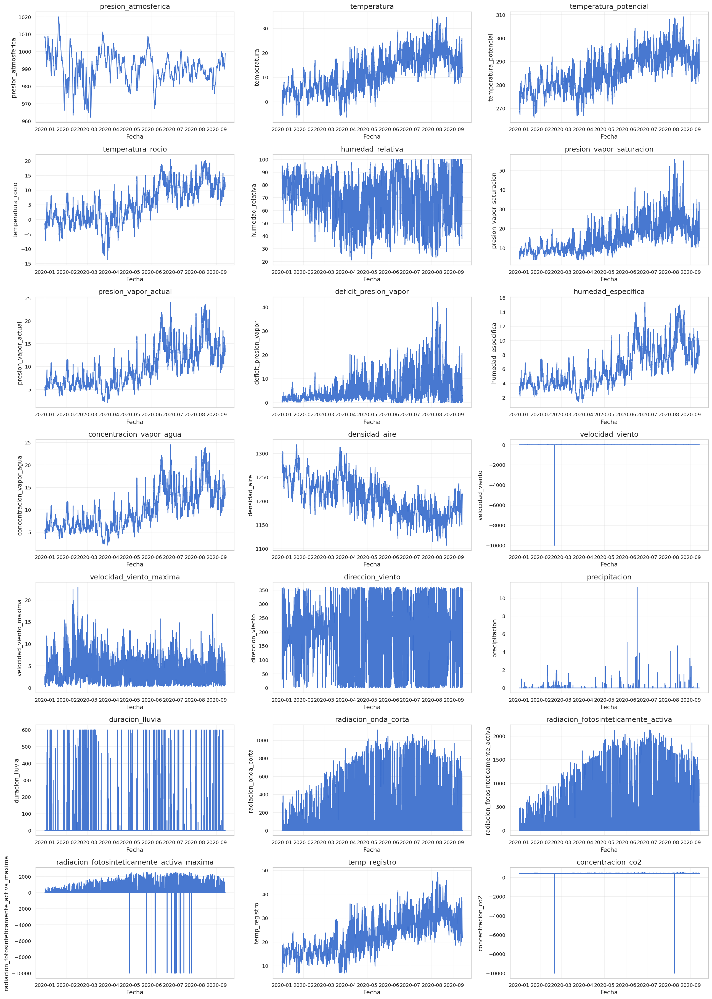

In [ ]:
import matplotlib.pyplot as plt


# ============================================================
# FUNCIÓN PARA VISUALIZAR UNA SERIE DE TIEMPO
# ============================================================

def graficar_serie_tiempo(columna):
    """
    Grafica una variable meteorológica de df_train
    a través del tiempo.

    Parámetro:
        columna: nombre de la columna que se desea visualizar.
    """

    # Crear una figura con un único gráfico
    plt.figure(figsize=(14, 5))

    # Graficar la variable seleccionada en función de la fecha
    plt.plot(
        df_train['fecha'],
        df_train[columna]
    )

    # Título del gráfico
    plt.title(f'Serie de tiempo - {columna}')

    # Nombre de los ejes
    plt.xlabel('Fecha')
    plt.ylabel(columna)

    # Agregar una cuadrícula para facilitar la lectura
    plt.grid(True, alpha=0.3)

    # Ajustar automáticamente los elementos del gráfico
    plt.tight_layout()

    # Mostrar el gráfico
    plt.show()


# ============================================================
# VISUALIZAR TODAS LAS VARIABLES
# ============================================================

# Obtener todas las columnas excepto 'fecha'
columnas = [columna for columna in df_train.columns if columna != 'fecha']


# Número total de gráficos
n_graficos = len(columnas)

# Tres gráficos por fila
n_columnas = 3

# Calcular cuántas filas son necesarias
n_filas = (n_graficos + n_columnas - 1) // n_columnas


# Crear la figura que contendrá todos los gráficos
fig, axes = plt.subplots(
    n_filas,
    n_columnas,
    figsize=(20, 4 * n_filas)
)

# Convertir los ejes en un arreglo unidimensional
axes = axes.flatten()


# Recorrer todas las variables
for i, columna in enumerate(columnas):

    # Graficar la serie temporal
    axes[i].plot(
        df_train['fecha'],
        df_train[columna]
    )

    # Título
    axes[i].set_title(columna)

    # Etiquetas de los ejes
    axes[i].set_xlabel('Fecha')
    axes[i].set_ylabel(columna)

    # Cuadrícula
    axes[i].grid(True, alpha=0.3)


# ============================================================
# ELIMINAR ESPACIOS SOBRANTES
# ============================================================

# Si el número de gráficos no es múltiplo de 3,
# pueden quedar espacios vacíos en la última fila.
# Estos espacios se eliminan.
for i in range(n_graficos, len(axes)):
    fig.delaxes(axes[i])


# Ajustar distribución
plt.tight_layout()

# Mostrar todos los gráficos
plt.show()

### Nivel y tendencia

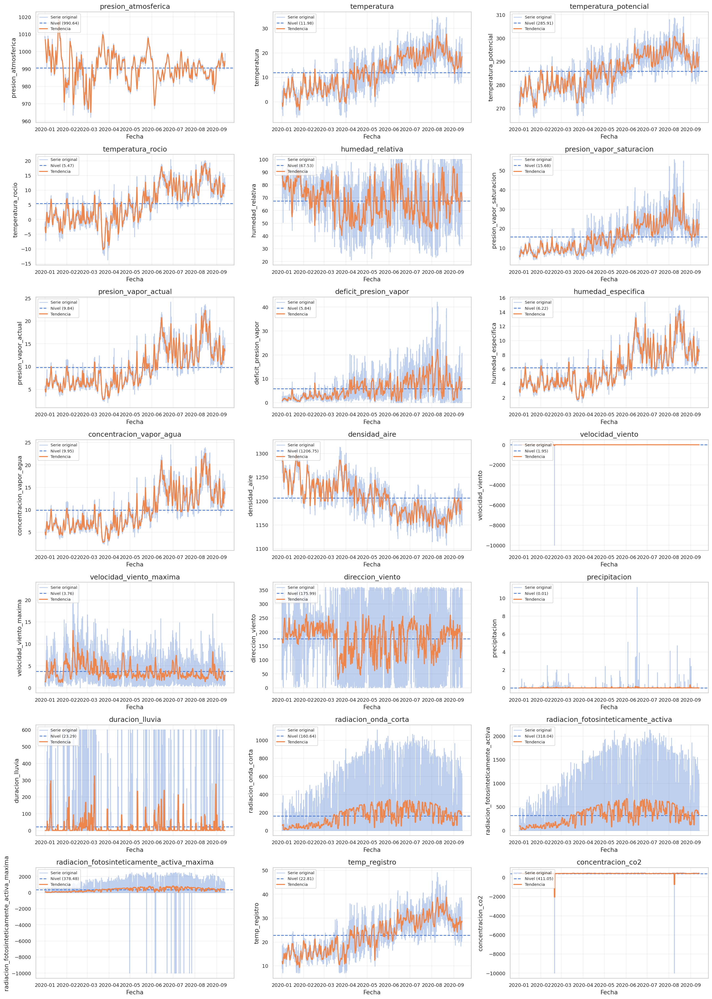

In [ ]:
import matplotlib.pyplot as plt


# ============================================================
# FUNCIÓN PARA VISUALIZAR NIVEL Y TENDENCIA
# ============================================================

def graficar_nivel_tendencia(columna, ventana=144):
    """
    Grafica una serie temporal mostrando:

    1. La serie original.
    2. El nivel, representado mediante el promedio global.
    3. La tendencia, representada mediante una media móvil.

    Parámetros:
        columna: nombre de la variable que se desea visualizar.
        ventana: cantidad de observaciones utilizadas para calcular
                 la media móvil.

                 Por defecto:
                 144 observaciones × 10 minutos = 24 horas.
    """

    # --------------------------------------------------------
    # Calcular el promedio global de la variable
    # --------------------------------------------------------

    nivel = df_train[columna].mean()


    # --------------------------------------------------------
    # Calcular la tendencia mediante una media móvil
    # --------------------------------------------------------

    tendencia = df_train[columna].rolling(
        window=ventana,
        center=True
    ).mean()


    # --------------------------------------------------------
    # Crear la figura
    # --------------------------------------------------------

    plt.figure(figsize=(14, 5))


    # --------------------------------------------------------
    # Serie temporal original
    # --------------------------------------------------------

    plt.plot(
        df_train['fecha'],
        df_train[columna],
        label='Serie original',
        alpha=0.35
    )


    # --------------------------------------------------------
    # Línea correspondiente al nivel
    # --------------------------------------------------------

    plt.axhline(
        y=nivel,
        label=f'Nivel (promedio = {nivel:.2f})',
        linestyle='--'
    )


    # --------------------------------------------------------
    # Línea correspondiente a la tendencia
    # --------------------------------------------------------

    plt.plot(
        df_train['fecha'],
        tendencia,
        label=f'Tendencia (media móvil de {ventana} observaciones)',
        linewidth=2
    )


    # --------------------------------------------------------
    # Título y etiquetas
    # --------------------------------------------------------

    plt.title(f'Nivel y tendencia - {columna}')

    plt.xlabel('Fecha')
    plt.ylabel(columna)


    # --------------------------------------------------------
    # Mostrar la leyenda en la esquina superior izquierda
    # --------------------------------------------------------

    plt.legend(loc='upper left')


    # --------------------------------------------------------
    # Cuadrícula
    # --------------------------------------------------------

    plt.grid(True, alpha=0.3)


    # Ajustar distribución
    plt.tight_layout()

    # Mostrar gráfico
    plt.show()


# ============================================================
# VISUALIZAR TODAS LAS VARIABLES
# ============================================================

# Obtener todas las columnas excepto 'fecha'
columnas = [
    columna
    for columna in df_train.columns
    if columna != 'fecha'
]


# Número de variables
n_graficos = len(columnas)

# Tres gráficos por fila
n_columnas = 3

# Calcular número de filas necesarias
n_filas = (n_graficos + n_columnas - 1) // n_columnas


# ------------------------------------------------------------
# Crear la figura con todos los subgráficos
# ------------------------------------------------------------

fig, axes = plt.subplots(
    n_filas,
    n_columnas,
    figsize=(20, 4 * n_filas)
)


# Convertir los ejes a un arreglo unidimensional
axes = axes.flatten()


# ============================================================
# RECORRER TODAS LAS VARIABLES
# ============================================================

for i, columna in enumerate(columnas):

    # --------------------------------------------------------
    # Calcular nivel
    # --------------------------------------------------------

    nivel = df_train[columna].mean()


    # --------------------------------------------------------
    # Calcular tendencia
    # --------------------------------------------------------

    tendencia = df_train[columna].rolling(
        window=144,
        center=True
    ).mean()


    # --------------------------------------------------------
    # Serie original
    # --------------------------------------------------------

    axes[i].plot(
        df_train['fecha'],
        df_train[columna],
        label='Serie original',
        alpha=0.35
    )


    # --------------------------------------------------------
    # Nivel
    # --------------------------------------------------------

    axes[i].axhline(
        y=nivel,
        label=f'Nivel ({nivel:.2f})',
        linestyle='--'
    )


    # --------------------------------------------------------
    # Tendencia
    # --------------------------------------------------------

    axes[i].plot(
        df_train['fecha'],
        tendencia,
        label='Tendencia',
        linewidth=2
    )


    # --------------------------------------------------------
    # Configuración del gráfico
    # --------------------------------------------------------

    axes[i].set_title(columna)

    axes[i].set_xlabel('Fecha')
    axes[i].set_ylabel(columna)

    axes[i].legend(
        loc='upper left',
        fontsize=8
    )

    axes[i].grid(
        True,
        alpha=0.3
    )


# ============================================================
# ELIMINAR GRÁFICOS SOBRANTES
# ============================================================

for i in range(n_graficos, len(axes)):
    fig.delaxes(axes[i])


# Ajustar espacios
plt.tight_layout()

# Mostrar todos los gráficos
plt.show()

### Estacionaridad

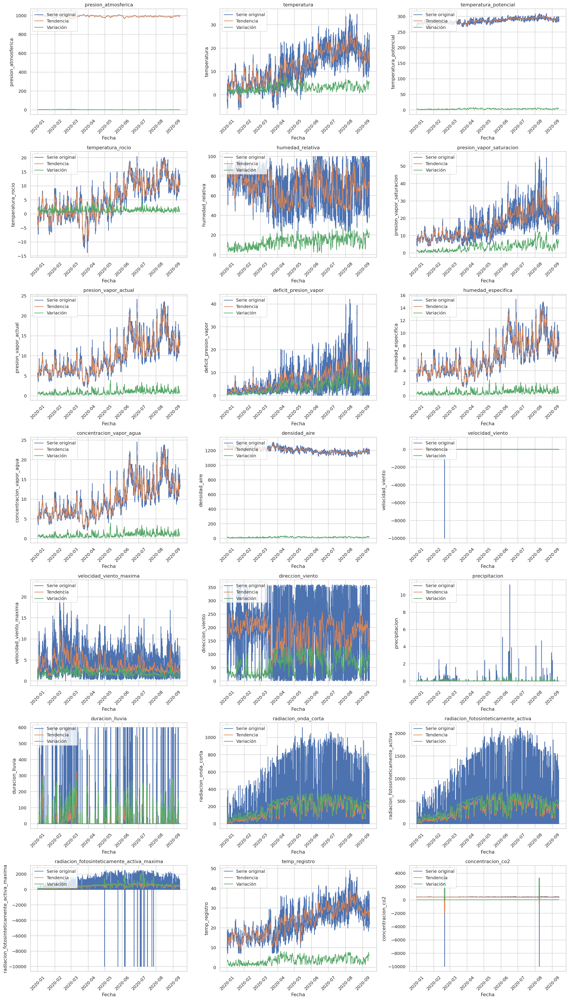

In [ ]:
import matplotlib.pyplot as plt


# ============================================================
# FUNCIÓN PARA VISUALIZAR TENDENCIA Y VARIACIÓN
# ============================================================

def graficar_tendencia_variacion(columna, ventana=144):
    tendencia = df_train[columna].rolling(
        window=ventana,
        center=True
    ).mean()

    variacion = df_train[columna].rolling(
        window=ventana,
        center=True
    ).std()

    plt.figure(figsize=(14, 5))

    # Serie original
    sns.lineplot(
        x=df_train['fecha'],
        y=df_train[columna],
        label='Serie original'
    )

    # Tendencia
    sns.lineplot(
        x=df_train['fecha'],
        y=tendencia,
        label='Tendencia'
    )

    # Variación
    sns.lineplot(
        x=df_train['fecha'],
        y=variacion,
        label='Variación (desviación estándar)'
    )

    plt.title(f'Tendencia y variación de {columna}')
    plt.xlabel('Fecha')
    plt.ylabel(columna)
    plt.legend(loc='upper left')
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()


# Apariencia clara, igual que los gráficos anteriores
sns.set_theme(style="whitegrid")

# Todas las variables numéricas, excepto fecha
variables_numericas = df_train.select_dtypes(
    include='number'
).columns

# Crear gráficos de 3 en 3
fig, axes = plt.subplots(
    nrows=(len(variables_numericas) + 2) // 3,
    ncols=3,
    figsize=(20, 5 * ((len(variables_numericas) + 2) // 3))
)

axes = axes.flatten()

for i, columna in enumerate(variables_numericas):

    tendencia = df_train[columna].rolling(
        window=144,
        center=True
    ).mean()

    variacion = df_train[columna].rolling(
        window=144,
        center=True
    ).std()

    axes[i].plot(
        df_train['fecha'],
        df_train[columna],
        label='Serie original'
    )

    axes[i].plot(
        df_train['fecha'],
        tendencia,
        label='Tendencia'
    )

    axes[i].plot(
        df_train['fecha'],
        variacion,
        label='Variación'
    )

    axes[i].set_title(columna)
    axes[i].set_xlabel('Fecha')
    axes[i].set_ylabel(columna)
    axes[i].legend(loc='upper left')
    axes[i].tick_params(axis='x', rotation=45)

# Eliminar espacios/gráficos sobrantes
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

### Dickey-Fuller

In [ ]:
# ============================================================
# PRUEBA DE DICKEY-FULLER AUMENTADA (ADF)
# ============================================================

# Importamos la prueba Augmented Dickey-Fuller desde statsmodels.
# Esta prueba permite determinar si una serie temporal presenta
# una raíz unitaria y, por tanto, si existe evidencia de que
# la serie NO es estacionaria.
from statsmodels.tsa.stattools import adfuller

# Importamos pandas para construir el DataFrame con los resultados.
import pandas as pd


# ============================================================
# FUNCIÓN PARA APLICAR DICKEY-FULLER A UNA VARIABLE
# ============================================================

def prueba_dickey_fuller(serie):
    """
    Aplica la prueba Augmented Dickey-Fuller (ADF) a una
    serie temporal y devuelve sus principales resultados.
    """

    # Eliminamos valores nulos antes de realizar la prueba.
    # ADF no puede trabajar directamente con valores NaN.
    serie = serie.dropna()

    # Ejecutamos la prueba ADF.
    #
    # adfuller() devuelve varios resultados:
    #
    # [0] Estadístico ADF
    # [1] p-value
    # [2] Número de rezagos utilizados
    # [3] Número de observaciones utilizadas
    # [4] Valores críticos para diferentes niveles
    # [5] Valor utilizado para el cálculo del estadístico
    resultado = adfuller(serie)

    # Extraemos el estadístico de la prueba.
    estadistico_adf = resultado[0]

    # Extraemos el p-value.
    p_value = resultado[1]

    # Extraemos la cantidad de rezagos utilizados.
    rezagos = resultado[2]

    # Extraemos la cantidad de observaciones utilizadas.
    observaciones = resultado[3]

    # Extraemos los valores críticos.
    valores_criticos = resultado[4]

    # Determinamos la conclusión utilizando un nivel
    # de significancia del 5%.
    #
    # H0: existe raíz unitaria -> la serie no es estacionaria.
    # H1: no existe raíz unitaria -> la serie es estacionaria.
    #
    # Si p-value < 0.05, rechazamos H0.
    if p_value < 0.05:
        conclusion = "Estacionaria"
    else:
        conclusion = "No estacionaria"

    # Devolvemos todos los resultados relevantes.
    return {
        'Estadístico ADF': estadistico_adf,
        'p-value': p_value,
        'Rezagos utilizados': rezagos,
        'Observaciones': observaciones,
        'Valor crítico 1%': valores_criticos['1%'],
        'Valor crítico 5%': valores_criticos['5%'],
        'Valor crítico 10%': valores_criticos['10%'],
        'Conclusión': conclusion
    }


# ============================================================
# SELECCIÓN DE LAS VARIABLES NUMÉRICAS
# ============================================================

# Seleccionamos únicamente las columnas numéricas de df_train.
#
# De esta forma:
# - Se incluyen las 21 variables meteorológicas.
# - Se excluye automáticamente 'fecha', porque es datetime
#   y no una variable numérica.
variables_numericas = df_train.select_dtypes(
    include='number'
).columns


# ============================================================
# APLICAR ADF A TODAS LAS VARIABLES
# ============================================================

# Creamos una lista vacía donde almacenaremos los resultados
# de cada variable.
resultados_adf = []


# Recorremos cada variable numérica.
for variable in variables_numericas:

    # Aplicamos la prueba Dickey-Fuller a la variable actual.
    resultado = prueba_dickey_fuller(
        df_train[variable]
    )

    # Agregamos el nombre de la variable al resultado.
    resultado['Variable'] = variable

    # Guardamos el resultado en la lista.
    resultados_adf.append(resultado)


# ============================================================
# CREAR DATAFRAME CON LOS RESULTADOS
# ============================================================

# Convertimos la lista de resultados en un DataFrame.
df_adf = pd.DataFrame(resultados_adf)


# Movemos la columna 'Variable' al comienzo para facilitar
# la lectura de la tabla.
df_adf = df_adf[
    [
        'Variable',
        'Estadístico ADF',
        'p-value',
        'Rezagos utilizados',
        'Observaciones',
        'Valor crítico 1%',
        'Valor crítico 5%',
        'Valor crítico 10%',
        'Conclusión'
    ]
]


# ============================================================
# MOSTRAR RESULTADOS
# ============================================================

# Mostramos el DataFrame completo.
display(df_adf)

/tmp/ipykernel_709/2678975607.py:39: FutureWarning: adfuller currently returns a plain tuple whose length depends on the store and autolag arguments. In release 0.16 or after July 2027, whichever is later, the default behavior will switch to always returning an ADFullerResult. Set result_object=True to switch now, or result_object=False to keep the current behavior and silence this warning.
  resultado = adfuller(serie)
/tmp/ipykernel_709/2678975607.py:39: FutureWarning: adfuller currently returns a plain tuple whose length depends on the store and autolag arguments. In release 0.16 or after July 2027, whichever is later, the default behavior will switch to always returning an ADFullerResult. Set result_object=True to switch now, or result_object=False to keep the current behavior and silence this warning.
  resultado = adfuller(serie)
/tmp/ipykernel_709/2678975607.py:39: FutureWarning: adfuller currently returns a plain tuple whose length depends on the store and autolag arguments. In

,Variable,Estadístico ADF,p-value,Rezagos utilizados,Observaciones,Valor crítico 1%,Valor crítico 5%,Valor crítico 10%,Conclusión
0,presion_atmosferica,-7.013640,6.820377e-10,53,36833,-3.430528,-2.861618,-2.566812,Estacionaria
1,temperatura,-8.323170,3.527581e-13,53,36833,-3.430528,-2.861618,-2.566812,Estacionaria
2,temperatura_potencial,-8.267693,4.887759e-13,53,36833,-3.430528,-2.861618,-2.566812,Estacionaria
3,temperatura_rocio,-5.148893,1.116945e-05,22,36864,-3.430527,-2.861618,-2.566812,Estacionaria
4,humedad_relativa,-22.598559,0.000000e+00,25,36861,-3.430527,-2.861618,-2.566812,Estacionaria
5,presion_vapor_saturacion,-9.485166,3.779888e-16,53,36833,-3.430528,-2.861618,-2.566812,Estacionaria
6,presion_vapor_actual,-5.237766,7.358263e-06,22,36864,-3.430527,-2.861618,-2.566812,Estacionaria
7,deficit_presion_vapor,-17.037215,8.244970e-30,53,36833,-3.430528,-2.861618,-2.566812,Estacionaria
8,humedad_especifica,-5.237334,7.373295e-06,22,36864,-3.430527,-2.861618,-2.566812,Estacionaria
9,concentracion_vapor_agua,-5.232476,7.544523e-06,22,36864,-3.430527,-2.861618,-2.566812,Estacionaria


# **Limpieza y feature engineering**

En esta sección se realiza el proceso de limpieza de datos y feature engineering sobre el conjunto de datos con el objetivo de mejorar su calidad y adecuarlo para el entrenamiento del modelo de aprendizaje automático. Para ello se realizan diferentes análisis y transformaciones orientadas a identificar problemas en los datos, como valores faltantes, variables redundantes o inconsistencias en los formatos. A partir de estos análisis se aplican reglas de limpieza, selección de variables y transformaciones apropiadas para cada tipo de dato. Posteriormente, estas transformaciones se integran en una pipeline de preprocesamiento que permite estandarizar el tratamiento de los datos y garantizar que el mismo proceso se aplique de forma consistente durante el entrenamiento y la evaluación del modelo. Finalmente, se realiza un primer entrenamiento de prueba con el fin de verificar el correcto funcionamiento del flujo de procesamiento y obtener una referencia inicial del desempeño del modelo.

## **Calcular presencia de nulos**

Este bloque realiza un análisis de valores faltantes en el conjunto de entrenamiento con el fin de evaluar la calidad y completitud de las variables. Para ello se calcula, para cada columna, tanto la cantidad absoluta de valores nulos como el porcentaje que representan respecto al total de registros, organizando esta información en una tabla ordenada de forma descendente según el porcentaje de valores faltantes. Este análisis permite identificar rápidamente las variables más afectadas por datos incompletos y sirve como justificación para decisiones posteriores dentro de la etapa de preparación de datos para la pipeline, como la eliminación de variables con alto porcentaje de nulos o la aplicación de técnicas de imputación para su tratamiento.

In [ ]:
total_rows = len(df_train)
null_percentages = (null_counts / total_rows) * 100

df_null_analysis = pd.DataFrame({
    'Columna': null_counts.index,
    'Cantidad_Nulos': null_counts.values,
    'Porcentaje_Nulos': null_percentages.values
})

# Ordenar por porcentaje de nulos de forma descendente para ver las columnas más afectadas
df_null_analysis = df_null_analysis.sort_values(by='Porcentaje_Nulos', ascending=False).reset_index(drop=True)

print("Análisis de valores nulos por columna:")
display(df_null_analysis.round(2))

Análisis de valores nulos por columna:


,Columna,Cantidad_Nulos,Porcentaje_Nulos
0,fecha,0,0.0
1,presion_atmosferica,0,0.0
2,temperatura,0,0.0
3,temperatura_potencial,0,0.0
4,temperatura_rocio,0,0.0
5,humedad_relativa,0,0.0
6,presion_vapor_saturacion,0,0.0
7,presion_vapor_actual,0,0.0
8,deficit_presion_vapor,0,0.0
9,humedad_especifica,0,0.0


Debido a la falta de nulos se identifican los datos atipicos para detenrminar posibble codificación equivalente a nulos

In [ ]:
def obtener_atipicos(df, columna, tipo=0):
    """
    Devuelve un DataFrame con los valores atípicos de una columna
    utilizando el método del rango intercuartílico (IQR).

    Parámetros
    ----------
    df : pandas.DataFrame
        Dataset original.

    columna : str
        Nombre de la columna numérica a analizar.

    tipo : int, opcional
        -1 : solamente valores por debajo del límite inferior.
         1 : solamente valores por encima del límite superior.
         0 : valores por debajo o por encima de ambos límites.

    Retorna
    -------
    pandas.DataFrame
        Filas que contienen valores atípicos.
    """

    Q1 = df[columna].quantile(0.25)
    Q3 = df[columna].quantile(0.75)

    IQR = Q3 - Q1

    limite_inferior = Q1 - 1.5 * IQR
    limite_superior = Q3 + 1.5 * IQR

    if tipo == -1:
        # Valores inferiores al límite inferior
        atipicos = df[
            df[columna] < limite_inferior
        ].copy()

    elif tipo == 1:
        # Valores superiores al límite superior
        atipicos = df[
            df[columna] > limite_superior
        ].copy()

    elif tipo == 0:
        # Valores inferiores o superiores
        atipicos = df[
            (df[columna] < limite_inferior) |
            (df[columna] > limite_superior)
        ].copy()

    else:
        raise ValueError("El parámetro 'tipo' debe ser -1, 0 o 1.")

    return atipicos

def obtener_estadisticas_atipicos(tipo):

    # Obtener las columnas numéricas
    columnas_numericas = df.select_dtypes(include=np.number).columns

    # Lista donde almacenaremos los resúmenes
    resumenes_atipicos = []

    for columna in columnas_numericas:

        # Obtener datos atípicos de la variable
        df_atipicos = obtener_atipicos(df, columna,tipo)

        # Si existen datos atípicos
        if not df_atipicos.empty:

            # Estadísticas descriptivas
            resumen = df_atipicos[columna].describe().to_frame().T

            # Guardamos el nombre de la variable como índice
            resumen.index = [columna]

            resumenes_atipicos.append(resumen)

    # Unir todos los resúmenes
    if resumenes_atipicos:
        resumen_atipicos = pd.concat(resumenes_atipicos)
    else:
        resumen_atipicos = pd.DataFrame()

    return resumen_atipicos

print("Datos atipicos inferiores")
obtener_estadisticas_atipicos(-1)



Datos atipicos inferiores


,count,mean,std,min,25%,50%,75%,max
presion_atmosferica,1056.0,964.152784,3.887858,955.58,962.4475,965.875,966.90,968.10
temperatura_rocio,9.0,-13.472222,0.278243,-13.81,-13.6600,-13.540,-13.31,-13.07
velocidad_viento,1.0,-9999.000000,NaN,-9999.00,-9999.0000,-9999.000,-9999.00,-9999.00
direccion_viento,997.0,6.646048,3.697437,0.00,3.5100,6.740,9.93,12.70
radiacion_fotosinteticamente_activa_maxima,30.0,-9999.000000,0.000000,-9999.00,-9999.0000,-9999.000,-9999.00,-9999.00
concentracion_co2,52.0,-9601.219231,2008.322196,-9999.00,-9999.0000,-9999.000,-9999.00,381.10


In [ ]:
print("Datos atipicos inferiores")
obtener_estadisticas_atipicos(1)

Datos atipicos inferiores


,count,mean,std,min,25%,50%,75%,max
presion_atmosferica,266.0,1017.011504,2.075618,1012.64,1015.5300,1017.105,1018.9000,1020.07
temperatura,52.0,33.988654,0.329932,33.58,33.6975,33.990,34.1925,34.80
temperatura_potencial,46.0,308.270870,0.333579,307.83,308.0350,308.150,308.5125,309.13
presion_vapor_saturacion,1341.0,39.189292,5.498528,33.35,34.8200,37.420,41.5500,55.67
presion_vapor_actual,807.0,21.501549,0.756580,20.44,20.8900,21.370,21.9750,24.16
deficit_presion_vapor,3877.0,19.664181,5.220296,14.35,15.9300,18.190,21.5500,42.10
humedad_especifica,821.0,13.635725,0.485862,12.95,13.2400,13.550,13.9400,15.40
concentracion_vapor_agua,798.0,21.773058,0.757112,20.71,21.1600,21.645,22.2500,24.53
densidad_aire,20.0,1317.543000,0.765122,1316.03,1316.7250,1317.695,1318.1150,1318.52
velocidad_viento,2020.0,6.976401,1.187232,5.81,6.1575,6.620,7.3900,13.77


Se identifico para las columnas velocidad_viento, radiacion_fotosinteticamente_activa_maxima y concentracion_co2 tienen una serie valores atipicos repetidos que son -9999, debido a que el valor no tiene sentido para dichas columnas junto a sus repetidas apariciones, parece que es el quivalente a la falta de una medición.

Por lo que para su posterior manejo se pasaran a valores nulos

In [ ]:
df_train = df_train.replace(-9999, np.nan)
df_val   = df_val.replace(-9999, np.nan)
df_test  = df_test.replace(-9999, np.nan)
df = df.replace(-9999, np.nan)

##Comprobar frecuencia temporal

In [ ]:
duplicados_fecha = df[df['fecha'].duplicated(keep=False)]
print(f"Registros con fecha duplicada: {len(duplicados_fecha)}")
duplicados_fecha.head(20)

Registros con fecha duplicada: 2


,fecha,presion_atmosferica,temperatura,temperatura_potencial,temperatura_rocio,humedad_relativa,presion_vapor_saturacion,presion_vapor_actual,deficit_presion_vapor,humedad_especifica,...,velocidad_viento,velocidad_viento_maxima,direccion_viento,precipitacion,duracion_lluvia,radiacion_onda_corta,radiacion_fotosinteticamente_activa,radiacion_fotosinteticamente_activa_maxima,temp_registro,concentracion_co2
19043,2020-05-12 06:00:00,991.53,-1.57,272.25,-2.09,96.2,5.44,5.24,0.21,3.29,...,1.04,1.68,215.4,0.0,0.0,84.91,176.64,199.61,10.19,445.9
19044,2020-05-12 06:00:00,991.53,-1.57,272.25,-2.09,96.2,5.44,5.24,0.21,3.29,...,1.04,1.68,215.4,0.0,0.0,84.91,176.64,199.61,10.19,445.9


In [ ]:
df['diferencia_tiempo'] = df['fecha'].diff()

frecuencia_esperada = pd.Timedelta(minutes=10)

intervalos_incorrectos = df[
    df['diferencia_tiempo'].notna() &
    (df['diferencia_tiempo'] != frecuencia_esperada)
]

print(f"Intervalos incorrectos: {len(intervalos_incorrectos)}")

intervalos_incorrectos[
    ['fecha', 'diferencia_tiempo']
].head(20)

Intervalos incorrectos: 2


,fecha,diferencia_tiempo
19044,2020-05-12 06:00:00,0 days 00:00:00
21514,2020-05-29 11:10:00,0 days 01:40:00


Se eliminan los duplicados

In [ ]:
df_train = df_train.drop_duplicates()
df_val   = df_val.drop_duplicates()
df_test  = df_test.drop_duplicates()
df = df.drop_duplicates()

Se identificó un único intervalo temporal irregular entre las 09:30 y las 11:10 del 29 de mayo de 2020, correspondiente a 9 observaciones faltantes respecto a la frecuencia esperada de 10 minutos.

In [ ]:
idx = 21514
print(df.loc[idx-3:idx+3, ['fecha']])

fecha_inicio = pd.Timestamp('2020-05-29 09:30:00')
fecha_fin = pd.Timestamp('2020-05-29 11:10:00')

fechas_esperadas = pd.date_range(
    start=fecha_inicio,
    end=fecha_fin,
    freq='10min'
)

fechas_faltantes = fechas_esperadas[
    ~fechas_esperadas.isin(df['fecha'])
]

print("\nFechas faltantes:")
for fecha in fechas_faltantes:
    print(fecha)

                    fecha
21511 2020-05-29 09:10:00
21512 2020-05-29 09:20:00
21513 2020-05-29 09:30:00
21514 2020-05-29 11:10:00
21515 2020-05-29 11:20:00
21516 2020-05-29 11:30:00
21517 2020-05-29 11:40:00

Fechas faltantes:
2020-05-29 09:40:00
2020-05-29 09:50:00
2020-05-29 10:00:00
2020-05-29 10:10:00
2020-05-29 10:20:00
2020-05-29 10:30:00
2020-05-29 10:40:00
2020-05-29 10:50:00
2020-05-29 11:00:00


##Imputar valores
Se imputan los valores faltantes. Los valores faltantes fueron imputados mediante interpolación lineal excepto la dirección del viento, considerando la alta resolución temporal del dataset (10 minutos) y el comportamiento observado de las variables

In [ ]:
def completar_e_imputar(df, frecuencia='10min'):
    """
    Completa timestamps faltantes y realiza imputación según
    el tipo de variable meteorológica.

    Parámetros
    ----------
    df : pandas.DataFrame
        Dataset a procesar.

    frecuencia : str
        Frecuencia temporal esperada.

    Retorna
    -------
    pandas.DataFrame
        Dataset con frecuencia regular e imputación.
    """

    df = df.copy()

    # ---------------------------------------------------------
    # 1. Preparar fecha
    # ---------------------------------------------------------

    df['fecha'] = pd.to_datetime(df['fecha'])

    df = (
        df
        .sort_values('fecha')
        .drop_duplicates(subset='fecha')
        .reset_index(drop=True)
    )

    # ---------------------------------------------------------
    # 2. Crear todas las fechas esperadas
    # ---------------------------------------------------------

    fechas_completas = pd.date_range(
        start=df['fecha'].min(),
        end=df['fecha'].max(),
        freq=frecuencia
    )

    # Utilizamos fecha temporalmente como índice
    df_aux = df.set_index('fecha')

    # Agrega las fechas faltantes
    df_aux = df_aux.reindex(fechas_completas)

    df_aux.index.name = 'fecha'

    # Volvemos a dejar fecha como columna
    df = df_aux.reset_index()

    # ---------------------------------------------------------
    # 3. Variables continuas
    # ---------------------------------------------------------

    columnas_interpolacion = [
        'presion_atmosferica',
        'temperatura',
        'temperatura_potencial',
        'temperatura_rocio',
        'humedad_relativa',
        'presion_vapor_saturacion',
        'presion_vapor_actual',
        'deficit_presion_vapor',
        'humedad_especifica',
        'concentracion_vapor_agua',
        'densidad_aire',
        'velocidad_viento',
        'velocidad_viento_maxima',
        'precipitacion',
        'duracion_lluvia',
        'radiacion_onda_corta',
        'radiacion_fotosinteticamente_activa',
        'radiacion_fotosinteticamente_activa_maxima',
        'temp_registro',
        'concentracion_co2'
    ]

    columnas_interpolacion = [
        col for col in columnas_interpolacion
        if col in df.columns
    ]

    # Interpolación temporal
    df[columnas_interpolacion] = (
        df[columnas_interpolacion]
        .interpolate(method='linear')
    )

    # ---------------------------------------------------------
    # 4. Dirección del viento
    # ---------------------------------------------------------

    if 'direccion_viento' in df.columns:

        # Convertir grados a coordenadas circulares
        angulo = np.deg2rad(df['direccion_viento'])

        seno = np.sin(angulo)
        coseno = np.cos(angulo)

        # Interpolar cada componente
        seno = pd.Series(seno).interpolate()
        coseno = pd.Series(coseno).interpolate()

        # Reconstruir el ángulo
        direccion = np.rad2deg(
            np.arctan2(seno, coseno)
        ) % 360

        # Mantener los valores originales donde existían
        mascara_original = df['direccion_viento'].notna()

        df.loc[~mascara_original, 'direccion_viento'] = direccion[
            ~mascara_original
        ]

    return df

df_train = completar_e_imputar(df_train)
df_val = completar_e_imputar(df_val)
df_test = completar_e_imputar(df_test)

## Modificar valores

Para mayor interpretabilidad del modelo el angulo de la direción del viento se organiza en forma de dos variables represantando el seno y el coseno del angulo. Por lo que ya seran 22 variables meteorologicas ya que la dirección del viento esta representada en dos

In [ ]:
import numpy as np

def transformar_direccion_viento(dataset):
    """
    Transforma la variable direccion_viento, expresada en grados,
    en dos variables continuas: seno y coseno.

    Parámetros
    ----------
    dataset : pandas.DataFrame
        Dataset que contiene la columna 'direccion_viento'.

    Retorna
    -------
    pandas.DataFrame
        Dataset con 'direccion_viento' reemplazada por
        'dir_viento_sen' y 'dir_viento_cos'.
    """

    # Crear una copia para no modificar directamente el dataset original
    dataset = dataset.copy()

    # Convertir los grados a radianes
    angulo_rad = np.deg2rad(dataset['direccion_viento'])

    # Representar la dirección mediante sus componentes seno y coseno
    dataset['dir_viento_sen'] = np.sin(angulo_rad)
    dataset['dir_viento_cos'] = np.cos(angulo_rad)

    # Eliminar la variable original
    dataset = dataset.drop(columns=['direccion_viento'])

    return dataset

df_train = transformar_direccion_viento(df_train)
df_val = transformar_direccion_viento(df_val)
df_test = transformar_direccion_viento(df_test)

In [ ]:
df_train.columns

Index(['fecha', 'presion_atmosferica', 'temperatura', 'temperatura_potencial',
       'temperatura_rocio', 'humedad_relativa', 'presion_vapor_saturacion',
       'presion_vapor_actual', 'deficit_presion_vapor', 'humedad_especifica',
       'concentracion_vapor_agua', 'densidad_aire', 'velocidad_viento',
       'velocidad_viento_maxima', 'precipitacion', 'duracion_lluvia',
       'radiacion_onda_corta', 'radiacion_fotosinteticamente_activa',
       'radiacion_fotosinteticamente_activa_maxima', 'temp_registro',
       'concentracion_co2', 'dir_viento_sen', 'dir_viento_cos'],
      dtype='object')

##Generación de modelos

Este bloque prepara las 22 variables meteorológicas para ser utilizadas por los modelos de forecasting mediante una estandarización con StandardScaler. Primero se define el conjunto de variables que participarán en el problema multivariante y posteriormente se ajusta el escalador exclusivamente con el conjunto de entrenamiento, calculando para cada variable su media y desviación estándar. Esas mismas estadísticas se utilizan después para transformar validation y test, evitando que estos conjuntos influyan en el proceso de preparación del entrenamiento y reduciendo así el riesgo de data leakage. Finalmente, los tres conjuntos estandarizados se convierten nuevamente en DataFrame, conservando los nombres de las variables para facilitar su posterior utilización en la creación de ventanas y entrenamiento de los modelos.

In [ ]:
from sklearn.preprocessing import StandardScaler


# Lista de las variables numéricas que serán utilizadas por los modelos.
#
# La variable 'fecha' NO se incluye porque representa el componente temporal
# utilizado para ordenar y construir las ventanas, pero no se introduce
# directamente como una variable numérica del modelo.
#
# Las 22 variables se utilizarán conjuntamente, por lo que el problema
# continúa siendo un forecasting multivariante.
variables = [
    'presion_atmosferica',
    'temperatura',
    'temperatura_potencial',
    'temperatura_rocio',
    'humedad_relativa',
    'presion_vapor_saturacion',
    'presion_vapor_actual',
    'deficit_presion_vapor',
    'humedad_especifica',
    'concentracion_vapor_agua',
    'densidad_aire',
    'velocidad_viento',
    'velocidad_viento_maxima',
    'precipitacion',
    'duracion_lluvia',
    'radiacion_onda_corta',
    'radiacion_fotosinteticamente_activa',
    'radiacion_fotosinteticamente_activa_maxima',
    'temp_registro',
    'concentracion_co2',
    'dir_viento_sen',
    'dir_viento_cos'
]

scaler = StandardScaler()

# Ajustamos el StandardScaler utilizando ÚNICAMENTE los datos de entrenamiento.
# Es importante que el scaler se ajuste únicamente con train para
# evitar data leakage.
train_scaled = scaler.fit_transform(
    df_train[variables]
)

# Transformamos el conjunto de validación utilizando el scaler
# que ya fue ajustado con los datos de entrenamiento.
#
# NO se vuelve a utilizar fit() sobre validation.
#
# De esta forma, validation utiliza exactamente las mismas medias
# y desviaciones estándar calculadas a partir de train.
val_scaled = scaler.transform(
    df_val[variables]
)

# Transformamos el conjunto de prueba utilizando nuevamente el mismo
# scaler ajustado exclusivamente con train.
test_scaled = scaler.transform(
    df_test[variables]
)


# Convertimos nuevamente los datos estandarizados
# a DataFrames conservando los nombres de las 22 variables.
train_scaled = pd.DataFrame(
    train_scaled,
    columns=variables
)
val_scaled = pd.DataFrame(
    val_scaled,
    columns=variables
)
test_scaled = pd.DataFrame(
    test_scaled,
    columns=variables
)

Este bloque transforma cada conjunto de datos temporal continuo en ejemplos supervisados de forecasting mediante una ventana deslizante. Se utilizan 96 observaciones históricas, equivalentes a 16 horas, para predecir las 96 observaciones siguientes, también equivalentes a 16 horas. En cada desplazamiento de la ventana se construye un par (X, y), donde X contiene simultáneamente las 22 variables durante las últimas 96 observaciones y y contiene esas mismas 22 variables durante las siguientes 96 observaciones. De esta forma, el problema queda definido como 96 × 22 → 96 × 22, es decir, utilizar información multivariante de las últimas 16 horas para realizar un pronóstico multivariante de las próximas 16 horas.

In [ ]:
# Cantidad de observaciones históricas que utilizará el modelo
# para realizar cada pronóstico.
#
# Como los datos tienen una frecuencia de 10 minutos:
#
# 96 observaciones × 10 minutos = 960 minutos = 16 horas
#
# Por tanto, cada modelo utilizará las últimas 16 horas
# de información como contexto.
seq_len = 96

# Cantidad de observaciones futuras que deberá pronosticar el modelo.
#
# 96 observaciones × 10 minutos = 16 horas
#
# Por tanto, el objetivo será pronosticar las siguientes 16 horas.
pred_len = 96

def crear_ventanas(data, seq_len, pred_len):
    """
    Convierte una serie temporal multivariante continua
    en múltiples ejemplos de entrenamiento para forecasting.

    Cada ejemplo está compuesto por:

        X → información histórica
        y → valores futuros que el modelo debe aprender a predecir

    Retorna:
        X -> [muestras, seq_len, variables]
        y -> [muestras, pred_len, variables]
    """

    # Convertimos los datos recibidos a un array de NumPy utilizando float32.
    #
    # Este tipo de dato es apropiado para trabajar posteriormente
    # con PyTorch y permite utilizar menos memoria que float64.
    data = np.asarray(data, dtype=np.float32)

    # Lista donde almacenaremos las ventanas de entrada.
    # Cada elemento tendrá la forma:
    #     [seq_len, variables]
    X = []

    # Lista donde almacenaremos los valores que el modelo
    # debe aprender a pronosticar.
    y = []

    # Calculamos cuántas ventanas completas pueden construirse.
    # Necesitamos espacio suficiente para:
    #
    #     seq_len → observaciones históricas
    #     pred_len → observaciones futuras
    #
    # El +1 permite incluir la última ventana que todavía
    # tenga suficientes observaciones.
    limite = len(data) - seq_len - pred_len + 1

    # Recorremos la serie temporal para construir las ventanas.
    # Cada desplazamiento de i representa un nuevo ejemplo
    # de forecasting.
    for i in range(limite):

        # Extraemos las observaciones históricas que servirán
        # como entrada del modelo desde i hasta i + seq_len
        #
        # Como el límite superior no se incluye, obtenemos
        # exactamente seq_len observaciones.
        #
        # Forma resultante: [96, 22]
        X.append(
            data[i:i + seq_len]
        )

        # Extraemos las observaciones inmediatamente posteriores
        # a la ventana de entrada.
        #
        # Estas son las observaciones futuras que el modelo
        # debe aprender a pronosticar.
        #
        # Comienza exactamente donde termina X: i + seq_len
        # y termina en: i + seq_len + pred_len
        #
        # Forma resultante: [96, 22]
        y.append(
            data[i + seq_len:i + seq_len + pred_len]
        )

    # Convertimos las listas de ventanas a arrays de NumPy.
    #
    # De esta manera, cada muestra contiene:
    #
    #     96 pasos históricos × 22 variables
    #
    # para predecir:
    #
    #     96 pasos futuros × 22 variables
    return np.array(X), np.array(y)



Este bloque aplica la función crear_ventanas() de forma independiente sobre los tres conjuntos temporales previamente preparados: entrenamiento, validación y prueba. Así, X_train contiene las ventanas históricas y y_train sus respectivos valores futuros para entrenar los modelos; X_val e y_val cumplen la misma función durante la validación; y X_test e y_test contienen las ventanas reservadas para la evaluación final. En los tres casos se mantiene exactamente el mismo problema de forecasting: 96 observaciones históricas de las 22 variables → 96 observaciones futuras de las 22 variables, permitiendo posteriormente comparar los modelos bajo las mismas condiciones.

In [ ]:
# ============================================================
# CREACIÓN DE LAS VENTANAS DE ENTRENAMIENTO
# ============================================================
#
# Utilizamos la definida anteriormente transformar los datos de entrenamiento
# en ejemplos supervisados de forecasting.
#
# Cada ejemplo tendrá:
#
#     X → 96 observaciones históricas × 22 variables
#     y → 96 observaciones futuras × 22 variables
#
# Por lo tanto:
#
#     X → [muestras, 96, 22]
#     y → [muestras, 96, 22]
#
# Estas ventanas serán utilizadas para entrenar los modelos.
X_train, y_train = crear_ventanas(

    # Datos estandarizados correspondientes únicamente al conjunto de entrenamiento.
    train_scaled,

    # Número de observaciones históricas utilizadas
    # como entrada.
    seq_len,

    # Número de observaciones futuras que se deben
    # pronosticar.
    pred_len

)


# ============================================================
# CREACIÓN DE LAS VENTANAS DE VALIDACIÓN
# ============================================================
#
# Aplicamos exactamente el mismo procedimiento al conjunto de validación.
#
# Estas ventanas serán utilizadas durante el entrenamiento
# para evaluar qué tan bien generaliza el modelo sobre datos
# que no utilizó para actualizar sus pesos.
X_val, y_val = crear_ventanas(

    # Datos estandarizados correspondientes al conjunto de validación.
    val_scaled,
    seq_len,
    pred_len

)


# ============================================================
# CREACIÓN DE LAS VENTANAS DE PRUEBA
# ============================================================
#
# Finalmente construimos las ventanas del conjunto de test.
#
# Los valores reales contenidos en y_test se utilizarán
# posteriormente para evaluar el rendimiento final de los
# modelos.
X_test, y_test = crear_ventanas(

    # Datos estandarizados correspondientes únicamente al conjunto de prueba.
    test_scaled,
    seq_len,
    pred_len

)

Este bloque prepara las ventanas de forecasting para poder utilizarlas con PyTorch. Primero determina automáticamente si los modelos se ejecutarán mediante GPU CUDA o CPU; en tu ejecución se seleccionó CPU, lo que significa que actualmente el entrenamiento de LSTM, TSMixer e iTransformer se realizará utilizando el procesador. Después, X e y de cada partición se convierten en tensores y se agrupan mediante TensorDataset, manteniendo asociada cada ventana histórica con su correspondiente horizonte futuro. Finalmente, los DataLoader permiten entregar estos datos a los modelos en lotes de hasta 64 ventanas simultáneamente. El entrenamiento utiliza shuffle=True, mientras que validación y test utilizan shuffle=False, ya que estos últimos se emplean únicamente para evaluación y no para actualizar los parámetros de los modelos.

In [ ]:
# Para construir y entrenar los modelos de Deep Learning.
import torch


# Contiene las clases y funciones necesarias para definir
# arquitecturas como LSTM, TSMixer e iTransformer.
import torch.nn as nn


# TensorDataset → permite organizar los datos de entrada (X)
#                 junto con sus valores objetivo (y).
#
# DataLoader → permite obtener los datos en lotes (batches)
#              durante el entrenamiento y la evaluación.
from torch.utils.data import TensorDataset, DataLoader


# Determinamos automáticamente qué dispositivo utilizar
# para ejecutar los modelos.
#
# torch.cuda.is_available() comprueba si existe una GPU
# compatible con CUDA disponible para PyTorch.
#
# Si existe: se utiliza 'cuda' (GPU).
#
# Si no existe: se utiliza 'cpu' (procesador).
device = torch.device(

    'cuda' if torch.cuda.is_available() else 'cpu'

)


# Mostramos el dispositivo seleccionado.
print("Dispositivo:", device)


# Cantidad de ejemplos que serán procesados simultáneamenteen cada batch.
#
# Es decir, durante una iteración del entrenamiento,
# el modelo recibirá hasta 64 ventanas de forecasting.
batch_size = 64


# ============================================================
# DATASET DE ENTRENAMIENTO
# ============================================================
#
# Convertimos X_train e y_train, que actualmente son arrays
# de NumPy, en tensores de PyTorch.
#
# X_train: [muestras, 96, 22]
#
# y_train: [muestras, 96, 22]
#
# TensorDataset mantiene cada X asociado con su correspondiente y.
train_dataset = TensorDataset(

    # Convertimos las ventanas históricas de entrenamiento
    # a tensores de tipo float32.
    torch.tensor(X_train, dtype=torch.float32),

    # Convertimos los valores futuros reales de entrenamiento
    # a tensores de tipo float32.
    torch.tensor(y_train, dtype=torch.float32)

)


# ============================================================
# DATASET DE VALIDACIÓN
# ============================================================
#
# Realizamos el mismo proceso para las ventanas de validación.
val_dataset = TensorDataset(

    torch.tensor(X_val, dtype=torch.float32),

    torch.tensor(y_val, dtype=torch.float32)

)


# ============================================================
# DATASET DE PRUEBA
# ============================================================
#
# Finalmente convertimos las ventanas de test a un
# TensorDataset.
test_dataset = TensorDataset(

    torch.tensor(X_test, dtype=torch.float32),

    torch.tensor(y_test, dtype=torch.float32)

)


# ============================================================
# DATA LOADER DE ENTRENAMIENTO
# ============================================================
#
# DataLoader permite recorrer train_dataset en batches
# durante el entrenamiento.
#
# batch_size=64: procesa hasta 64 ventanas simultáneamente.
#
# shuffle=True:
#     mezcla aleatoriamente las ventanas de entrenamiento
#     en cada recorrido del dataset.
#
# Esto evita que el modelo procese siempre las ventanas
# exactamente en el mismo orden durante el entrenamiento.
train_loader = DataLoader(

    train_dataset,

    batch_size=batch_size,

    shuffle=True

)


# ============================================================
# DATA LOADER DE VALIDACIÓN
# ============================================================
#
# Permite recorrer las ventanas de validación en batches.
#
# Aquí utilizamos shuffle=False porque no necesitamos
# aleatorizar los datos durante la validación.
#
# El modelo únicamente realiza predicciones y calcula
# el error; sus pesos no se actualizan.
val_loader = DataLoader(

    val_dataset,

    batch_size=batch_size,

    shuffle=False

)


# ============================================================
# DATA LOADER DE TEST
# ============================================================
#
# Permite recorrer las ventanas del conjunto de prueba.
#
# Al igual que en validation, no mezclamos las ventanas,
# por lo que utilizamos shuffle=False.
#
# Este DataLoader será utilizado posteriormente para
# generar o evaluar las predicciones finales.
test_loader = DataLoader(

    test_dataset,

    batch_size=batch_size,

    shuffle=False

)

Dispositivo: cpu


###LSTM

In [ ]:
class LSTMForecaster(nn.Module):

    # Constructor del modelo.
    # Define la arquitectura y los principales hiperparámetros.
    def __init__(
        self,
        input_size,       # Número de variables de entrada.
        hidden_size=128,  # Tamaño del estado oculto de la LSTM.
        num_layers=2,     # Número de capas LSTM apiladas.
        pred_len=96,      # Cantidad de pasos temporales que se pronosticarán.
        dropout=0.2       # Porcentaje de dropout para regularización.
    ):
        # Inicializa la clase base de PyTorch (nn.Module).
        super().__init__()

        # Guarda el horizonte de predicción para utilizarlo posteriormente
        # durante la generación de la salida.
        self.pred_len = pred_len

        # Define la red LSTM.
        self.lstm = nn.LSTM(
            input_size=input_size,       # 22 variables meteorológicas por instante.
            hidden_size=hidden_size,     # 128 unidades en el estado oculto.
            num_layers=num_layers,       # 2 capas LSTM.
            batch_first=True,            # La entrada tendrá formato [batch, tiempo, variables].
            # El dropout se aplica entre las capas LSTM.
            # Si solo hubiera una capa, PyTorch no aplicaría dropout.
            dropout=dropout if num_layers > 1 else 0
        )

        # Capa totalmente conectada encargada de transformar
        # el contexto aprendido por la LSTM en todas las predicciones futuras.
        self.output = nn.Linear(
            hidden_size,                 # Entrada: vector de 128 características.
            pred_len * input_size        # Salida: 96 pasos × 22 variables.
        )

    # Define cómo fluyen los datos a través del modelo.
    def forward(self, x):

        # x representa las ventanas de entrada.
        # Su forma es:
        # [batch, seq_len, variables]
        #
        # En este proyecto:
        # [batch, 96, 22]

        # La LSTM procesa toda la secuencia temporal.
        #
        # "_" ignora la salida de la LSTM en cada instante temporal.
        # "hidden" contiene los estados ocultos de las capas.
        # "_" ignora el estado de celda de la LSTM.
        _, (hidden, _) = self.lstm(x)

        # Se toma el estado oculto de la última capa LSTM.
        #
        # hidden tiene una estructura:
        # [num_layers, batch, hidden_size]
        #
        # hidden[-1] selecciona la última capa:
        # [batch, hidden_size]
        context = hidden[-1]

        # El vector de contexto se pasa por la capa lineal.
        #
        # Entrada:
        # [batch, 128]
        #
        # Salida:
        # [batch, 96 × 22]
        output = self.output(context)

        # Se reorganiza la salida para representar explícitamente
        # los pasos temporales y las variables.
        #
        # Antes:
        # [batch, 96 × 22]
        #
        # Después:
        # [batch, 96, 22]
        output = output.reshape(
            x.size(0),      # Mantiene el tamaño del batch.
            self.pred_len,  # 96 pasos temporales futuros.
            -1              # Las 22 variables.
        )

        # Devuelve el pronóstico completo.
        return output


# Crea una instancia concreta del modelo LSTM.
lstm = LSTMForecaster(
    input_size=22,       # 22 variables meteorológicas.
    hidden_size=128,     # 128 unidades ocultas.
    num_layers=2,        # 2 capas LSTM.
    pred_len=pred_len,   # Horizonte de predicción definido anteriormente: 96.
    dropout=0.2          # 20% de dropout entre las capas.
).to(device)             # Envía el modelo al dispositivo disponible (CPU o GPU).

###TSMixer

En cada TSMixerBlock primero aprende cómo se relacionan los diferentes momentos del historial mediante time_mixing y después aprende cómo se relacionan las diferentes variables meteorológicas mediante feature_mixing. Las conexiones residuales permiten conservar la información original mientras se incorporan las nuevas representaciones aprendidas. En la configuración se apilan 4 bloques, por lo que esta mezcla temporal y entre variables se realiza repetidamente. Finalmente, la capa output transforma los 96 pasos históricos en 96 pasos futuros para cada una de las 22 variables, produciendo [batch, 96, 22].

In [ ]:
class TSMixerBlock(nn.Module):

    # Constructor de un bloque TSMixer.
    # Cada bloque realiza dos tipos de mezcla:
    # 1. Mezcla temporal: aprende relaciones entre diferentes instantes.
    # 2. Mezcla de variables: aprende relaciones entre las variables.
    def __init__(
        self,
        seq_len,             # Número de pasos temporales de entrada: 96.
        num_variables,       # Número de variables: 22.
        hidden_time=128,     # Tamaño de la capa oculta para la mezcla temporal.
        hidden_feature=128,  # Tamaño de la capa oculta para la mezcla entre variables.
        dropout=0.2          # Dropout utilizado como regularización.
    ):
        # Inicializa la clase base nn.Module.
        super().__init__()

        # Normaliza las características de cada instante temporal.
        # La normalización se realiza sobre las variables.
        self.norm1 = nn.LayerNorm(num_variables)

        # Red encargada de realizar la mezcla temporal.
        #
        # Antes del bloque:
        # [batch, variables, tiempo]
        #
        # La primera capa transforma:
        # seq_len → hidden_time
        #
        # La segunda vuelve a transformar:
        # hidden_time → seq_len
        #
        # Por lo tanto, la cantidad de pasos temporales se mantiene.
        self.time_mixing = nn.Sequential(
            nn.Linear(seq_len, hidden_time),
            nn.GELU(),
            nn.Dropout(dropout),
            nn.Linear(hidden_time, seq_len),
            nn.Dropout(dropout)
        )

        # Segunda normalización, utilizada antes de mezclar
        # información entre las diferentes variables.
        self.norm2 = nn.LayerNorm(num_variables)

        # Red encargada de realizar la mezcla entre variables.
        #
        # Para cada instante temporal:
        # num_variables → hidden_feature → num_variables
        #
        # Esto permite que las variables interactúen entre sí.
        self.feature_mixing = nn.Sequential(
            nn.Linear(num_variables, hidden_feature),
            nn.GELU(),
            nn.Dropout(dropout),
            nn.Linear(hidden_feature, num_variables),
            nn.Dropout(dropout)
        )

    def forward(self, x):

        # La entrada tiene la forma:
        # [batch, time, variables]
        #
        # En este proyecto: [B, 96, 22]

        # Guarda la entrada original para utilizar una conexión residual
        # después de la mezcla temporal.
        residual = x

        # Normaliza las variables.
        x = self.norm1(x)

        # -------------------------
        # Mezcla temporal
        # -------------------------

        # Cambia el orden de las dimensiones:
        #
        # Antes: [B, T, V]
        #
        # Después: [B, V, T]
        #
        # Esto permite aplicar las capas Linear sobre la dimensión temporal.
        x = x.transpose(1, 2)

        # Aplica la red de mezcla temporal.
        #
        # Cada variable puede aprender patrones y relaciones
        # entre sus diferentes instantes históricos.
        x = self.time_mixing(x)

        # Regresa al formato original: [B, V, T] → [B, T, V]
        x = x.transpose(1, 2)

        # Conexión residual.
        #
        # Se suma la información original con la información
        # transformada por la mezcla temporal.
        x = residual + x

        # -------------------------
        # Mezcla entre variables
        # -------------------------

        # Guarda nuevamente la entrada para la segunda conexión residual.
        residual = x

        # Normaliza antes de realizar la mezcla entre variables.
        x = self.norm2(x)

        # Aplica la red de mezcla entre variables.
        #
        # Para cada instante temporal, aprende relaciones
        # entre las 22 variables meteorológicas.
        x = self.feature_mixing(x)

        # Segunda conexión residual.
        #
        # Combina la información original del bloque con
        # la información obtenida mediante la mezcla de variables.
        x = residual + x

        # Devuelve la representación procesada por el bloque.
        return x


class TSMixer(nn.Module):

    # Constructor del modelo TSMixer completo.
    # Está compuesto por varios TSMixerBlock consecutivos.
    def __init__(
        self,
        seq_len,             # Longitud de la ventana de entrada: 96.
        pred_len,            # Horizonte de predicción: 96.
        num_variables,       # Número de variables meteorológicas: 22.
        num_blocks=4,        # Número de bloques TSMixer apilados.
        hidden_time=128,     # Tamaño oculto de la mezcla temporal.
        hidden_feature=128,  # Tamaño oculto de la mezcla entre variables.
        dropout=0.2          # Dropout utilizado en los bloques.
    ):
        # Inicializa la clase base nn.Module.
        super().__init__()

        # Guarda el horizonte de predicción.
        self.pred_len = pred_len

        # Crea los bloques TSMixer.
        #
        # Se generan num_blocks bloques idénticos.
        # En este caso: 4 bloques TSMixerBlock.
        self.blocks = nn.ModuleList([
            TSMixerBlock(
                seq_len=seq_len,
                num_variables=num_variables,
                hidden_time=hidden_time,
                hidden_feature=hidden_feature,
                dropout=dropout
            )
            for _ in range(num_blocks)
        ])

        # Capa final encargada de transformar los 96 pasos
        # históricos en los 96 pasos futuros.
        #
        # Entrada: seq_len = 96
        #
        # Salida: pred_len = 96
        self.output = nn.Linear(
            seq_len,
            pred_len
        )

    def forward(self, x):

        # Pasa la entrada secuencialmente por todos los bloques.
        #
        # La representación mantiene la forma: [B, T, V]
        #
        # Cada bloque realiza:
        # mezcla temporal → mezcla entre variables.
        for block in self.blocks:
            x = block(x)

        # Cambia el orden de las dimensiones:
        #
        # [B, T, V]
        # →
        # [B, V, T]
        #
        # Esto permite aplicar la capa de salida sobre
        # la dimensión temporal.
        x = x.transpose(1, 2)

        # La capa lineal transforma:
        #
        # 96 pasos históricos → 96 pasos futuros
        #
        # para cada una de las 22 variables.
        x = self.output(x)

        # La salida queda:
        # [B, V, pred_len]
        #
        # Se vuelve a cambiar el orden para obtener:
        # [B, pred_len, V]
        x = x.transpose(1, 2)

        # Devuelve el pronóstico.
        return x


# Crea una instancia concreta del modelo TSMixer.
tsmixer = TSMixer(
    seq_len=seq_len,             # 96 observaciones históricas.
    pred_len=pred_len,           # 96 observaciones futuras.
    num_variables=22,            # 22 variables meteorológicas.
    num_blocks=4,                # 4 bloques TSMixer.
    hidden_time=128,             # 128 neuronas para mezcla temporal.
    hidden_feature=128,          # 128 neuronas para mezcla entre variables.
    dropout=0.2                  # 20% de dropout.
).to(device)                     # Envía el modelo a CPU o GPU disponible.

###iTransformer

Este bloque implementa el iTransformer, cuya principal diferencia respecto a un Transformer convencional es que invierte la representación de la serie temporal: en lugar de tratar los instantes temporales como tokens, trata cada una de las 22 variables meteorológicas como un token. Para cada variable, sus 96 observaciones históricas se transforman mediante una capa de embedding de 96 a 128 dimensiones. Posteriormente, los 22 tokens pasan por un encoder Transformer de 3 capas con 8 cabezas de atención, permitiendo que cada variable incorpore información de las demás variables. Finalmente, cada representación de 128 dimensiones se transforma directamente en sus 96 valores futuros y se reorganiza la salida para obtener [batch, 96, 22]. Por tanto, el modelo aprende principalmente las relaciones entre las variables a partir de sus historiales temporales, que es precisamente una de las características centrales que quieres estudiar en tu problema meteorológico multivariante.

In [ ]:
class iTransformer(nn.Module):

    # Constructor de la arquitectura iTransformer.
    #
    # Este modelo recibe una ventana temporal de: [seq_len, num_variables]
    #
    # En nuestro caso: [96, 22]
    #
    # La principal característica del iTransformer es que invierte
    # la representación tradicional de una serie temporal.
    #
    # En lugar de considerar cada instante temporal como un token,
    # considera cada variable como un token y utiliza sus 96 valores
    # históricos como la representación de entrada de dicho token.
    def __init__(
        self,
        seq_len,
        pred_len,
        num_variables,
        d_model=128,
        n_heads=8,
        num_layers=3,
        dropout=0.1
    ):
        # Inicializa la clase base nn.Module.
        super().__init__()

        # Guarda la cantidad de pasos temporales que serán pronosticados.
        self.pred_len = pred_len

        # Cada variable:
        # [seq_len] → [d_model]
        #
        # La capa Linear recibe los 96 valores históricos de una variable
        # y los transforma en una representación de 128 dimensiones.
        #
        # De esta manera, cada una de las 22 variables se convierte
        # posteriormente en un token de dimensión d_model.
        self.embedding = nn.Linear(
            seq_len,
            d_model
        )

        # Creamos una capa del encoder Transformer.
        #
        # Esta capa será responsable de aplicar el mecanismo de atención
        # entre los tokens que representan las diferentes variables.
        #
        # d_model=128:
        # dimensión de la representación de cada variable.
        #
        # nhead=8:
        # cantidad de cabezas de atención utilizadas.
        #
        # dim_feedforward=512:
        # tamaño de la red feed-forward interna del Transformer,
        # calculado como d_model * 4.
        #
        # dropout=0.1:
        # regularización mediante dropout.
        #
        # activation='gelu':
        # función de activación utilizada en la red feed-forward.
        #
        # batch_first=True:
        # indica que la primera dimensión representa el batch.
        #
        # norm_first=True:
        # aplica la normalización antes de las principales operaciones
        # del bloque Transformer.
        encoder_layer = nn.TransformerEncoderLayer(
            d_model=d_model,
            nhead=n_heads,
            dim_feedforward=d_model * 4,
            dropout=dropout,
            activation='gelu',
            batch_first=True,
            norm_first=True
        )

        # Construimos el encoder completo utilizando la capa anterior.
        #
        # num_layers=3 significa que se apilan 3 capas Transformer.
        #
        # Cada capa permite que las representaciones de las variables
        # interactúen mediante el mecanismo de atención.
        self.encoder = nn.TransformerEncoder(
            encoder_layer,
            num_layers=num_layers
        )

        # Capa final encargada de convertir la representación aprendida
        # de cada variable en sus valores futuros.
        #
        # Entrada: d_model = 128
        #
        # Salida: pred_len = 96
        #
        # Por lo tanto, cada variable producirá directamente
        # sus 96 valores futuros.
        self.output = nn.Linear(
            d_model,
            pred_len
        )

    def forward(self, x):

        # x:
        # [batch, seq_len, variables]
        #
        # En nuestro proyecto: [batch, 96, 22]

        # Invertimos: [batch, variables, seq_len]
        #
        # Antes: [B, 96, 22]
        #
        # Después: [B, 22, 96]
        #
        # Ahora cada una de las 22 variables ocupa la posición
        # correspondiente a un token y sus 96 observaciones históricas
        # constituyen sus características de entrada.
        x = x.transpose(1, 2)

        # Cada variable se convierte en un token
        #
        # La capa Linear transforma cada vector de 96 valores
        # correspondiente a una variable en un vector de 128 dimensiones.
        #
        # Antes: [B, 22, 96]
        #
        # Después: [B, 22, 128]
        x = self.embedding(x)

        # Atención entre variables
        #
        # El Transformer procesa los 22 tokens y permite que cada variable
        # utilice información de las demás variables mediante el mecanismo
        # de self-attention.
        #
        # Por ejemplo, la representación de temperatura puede incorporar
        # información relacionada con humedad, presión, viento, etc.
        #
        # La forma se mantiene:
        #
        # [B, 22, 128]
        x = self.encoder(x)

        # Pronóstico de cada variable
        #
        # La capa de salida transforma la representación de cada uno
        # de los 22 tokens desde 128 características hasta 96 valores
        # futuros.
        #
        # Antes: [B, 22, 128]
        #
        # Después: [B, 22, 96]
        x = self.output(x)

        # [batch, variables, pred_len]
        # →
        # [batch, pred_len, variables]
        #
        # Volvemos al formato utilizado por los objetivos de forecasting.
        #
        # Antes: [B, 22, 96]
        #
        # Después: [B, 96, 22]
        x = x.transpose(1, 2)

        # Retornamos las predicciones para las 22 variables
        # durante los 96 pasos futuros.
        return x


# Creamos una instancia del modelo iTransformer.
#
# Configuración utilizada:
#
# seq_len=96: utiliza 96 observaciones históricas.
# pred_len=96: pronostica 96 observaciones futuras.
# num_variables=22:  trabaja simultáneamente con las 22 variables meteorológicas.
# d_model=128: cada variable se representa mediante 128 características.
# n_heads=8: utiliza 8 cabezas de atención.
# num_layers=3: utiliza 3 capas Transformer.
# dropout=0.1: utiliza 10% de dropout.
itransformer = iTransformer(
    seq_len=seq_len,
    pred_len=pred_len,
    num_variables=22,
    d_model=128,
    n_heads=8,
    num_layers=3,
    dropout=0.1
).to(device)

/tmp/ipykernel_709/530280661.py:87: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  self.encoder = nn.TransformerEncoder(


Esta función contiene el proceso completo de entrenamiento y validación utilizado para LSTM, TSMixer e iTransformer. En cada época, el modelo recibe batches de ventanas históricas de 96 × 22, genera pronósticos de 96 × 22, calcula el error mediante MSE, propaga ese error hacia atrás y actualiza sus parámetros mediante AdamW. Después se evalúa el modelo sobre el conjunto de validación sin modificar sus parámetros. La función registra las pérdidas de entrenamiento y validación y utiliza early stopping para detener el entrenamiento si la pérdida de validación deja de mejorar durante determinado número de épocas. Además, guarda los parámetros del modelo que obtuvo la mejor validación y los restaura al finalizar, de modo que el modelo retornado corresponde a su mejor desempeño observado en validación y no necesariamente a la última época ejecutada.

In [ ]:
def entrenar_modelo(
    model,
    train_loader,
    val_loader,
    epochs=10,
    learning_rate=1e-3,
    patience=7
):

    # ============================================================
    # CONFIGURACIÓN DE LA FUNCIÓN DE PÉRDIDA
    # ============================================================

    # MSELoss calcula el error cuadrático medio entre las
    # predicciones del modelo y los valores reales.
    #
    # En este proyecto compara:
    #
    # pred → [batch, 96, 22]
    # y    → [batch, 96, 22]
    #
    # El error se calcula considerando conjuntamente las
    # predicciones de las 96 observaciones futuras y las
    # 22 variables meteorológicas.
    criterion = nn.MSELoss()

    # ============================================================
    # CONFIGURACIÓN DEL OPTIMIZADOR
    # ============================================================

    # AdamW se encarga de actualizar los parámetros del modelo
    # utilizando los gradientes calculados durante el entrenamiento.
    #
    # model.parameters():
    # parámetros que serán aprendidos por la red neuronal.
    #
    # learning_rate: determina el tamaño de los pasos utilizados
    # para actualizar los parámetros.
    #
    # weight_decay:
    # aplica regularización para ayudar a evitar sobreajuste.
    optimizer = torch.optim.AdamW(
        model.parameters(),
        lr=learning_rate,
        weight_decay=1e-4
    )

    # ============================================================
    # VARIABLES PARA CONTROLAR EL ENTRENAMIENTO
    # ============================================================

    # Inicializamos el mejor error de validación con infinito.
    #
    # De esta manera, la primera pérdida de validación obtenida
    # será necesariamente mejor que este valor y se guardará
    # como el mejor modelo inicialmente.
    best_val_loss = float('inf')

    # Cuenta cuántas épocas consecutivas han pasado sin que
    # mejore la pérdida de validación.
    epochs_without_improvement = 0

    # Aquí almacenaremos los parámetros correspondientes
    # al mejor modelo encontrado durante el entrenamiento.
    best_state = None

    # Lista donde se guardará el historial de entrenamiento.
    #
    # Posteriormente se convertirá en un DataFrame para poder
    # analizar la evolución de Train Loss y Validation Loss.
    historial = []

    # ============================================================
    # CICLO PRINCIPAL DE ENTRENAMIENTO
    # ============================================================

    # Se repite el proceso de entrenamiento durante el número
    # máximo de épocas especificado.
    for epoch in range(epochs):

        # =========================
        # TRAIN
        # =========================

        # Colocamos el modelo en modo entrenamiento.
        #
        # Esto activa comportamientos propios del entrenamiento,
        # como Dropout, utilizado en los modelos implementados.
        model.train()

        # Variable donde acumularemos la pérdida de todos
        # los ejemplos procesados durante esta época.
        train_loss = 0

        # Recorremos todos los batches proporcionados por
        # train_loader.
        for X, y in train_loader:

            # Movemos las entradas y los valores reales al dispositivo
            # disponible, que en este caso puede ser CPU o GPU.
            X = X.to(device)
            y = y.to(device)

            # Eliminamos los gradientes acumulados de la iteración
            # anterior antes de calcular los nuevos gradientes.
            optimizer.zero_grad()

            # El modelo recibe las ventanas históricas y genera
            # un pronóstico para los 96 pasos futuros.
            #
            # X: [batch, 96, 22]
            #
            # pred: [batch, 96, 22]
            pred = model(X)

            # Calculamos el error entre las predicciones y los
            # valores reales.
            loss = criterion(pred, y)

            # Calculamos los gradientes de la pérdida respecto
            # a los parámetros del modelo mediante backpropagation.
            loss.backward()

            # Limitamos la magnitud máxima de los gradientes.
            #
            # Esto ayuda a evitar problemas de gradientes demasiado
            # grandes que pueden provocar inestabilidad durante
            # el entrenamiento, especialmente en redes profundas
            # o recurrentes.
            torch.nn.utils.clip_grad_norm_(
                model.parameters(),
                max_norm=1.0
            )

            # Actualizamos los parámetros del modelo utilizando
            # los gradientes calculados.
            optimizer.step()

            # Acumulamos la pérdida del batch.
            #
            # loss.item() obtiene el valor numérico de la pérdida.
            #
            # Se multiplica por la cantidad de ejemplos del batch
            # para posteriormente calcular correctamente la pérdida
            # promedio de todo el conjunto de entrenamiento.
            train_loss += loss.item() * X.size(0)

        # Dividimos la pérdida acumulada entre el número total
        # de ejemplos del conjunto de entrenamiento.
        #
        # Obtenemos así la pérdida promedio de esta época.
        train_loss /= len(train_loader.dataset)

        # =========================
        # VALIDATION
        # =========================

        # Colocamos el modelo en modo evaluación.
        #
        # Esto desactiva comportamientos específicos del entrenamiento,
        # como Dropout.
        model.eval()

        # Variable donde acumularemos la pérdida de validación.
        val_loss = 0

        # Desactivamos el cálculo de gradientes porque durante
        # la validación no se actualizan los parámetros del modelo.
        #
        # Esto reduce el consumo de memoria y hace más eficiente
        # el proceso de validación.
        with torch.no_grad():

            # Recorremos todos los batches del conjunto de validación.
            for X, y in val_loader:

                # Movemos los datos al dispositivo utilizado.
                X = X.to(device)
                y = y.to(device)

                # Generamos las predicciones del modelo.
                pred = model(X)

                # Calculamos el error entre las predicciones
                # y los valores reales.
                loss = criterion(pred, y)

                # Acumulamos la pérdida ponderándola por la cantidad
                # de ejemplos del batch.
                val_loss += loss.item() * X.size(0)

        # Calculamos la pérdida promedio de todo el conjunto
        # de validación.
        val_loss /= len(val_loader.dataset)

        # ========================================================
        # GUARDAR HISTORIAL
        # ========================================================

        # Guardamos los resultados de la época actual.
        #
        # epoch:  número de época.
        #
        # train_loss: pérdida promedio obtenida durante el entrenamiento.
        #
        # val_loss: pérdida promedio obtenida durante la validación.
        historial.append({
            'epoch': epoch + 1,
            'train_loss': train_loss,
            'val_loss': val_loss
        })

        # Mostramos los resultados de la época actual.
        print(
            f"Epoch {epoch+1:03d} | "
            f"Train: {train_loss:.6f} | "
            f"Val: {val_loss:.6f}"
        )

        # =========================
        # EARLY STOPPING
        # =========================

        # Comprobamos si la pérdida de validación actual
        # es mejor que la mejor pérdida encontrada hasta ahora.
        if val_loss < best_val_loss:

            # Actualizamos el mejor valor de pérdida de validación.
            best_val_loss = val_loss

            # Reiniciamos el contador porque encontramos
            # una mejora.
            epochs_without_improvement = 0

            # Guardamos una copia de los parámetros del modelo
            # correspondientes a esta mejor época.
            #
            # Se pasan a CPU y se clonan para conservar una copia
            # independiente del estado actual del modelo.
            best_state = {
                k: v.cpu().clone()
                for k, v in model.state_dict().items()
            }

        else:

            # Si la validación no mejoró, aumentamos el contador
            # de épocas consecutivas sin mejora.
            epochs_without_improvement += 1

            # Si se alcanza el número máximo de épocas permitido
            # sin mejora, detenemos anticipadamente el entrenamiento.
            if epochs_without_improvement >= patience:

                print("Early stopping.")

                break

    # Recuperar mejor modelo

    # Una vez terminado el entrenamiento, restauramos los parámetros
    # correspondientes a la época que obtuvo la menor pérdida
    # de validación.
    #
    # Esto es importante porque la última época entrenada no
    # necesariamente corresponde al mejor modelo.
    model.load_state_dict(best_state)

    # Devolvemos:
    #
    # 1. El modelo con los parámetros de su mejor época.
    # 2. El historial de entrenamiento convertido en DataFrame.
    return model, pd.DataFrame(historial)

In [ ]:
lstm, hist_lstm = entrenar_modelo(
    lstm,
    train_loader,
    val_loader,
    epochs=10,
    learning_rate=1e-3,
    patience=5
)

Epoch 001 | Train: 0.390392 | Val: 0.458207
Epoch 002 | Train: 0.266872 | Val: 0.494391
Epoch 003 | Train: 0.223766 | Val: 0.546382
Epoch 004 | Train: 0.198020 | Val: 0.546208
Epoch 005 | Train: 0.181463 | Val: 0.569176
Epoch 006 | Train: 0.171299 | Val: 0.564701
Early stopping.


In [ ]:
tsmixer, hist_tsmixer = entrenar_modelo(
    tsmixer,
    train_loader,
    val_loader,
    epochs=10,
    learning_rate=1e-3,
    patience=5
)

Epoch 001 | Train: 0.386337 | Val: 0.430175
Epoch 002 | Train: 0.314620 | Val: 0.447649
Epoch 003 | Train: 0.290594 | Val: 0.493692
Epoch 004 | Train: 0.272856 | Val: 0.520725
Epoch 005 | Train: 0.258733 | Val: 0.545129
Epoch 006 | Train: 0.246707 | Val: 0.557308
Early stopping.


In [ ]:
itransformer, hist_itransformer = entrenar_modelo(
    itransformer,
    train_loader,
    val_loader,
    epochs=10,
    learning_rate=5e-4,
    patience=5
)

Epoch 001 | Train: 0.409866 | Val: 0.421868
Epoch 002 | Train: 0.345954 | Val: 0.415445
Epoch 003 | Train: 0.316488 | Val: 0.439170
Epoch 004 | Train: 0.291483 | Val: 0.444618
Epoch 005 | Train: 0.272009 | Val: 0.453905
Epoch 006 | Train: 0.255451 | Val: 0.445910
Epoch 007 | Train: 0.242469 | Val: 0.439061
Early stopping.


###VAR

Este bloque implementa VAR (Vector Autoregression) como modelo estadístico de referencia para que pueda compararse bajo el mismo problema de forecasting que LSTM, TSMixer e iTransformer. Primero configura un horizonte de 96 pasos históricos y 96 pasos futuros, donde cada paso representa 10 minutos, y permite que el VAR considere hasta 96 retardos, seleccionando finalmente el número adecuado mediante el criterio AIC. El modelo se ajusta exclusivamente con train_scaled, evitando utilizar validación o prueba durante el entrenamiento. Posteriormente, pronosticar_var() toma las últimas observaciones necesarias de una ventana histórica y genera los siguientes 96 pasos para las 22 variables simultáneamente. Finalmente, se recorre cada ventana disponible de X_test, utilizando sus 96 observaciones históricas para generar una predicción de 96 observaciones futuras, y se almacenan todas las predicciones en pred_var, obteniendo la misma estructura [n_ventanas_test, 96, 22] que tendrán los modelos de Deep Learning. Esto permite que posteriormente VAR sea evaluado contra LSTM, TSMixer e iTransformer utilizando exactamente los mismos valores reales de y_test.

In [ ]:
# ============================================================
# VAR - VECTOR AUTOREGRESSION
# ============================================================
#
# Objetivo:
# ---------
# Utilizar VAR como modelo estadístico de referencia para
# forecasting multivariante.
#
# El problema será exactamente el mismo que para LSTM,
# TSMixer e iTransformer:
#
#       96 observaciones históricas
#                  ↓
#                 VAR
#                  ↓
#       96 observaciones futuras
#
# Cada observación contiene las 22 variables meteorológicas.
#
# Entrada:
#   [96, 22]
#
# Salida:
#   [96, 22]
#
# ============================================================


# ============================================================
# IMPORTAR VAR
# ============================================================

from statsmodels.tsa.api import VAR
import numpy as np
import pandas as pd


# ============================================================
# CONFIGURACIÓN
# ============================================================

# Cantidad de observaciones históricas utilizadas para
# realizar cada pronóstico.
#
# 96 observaciones × 10 minutos = 16 horas

seq_len = 96


# Cantidad de observaciones futuras que queremos pronosticar.
#
# 96 observaciones × 10 minutos = 16 horas

pred_len = 96


# Número máximo de retardos que permitiremos al VAR.
#
# VAR(p) utiliza los p valores anteriores de TODAS las
# variables para realizar el pronóstico.
#
# Por ejemplo:
#
# VAR(3): utiliza t-1, t-2 y t-3
#
# VAR(96): utiliza los últimos 96 pasos.
#
# IMPORTANTE:
# maxlags NO significa necesariamente que el modelo final
# utilizará exactamente 96 retardos. Más adelante podemos
# seleccionar el número óptimo mediante un criterio de
# información.

max_lags = 96


# ============================================================
# DATOS UTILIZADOS PARA ENTRENAR EL VAR
# ============================================================
#
# Utilizamos únicamente TRAIN.
#
# Esto es fundamental para evitar data leakage.
#
# El modelo NO debe conocer:
#
#   - validation
#   - test
#
# durante su ajuste.
#
# train_scaled ya fue transformado utilizando el StandardScaler
# ajustado exclusivamente sobre train.
#
# Por tanto, aquí trabajamos con las 22 variables escaladas.

var_train = train_scaled[variables].copy()


print("Dimensiones de los datos de entrenamiento para VAR:")
print(var_train.shape)


# ============================================================
# CREAR Y AJUSTAR EL MODELO VAR
# ============================================================
#
# VAR recibe una serie temporal multivariante:
#
#       tiempo × variables
#
# En nuestro caso:
#
#       aproximadamente 36.000 observaciones × 22 variables
#
# El modelo intentará aprender cómo los valores pasados de
# TODAS las variables ayudan a explicar los valores futuros
# de TODAS las variables.
#
# Por ejemplo, conceptualmente:
#
# temperatura(t)
# puede depender de:
#   - temperatura(t-1)
#   - humedad(t-1)
#   - presión(t-1)
#   - viento(t-1)
#   - ...
#
# y lo mismo ocurre para cada una de las otras variables.
# ============================================================

var_model = VAR(var_train)


# ============================================================
# AJUSTAR EL VAR
# ============================================================
#
# Utilizamos un criterio de información para seleccionar el
# número de retardos.
#
# maxlags=96:
#   El modelo puede considerar hasta 96 retardos.
#
# ic='aic':
#   AIC selecciona el número de retardos que proporciona un
#   equilibrio entre ajuste y complejidad.
#
# trend='c':
#   Incluye una constante/intercepto en el modelo.
#
# IMPORTANTE:
# No estamos obligando al modelo a utilizar necesariamente
# VAR(96). El criterio AIC puede seleccionar un número menor.
# ============================================================

print("\nAjustando modelo VAR...")

var_result = var_model.fit(
    maxlags=96,
    ic='aic',
    trend='c'
)


# ============================================================
# MOSTRAR EL ORDEN FINAL DEL VAR
# ============================================================
#
# Aquí podemos comprobar cuántos retardos decidió utilizar
# finalmente el modelo.
#
# Por ejemplo:
#
#     VAR(24)
#
# significa que el modelo utiliza los 24 pasos anteriores.
#
# Cada paso son 10 minutos.
#
# Por tanto:
#
#     VAR(24) = 4 horas de historial autoregresivo
#     VAR(48) = 8 horas
#     VAR(96) = 16 horas
#
# ============================================================

print("\nModelo VAR ajustado correctamente.")
print("Número de variables:", len(variables))
print("Orden seleccionado por AIC:", var_result.k_ar)


# ============================================================
# FUNCIÓN PARA REALIZAR PRONÓSTICOS CON VAR
# ============================================================
#
# Esta función recibe:
#
#     historical_data
#
# con forma: [seq_len, 22]
#
# y genera: [pred_len, 22]
#
# Es decir: 96 × 22 → VAR → 96 × 22
#
# ============================================================

def pronosticar_var(
    var_result,
    historical_data,
    pred_len
):
    """
    Genera un pronóstico multivariante utilizando un modelo VAR.

    Parámetros
    ----------
    var_result:
        Modelo VAR previamente ajustado.

    historical_data:
        Array/DataFrame con las observaciones históricas.
        Forma esperada:
            [n_observaciones, n_variables]

    pred_len:
        Número de pasos futuros que se desean pronosticar.

    Retorna
    -------
    forecast:
        Array con forma:
            [pred_len, n_variables]
    """

    # --------------------------------------------------------
    # Convertimos los datos a NumPy.
    # --------------------------------------------------------

    historical_data = np.asarray(
        historical_data,
        dtype=np.float32
    )


    # --------------------------------------------------------
    # El modelo VAR necesita al menos tantos valores históricos
    # como retardos tenga el modelo.
    #
    # Por ejemplo:
    #
    # VAR(48)
    #
    # necesita al menos las últimas 48 observaciones.
    #
    # Como nuestro contexto es de 96 observaciones, si el VAR
    # utiliza <= 96 retardos, tenemos suficiente información.
    # --------------------------------------------------------

    lag_order = var_result.k_ar


    if len(historical_data) < lag_order:

        raise ValueError(
            f"El modelo VAR necesita al menos "
            f"{lag_order} observaciones históricas, "
            f"pero recibió {len(historical_data)}."
        )


    # --------------------------------------------------------
    # Nos quedamos con los últimos `lag_order` valores.
    #
    # Esto representa el contexto que VAR necesita para
    # comenzar el pronóstico.
    # --------------------------------------------------------

    last_values = historical_data[-lag_order:]


    # --------------------------------------------------------
    # Generamos el pronóstico.
    #
    # El resultado tendrá:
    #
    #     [pred_len, 22]
    #
    # En nuestro caso:
    #
    #     [96, 22]
    # --------------------------------------------------------

    forecast = var_result.forecast(
        y=last_values,
        steps=pred_len
    )


    return forecast


# ============================================================
# CREAR LAS VENTANAS DE TEST PARA VAR
# ============================================================
#
#
# Queremos evaluar VAR sobre TODAS las ventanas
# disponibles en test.
#
# Cada ventana representa:
#
#     X_test[i] → historial de 96 pasos × 22 variables
#
#     y_test[i] → futuro real de 96 pasos × 22 variables
#
# Por tanto, VAR tendrá exactamente el mismo tipo de problema
# que los otros modelos.
#
# ============================================================


# X_test ya fue creado anteriormente mediante:
#
# X_test, y_test = crear_ventanas(
#     test_scaled,
#     seq_len,
#     pred_len
# )
#
# Por seguridad, comprobamos sus dimensiones.

print("\nDimensiones de X_test:")
print(X_test.shape)

print("\nDimensiones de y_test:")
print(y_test.shape)


# ============================================================
# REALIZAR PRONÓSTICOS PARA TODAS LAS VENTANAS
# ============================================================
#
# Para cada ventana:
#
#     X_test[i]
#          ↓
#       VAR
#          ↓
#     predicción
#
# La predicción tendrá:
#
#     [96, 22]
#
# Al finalizar tendremos:
#
#     [n_ventanas_test, 96, 22]
#
# que tendrá exactamente la misma estructura que las
# predicciones de LSTM, TSMixer e iTransformer.
# ============================================================


print("\nGenerando pronósticos VAR sobre el conjunto de test...")

pred_var = []


for i in range(len(X_test)):

    # --------------------------------------------------------
    # Obtener la ventana histórica.
    #
    # Forma:
    #
    #     [96, 22]
    # --------------------------------------------------------

    historical_window = X_test[i]


    # --------------------------------------------------------
    # Generar el pronóstico de los próximos 96 pasos.
    #
    # Forma:
    #
    #     [96, 22]
    # --------------------------------------------------------

    forecast = pronosticar_var(
        var_result=var_result,
        historical_data=historical_window,
        pred_len=pred_len
    )


    # --------------------------------------------------------
    # Guardar el pronóstico.
    # --------------------------------------------------------

    pred_var.append(forecast)


# Convertimos la lista en NumPy.

pred_var = np.array(pred_var, dtype=np.float32)


# ============================================================
# COMPROBAR LAS DIMENSIONES
# ============================================================
#
# Esperamos:
#
#     pred_var.shape
#
#     [n_ventanas_test, 96, 22]
#
# y:
#
#     y_test.shape
#
#     [n_ventanas_test, 96, 22]
#
# Esto es fundamental para que la evaluación sea comparable
# con los modelos de Deep Learning.
# ============================================================

print("\nDimensiones finales:")
print("Predicciones VAR:", pred_var.shape)
print("Valores reales:", y_test.shape)


# ============================================================
# COMPROBAR QUE LAS DIMENSIONES COINCIDAN
# ============================================================

assert pred_var.shape == y_test.shape, (
    "Las dimensiones de las predicciones VAR y los valores "
    "reales no coinciden."
)


print("\nLas dimensiones de VAR coinciden con y_test.")

Dimensiones de los datos de entrenamiento para VAR:
(36895, 22)

Ajustando modelo VAR...

Modelo VAR ajustado correctamente.
Número de variables: 22
Orden seleccionado por AIC: 16

Dimensiones de X_test:
(7714, 96, 22)

Dimensiones de y_test:
(7714, 96, 22)

Generando pronósticos VAR sobre el conjunto de test...

Dimensiones finales:
Predicciones VAR: (7714, 96, 22)
Valores reales: (7714, 96, 22)

Las dimensiones de VAR coinciden con y_test.


Este bloque toma las predicciones de VAR y los valores reales de y_test, que todavía están expresados en la escala normalizada utilizada durante el entrenamiento, y los devuelve a sus unidades originales mediante scaler.inverse_transform(). Como el StandardScaler requiere una matriz bidimensional [observaciones, variables], primero se combinan temporalmente las dimensiones de ventanas y horizonte mediante reshape(-1, len(variables)); después se realiza la transformación inversa y finalmente se reconstruye la estructura tridimensional [n_test_windows, 96, 22]. Se hace exactamente el mismo procedimiento tanto para las predicciones como para los valores reales, garantizando que posteriormente puedan compararse directamente en sus unidades originales y calcular métricas como MAE, MSE y RMSE.

In [ ]:
# ============================================================
# DESNORMALIZAR LAS PREDICCIONES Y LOS VALORES REALES
# ============================================================

# ------------------------------------------------------------
# `scaler.inverse_transform()` espera una matriz de:
#
#     [observaciones, variables]
#
# pero nuestras predicciones tienen:
#
#     [ventanas, pred_len, variables]
#
# Por eso primero reorganizamos los datos.
# ------------------------------------------------------------

# Obtenemos la cantidad de ventanas de test a partir
# de la primera dimensión de las predicciones de VAR.
#
# pred_var tiene la forma:
#
#     [n_test_windows, pred_len, variables]
#
n_test_windows = pred_var.shape[0]

# ------------------------------------------------------------
# DESNORMALIZAR LAS PREDICCIONES DE VAR
# ------------------------------------------------------------

# Primero convertimos temporalmente las predicciones
# de una estructura tridimensional:
#
#     [ventanas, pred_len, variables]
#
# a una estructura bidimensional:
#
#     [ventanas * pred_len, variables]
#
# Esto permite que `inverse_transform()` pueda procesarlas.
#
# Después de desnormalizar, volvemos a reconstruir
# la estructura original de tres dimensiones.
# ------------------------------------------------------------

pred_var_original = scaler.inverse_transform(
    pred_var.reshape(-1, len(variables))
).reshape(
    n_test_windows,
    pred_len,
    len(variables)
)

# ------------------------------------------------------------
# DESNORMALIZAR LOS VALORES REALES
# ------------------------------------------------------------

# Realizamos exactamente el mismo procedimiento
# sobre `y_test`.
#
# y_test está actualmente normalizado y tiene la forma:
#
#     [n_test_windows, pred_len, variables]
#
# Primero se convierte temporalmente a:
#
#     [n_test_windows * pred_len, variables]
#
# se aplica la transformación inversa del scaler y luego
# se reconstruye nuevamente como:
#
#     [n_test_windows, pred_len, variables]
# ------------------------------------------------------------

y_test_original = scaler.inverse_transform(
    y_test.reshape(-1, len(variables))
).reshape(
    n_test_windows,
    pred_len,
    len(variables)
)

# ------------------------------------------------------------
# COMPROBAR LAS DIMENSIONES
# ------------------------------------------------------------

# Mostramos las dimensiones finales para comprobar
# que tanto las predicciones como los valores reales
# mantienen la misma estructura.
print("\nDimensiones después de desnormalizar:")
print("Predicciones VAR:", pred_var_original.shape)
print("Valores reales:", y_test_original.shape)


Dimensiones después de desnormalizar:
Predicciones VAR: (7714, 96, 22)
Valores reales: (7714, 96, 22)


##Analisis de los modelos

Este bloque toma los tres modelos de Deep Learning que ya fueron entrenados y los utiliza exclusivamente en modo evaluación para generar predicciones sobre las mismas ventanas X_test. Las ventanas se procesan por lotes para no cargar todo el conjunto en memoria de una sola vez. Cada modelo recibe una entrada con forma [batch, 96, 22] y genera una predicción con forma [batch, 96, 22], es decir, predice las 96 observaciones futuras para las 22 variables meteorológicas.

In [ ]:
# ============================================================
# GENERAR PREDICCIONES DE LOS MODELOS DE DEEP LEARNING
# ============================================================
#
# Los modelos ya fueron entrenados.
#
# Ahora los utilizamos para realizar predicciones sobre X_test.
#
# Todos recibirán exactamente las mismas ventanas de test:
#
#       [96 observaciones × 22 variables]
#
# y producirán:
#
#       [96 observaciones × 22 variables]
#
# ============================================================


def obtener_predicciones(model, X, batch_size):
    """
    Genera predicciones utilizando un modelo de PyTorch.

    Parámetros
    ----------
    model:
        Modelo previamente entrenado.

    X:
        Ventanas de entrada.
        Forma:
            [muestras, seq_len, variables]

    batch_size:
        Cantidad de ventanas procesadas simultáneamente.

    Retorna
    -------
    predictions:
        Predicciones.
        Forma:
            [muestras, pred_len, variables]
    """

    # Ponemos el modelo en modo evaluación.
    #
    # Esto es importante porque desactiva comportamientos
    # propios del entrenamiento, como Dropout.

    model.eval()

    predictions = []

    # No necesitamos calcular gradientes durante la predicción.
    #
    # Esto reduce el consumo de memoria y acelera el proceso.

    with torch.no_grad():

        for i in range(0, len(X), batch_size):

            # Seleccionamos un batch de ventanas.

            X_batch = torch.tensor(
                X[i:i + batch_size],
                dtype=torch.float32
            ).to(device)


            # Generamos la predicción.

            pred = model(X_batch)


            # Pasamos la predicción nuevamente a CPU
            # y posteriormente a NumPy.

            predictions.append(
                pred.cpu().numpy()
            )


    # Unimos todos los batches.

    predictions = np.concatenate(
        predictions,
        axis=0
    )

    return predictions


# ============================================================
# PREDICCIONES SOBRE EL CONJUNTO DE TEST
# ============================================================

print("\nGenerando predicciones de LSTM...")

pred_lstm = obtener_predicciones(
    lstm,
    X_test,
    batch_size
)


print("Generando predicciones de TSMixer...")

pred_tsmixer = obtener_predicciones(
    tsmixer,
    X_test,
    batch_size
)


print("Generando predicciones de iTransformer...")

pred_itransformer = obtener_predicciones(
    itransformer,
    X_test,
    batch_size
)


# ============================================================
# COMPROBAR DIMENSIONES
# ============================================================

print("\nDimensiones de las predicciones:")

print("LSTM:", pred_lstm.shape)
print("TSMixer:", pred_tsmixer.shape)
print("iTransformer:", pred_itransformer.shape)
print("VAR:", pred_var.shape)
print("Real:", y_test.shape)


Generando predicciones de LSTM...
Generando predicciones de TSMixer...
Generando predicciones de iTransformer...

Dimensiones de las predicciones:
LSTM: (7714, 96, 22)
TSMixer: (7714, 96, 22)
iTransformer: (7714, 96, 22)
VAR: (7714, 96, 22)
Real: (7714, 96, 22)


Revierte la estandarización aplicada anteriormente con StandardScaler. Como las predicciones de LSTM, TSMixer e iTransformer tienen la forma [muestras, 96, 22], primero se reorganizan temporalmente a una matriz 2D [muestras × 96, 22], que es el formato que espera inverse_transform(). Después se aplica el mismo scaler que fue ajustado con entrenamiento y se reconstruye la forma original. El mismo procedimiento se aplica a y_test, de manera que tanto las predicciones como los valores reales quedan expresados en sus unidades físicas originales. Esto es importante porque a partir de aquí las métricas y las gráficas pueden interpretarse directamente, por ejemplo, en °C para temperatura, % para humedad, m/s para viento, mbar para presión y ppm para CO₂.

In [ ]:
# ============================================================
# DESNORMALIZAR LAS PREDICCIONES
# ============================================================
#
# Durante el entrenamiento utilizamos StandardScaler.
#
# Por tanto, las predicciones actualmente están en una escala
# estandarizada.
#
# Ahora las convertimos nuevamente a las unidades originales:
#
#   temperatura       → °C
#   presión           → mbar
#   humedad           → %
#   viento            → m/s
#   precipitación     → mm
#   CO2               → ppm
#   etc.
#
# ============================================================


def desescalar_predicciones(
    predicciones,
    scaler,
    n_variables
):
    """
    Convierte predicciones estandarizadas a sus unidades
    originales.

    Entrada:
        [muestras, horizonte, variables]

    Salida:
        [muestras, horizonte, variables]
    """

    n_muestras = predicciones.shape[0]
    horizonte = predicciones.shape[1]


    # StandardScaler trabaja con matrices 2D:
    #
    # [observaciones, variables]
    #
    # Por eso temporalmente convertimos:
    #
    # [muestras, horizonte, variables]
    #
    # en:
    #
    # [muestras*horizonte, variables]

    predicciones_2d = predicciones.reshape(
        -1,
        n_variables
    )


    # Desescalamos.

    predicciones_originales = scaler.inverse_transform(
        predicciones_2d
    )


    # Recuperamos la estructura original.

    predicciones_originales = (
        predicciones_originales.reshape(
            n_muestras,
            horizonte,
            n_variables
        )
    )


    return predicciones_originales


# ============================================================
# DESNORMALIZAR LSTM
# ============================================================

pred_lstm_original = desescalar_predicciones(
    pred_lstm,
    scaler,
    len(variables)
)


# ============================================================
# DESNORMALIZAR TSMIXER
# ============================================================

pred_tsmixer_original = desescalar_predicciones(
    pred_tsmixer,
    scaler,
    len(variables)
)


# ============================================================
# DESNORMALIZAR ITRANSFORMER
# ============================================================

pred_itransformer_original = desescalar_predicciones(
    pred_itransformer,
    scaler,
    len(variables)
)


# ============================================================
# VAR
# ============================================================
#
# Este ya lo tienes desescalado:
#
#     pred_var_original
#
# porque lo hiciste en tu bloque anterior.


# ============================================================
# DESNORMALIZAR LOS VALORES REALES
# ============================================================
#
# y_test todavía está estandarizado.
#
# Lo convertimos a las unidades originales para comparar
# correctamente contra las predicciones.

y_test_original = scaler.inverse_transform(
    y_test.reshape(
        -1,
        len(variables)
    )
).reshape(
    y_test.shape
)


# ============================================================
# COMPROBAR
# ============================================================

print("\nDimensiones después de desnormalizar:")

print("LSTM:", pred_lstm_original.shape)
print("TSMixer:", pred_tsmixer_original.shape)
print("iTransformer:", pred_itransformer_original.shape)
print("VAR:", pred_var_original.shape)
print("Real:", y_test_original.shape)


Dimensiones después de desnormalizar:
LSTM: (7714, 96, 22)
TSMixer: (7714, 96, 22)
iTransformer: (7714, 96, 22)
VAR: (7714, 96, 22)
Real: (7714, 96, 22)


In [ ]:
# ============================================================
# REUNIR LAS PREDICCIONES DE TODOS LOS MODELOS
# ============================================================
#
# Creamos un único diccionario para poder recorrer todos
# los modelos de la misma manera.
# ============================================================

modelos_predicciones = {

    'VAR': pred_var_original,

    'LSTM': pred_lstm_original,

    'TSMixer': pred_tsmixer_original,

    'iTransformer': pred_itransformer_original

}


# Comprobación rápida

for nombre, pred in modelos_predicciones.items():

    print(
        f"{nombre}: {pred.shape}"
    )

VAR: (7714, 96, 22)
LSTM: (7714, 96, 22)
TSMixer: (7714, 96, 22)
iTransformer: (7714, 96, 22)


realiza una primera evaluación global de los cuatro modelos (VAR, LSTM, TSMixer e iTransformer). Para cada modelo toma todas sus predicciones sobre el conjunto de test y las compara contra y_test_original. Antes de calcular las métricas, aplana las dimensiones [muestras, horizonte, variables], por lo que MAE, MSE y RMSE se calculan considerando conjuntamente todas las ventanas, los 96 pasos futuros y las 22 variables. Finalmente, construye df_metricas_globales, donde cada fila representa un modelo y sus tres errores. En general, menores valores de MAE, MSE y RMSE indican mejores predicciones. Hay que tebner en cuenta as variables con escalas numéricas grandes pueden influir mucho más en el resultado global que variables con escalas pequeñas; por eso esta tabla sirve como resumen general, pero conviene complementarla con las métricas calculadas por variable, que es precisamente lo que haces en el siguiente bloque.  

In [ ]:
# ============================================================
# MÉTRICAS GLOBALES
# ============================================================

# Importamos las métricas que utilizaremos para evaluar
# qué tan cerca están las predicciones de los valores reales.
#
# MAE → error absoluto medio.
# MSE → error cuadrático medio.
#
# RMSE se calculará posteriormente a partir del MSE.
from sklearn.metrics import (
    mean_absolute_error,
    mean_squared_error
)


def calcular_metricas_globales(
    y_real,
    pred
):
    """
    Calcula MAE, MSE y RMSE considerando todas las
    ventanas, horizontes y variables.
    """

    # y_real tiene tres dimensiones:
    #
    # [muestras, horizonte, variables]
    #
    # Convertimos toda la estructura en un único vector
    # para calcular una métrica global.
    y_real_flat = y_real.reshape(-1)

    # Realizamos exactamente la misma transformación
    # sobre las predicciones para que ambos vectores
    # tengan la misma longitud y posición correspondiente.
    pred_flat = pred.reshape(-1)

    # Calculamos el MAE (Mean Absolute Error).
    #
    # Mide el error absoluto promedio entre el valor real
    # y la predicción.
    #
    # Un MAE menor significa que, en promedio, las
    # predicciones están más cerca de los valores reales.
    mae = mean_absolute_error(
        y_real_flat,
        pred_flat
    )

    # Calculamos el MSE (Mean Squared Error).
    #
    # Eleva los errores al cuadrado antes de calcular
    # el promedio.
    #
    # Por esta razón, penaliza más los errores grandes.
    mse = mean_squared_error(
        y_real_flat,
        pred_flat
    )

    # Calculamos el RMSE (Root Mean Squared Error).
    #
    # Es la raíz cuadrada del MSE.
    #
    # Al aplicar la raíz cuadrada, vuelve a la misma
    # escala de la variable utilizada en el cálculo.
    rmse = np.sqrt(mse)


    return mae, mse, rmse


# ============================================================
# CALCULAR MÉTRICAS DE TODOS LOS MODELOS
# ============================================================

resultados_globales = []

# Recorremos el diccionario que contiene las predicciones
# de todos los modelos.
#
# En cada iteración:
#
# nombre → nombre del modelo.
# pred   → predicciones generadas por ese modelo.
for nombre, pred in modelos_predicciones.items():

    mae, mse, rmse = calcular_metricas_globales(
        y_test_original,
        pred
    )


    resultados_globales.append({

        'Modelo': nombre,

        'MAE': mae,

        'MSE': mse,

        'RMSE': rmse

    })


df_metricas_globales = pd.DataFrame(
    resultados_globales
)


df_metricas_globales

,Modelo,MAE,MSE,RMSE
0,VAR,50.779228,23055.197266,151.83938
1,LSTM,21.758116,5294.531250,72.76353
2,TSMixer,16.594753,2963.624268,54.43918
3,iTransformer,13.818703,2447.793457,49.47518


In [ ]:
# ============================================================
# MÉTRICAS POR VARIABLE
# ============================================================

def calcular_metricas_por_variable(
    y_real,
    pred,
    variables
):
    """
    Calcula MAE, MSE y RMSE individualmente para
    cada variable meteorológica.
    """

    resultados = []


    for j, variable in enumerate(variables):

        # Valores reales de esta variable
        real = y_real[:, :, j].reshape(-1)


        # Predicciones de esta variable
        forecast = pred[:, :, j].reshape(-1)


        mae = mean_absolute_error(
            real,
            forecast
        )


        mse = mean_squared_error(
            real,
            forecast
        )


        rmse = np.sqrt(mse)


        resultados.append({

            'Variable': variable,

            'MAE': mae,

            'MSE': mse,

            'RMSE': rmse

        })


    return pd.DataFrame(resultados)


# ============================================================
# GENERAR MÉTRICAS PARA CADA MODELO
# ============================================================

metricas_por_modelo = {}


for nombre, pred in modelos_predicciones.items():

    metricas_por_modelo[nombre] = (
        calcular_metricas_por_variable(
            y_test_original,
            pred,
            variables
        )
    )

In [ ]:
# ============================================================
# TABLA COMPARATIVA DE RMSE POR VARIABLE
# ============================================================

tabla_rmse = pd.DataFrame()


for nombre, metricas in metricas_por_modelo.items():

    tabla_rmse[nombre] = (
        metricas['RMSE'].values
    )


tabla_rmse.insert(
    0,
    'Variable',
    variables
)


tabla_rmse

,Variable,VAR,LSTM,TSMixer,iTransformer
0,presion_atmosferica,2.553365,3.973336,3.996062,4.342722
1,temperatura,6.211513,3.056149,2.288175,2.275466
2,temperatura_potencial,6.274174,3.109052,2.426431,2.290993
3,temperatura_rocio,1.821500,1.865948,1.949139,2.015549
4,humedad_relativa,24.619088,13.728787,10.204397,9.967254
5,presion_vapor_saturacion,5.541299,2.177294,1.734408,1.554477
6,presion_vapor_actual,0.981035,1.045687,1.054994,1.188925
7,deficit_presion_vapor,5.249668,1.848052,1.421259,1.172862
8,humedad_especifica,0.619271,0.656116,0.680356,0.751943
9,concentracion_vapor_agua,0.989352,1.051592,1.065157,1.200051


In [ ]:
# ============================================================
# COMPARACIÓN DE LAS VARIABLES CENTRALES
# ============================================================
#
# Estas son las cuatro variables directamente relacionadas
# con la pregunta de investigación.
# ============================================================

variables_clave = [

    'temperatura',

    'humedad_relativa',

    'velocidad_viento',

    'presion_atmosferica'

]


tabla_variables_clave = []


for variable in variables_clave:

    indice = variables.index(variable)


    fila = {
        'Variable': variable
    }


    for nombre, pred in modelos_predicciones.items():

        real = (
            y_test_original[:, :, indice]
            .reshape(-1)
        )


        forecast = (
            pred[:, :, indice]
            .reshape(-1)
        )


        rmse = np.sqrt(
            mean_squared_error(
                real,
                forecast
            )
        )


        fila[nombre] = rmse


    tabla_variables_clave.append(
        fila
    )


df_variables_clave = pd.DataFrame(
    tabla_variables_clave
)


df_variables_clave

,Variable,VAR,LSTM,TSMixer,iTransformer
0,temperatura,6.211513,3.056149,2.288175,2.275466
1,humedad_relativa,24.619088,13.728787,10.204397,9.967254
2,velocidad_viento,1.423567,1.346333,1.307104,1.307263
3,presion_atmosferica,2.553365,3.973336,3.996062,4.342722


In [ ]:
# ============================================================
# GANADOR POR VARIABLE
# ============================================================
#
# El modelo ganador es aquel que obtiene el menor RMSE.
# ============================================================

ganadores = []


for _, fila in tabla_rmse.iterrows():

    valores = fila.drop(
        'Variable'
    )


    ganador = valores.idxmin()


    ganadores.append(
        ganador
    )


tabla_ganadores = tabla_rmse.copy()


tabla_ganadores['Ganador'] = (
    ganadores
)


tabla_ganadores

,Variable,VAR,LSTM,TSMixer,iTransformer,Ganador
0,presion_atmosferica,2.553365,3.973336,3.996062,4.342722,VAR
1,temperatura,6.211513,3.056149,2.288175,2.275466,iTransformer
2,temperatura_potencial,6.274174,3.109052,2.426431,2.290993,iTransformer
3,temperatura_rocio,1.821500,1.865948,1.949139,2.015549,VAR
4,humedad_relativa,24.619088,13.728787,10.204397,9.967254,iTransformer
5,presion_vapor_saturacion,5.541299,2.177294,1.734408,1.554477,iTransformer
6,presion_vapor_actual,0.981035,1.045687,1.054994,1.188925,VAR
7,deficit_presion_vapor,5.249668,1.848052,1.421259,1.172862,iTransformer
8,humedad_especifica,0.619271,0.656116,0.680356,0.751943,VAR
9,concentracion_vapor_agua,0.989352,1.051592,1.065157,1.200051,VAR


In [ ]:
# ============================================================
# CANTIDAD DE VARIABLES GANADAS POR CADA MODELO
# ============================================================

conteo_ganadores = (
    tabla_ganadores['Ganador']
    .value_counts()
)


print(conteo_ganadores)

Ganador
iTransformer    12
VAR              7
TSMixer          3
Name: count, dtype: int64


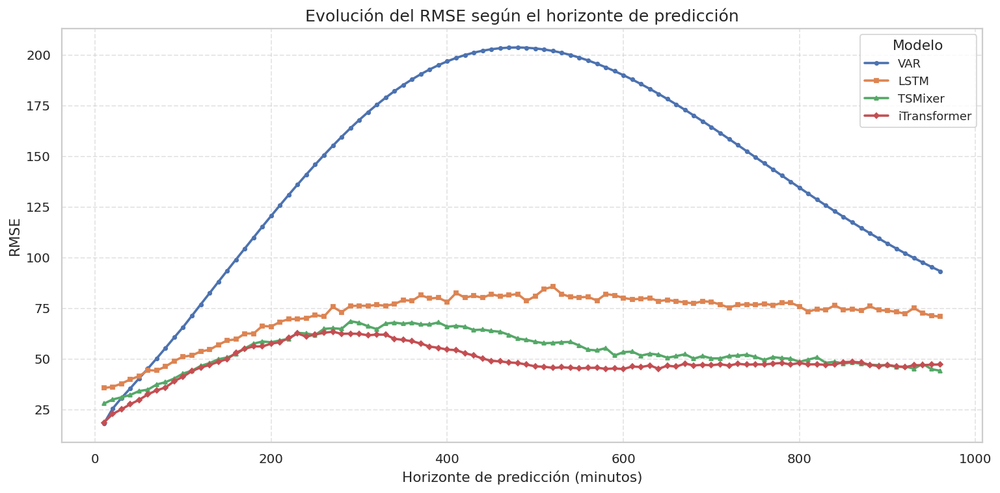

In [ ]:
# ============================================================
# ERROR POR HORIZONTE TEMPORAL
# ============================================================
#
# Esta gráfica muestra cómo evoluciona el RMSE de cada modelo
# a medida que aumenta el horizonte de predicción.
#
# En nuestro caso:
#
#   seq_len  = 96 observaciones = 16 horas de historial
#   pred_len = 96 observaciones = 16 horas de predicción
#
# Cada observación representa 10 minutos.
#
# Por lo tanto:
#
#   Horizonte 1  -> 10 minutos
#   Horizonte 2  -> 20 minutos
#   ...
#   Horizonte 96 -> 960 minutos = 16 horas
#
# Para cada horizonte se calcula el RMSE utilizando:
#
#   - Todas las ventanas de test
#   - Las 22 variables meteorológicas
#
# Esto permite comparar cómo se deteriora el desempeño de
# VAR, LSTM, TSMixer e iTransformer a medida que se predice
# más lejos en el futuro.
# ============================================================


import numpy as np
import matplotlib.pyplot as plt


# ============================================================
# 1. FUNCIÓN PARA CALCULAR EL RMSE POR HORIZONTE
# ============================================================
#
# Parámetros:
#
#   y_real:
#       Valores reales.
#       Forma esperada:
#           [n_muestras, pred_len, n_variables]
#
#   y_pred:
#       Predicciones del modelo.
#       Misma forma que y_real.
#
# Retorna:
#
#   rmse_por_horizonte:
#       Array de tamaño pred_len.
#
#       Cada posición contiene el RMSE correspondiente
#       a ese punto específico del horizonte.
#
# ============================================================

def calcular_rmse_por_horizonte(y_real, y_pred):

    rmse_por_horizonte = []

    # Número de pasos que tiene el horizonte de predicción
    pred_len = y_real.shape[1]

    # Recorrer cada instante futuro
    for h in range(pred_len):

        # ----------------------------------------------------
        # Valores reales correspondientes únicamente al
        # horizonte h
        #
        # Forma:
        # [n_muestras, n_variables]
        # ----------------------------------------------------
        real_h = y_real[:, h, :]

        # ----------------------------------------------------
        # Predicciones correspondientes únicamente al
        # horizonte h
        #
        # Forma:
        # [n_muestras, n_variables]
        # ----------------------------------------------------
        pred_h = y_pred[:, h, :]

        # ----------------------------------------------------
        # Error cuadrático
        # ----------------------------------------------------
        error_cuadratico = (real_h - pred_h) ** 2

        # ----------------------------------------------------
        # Promedio del error cuadrático sobre:
        #
        #   - todas las ventanas de test
        #   - todas las variables
        #
        # axis=None hace el promedio sobre todos los valores.
        # ----------------------------------------------------
        mse_h = np.mean(error_cuadratico)

        # ----------------------------------------------------
        # Raíz cuadrada para obtener RMSE
        # ----------------------------------------------------
        rmse_h = np.sqrt(mse_h)

        rmse_por_horizonte.append(rmse_h)

    return np.array(rmse_por_horizonte)


# ============================================================
# 2. CALCULAR RMSE POR HORIZONTE PARA CADA MODELO
# ============================================================

rmse_var = calcular_rmse_por_horizonte(
    y_test_original,
    pred_var_original
)

rmse_lstm = calcular_rmse_por_horizonte(
    y_test_original,
    pred_lstm_original
)

rmse_tsmixer = calcular_rmse_por_horizonte(
    y_test_original,
    pred_tsmixer_original
)

rmse_itransformer = calcular_rmse_por_horizonte(
    y_test_original,
    pred_itransformer_original
)


# ============================================================
# 3. CREAR EJE TEMPORAL
# ============================================================
#
# Cada paso representa 10 minutos.
#
# Por ejemplo:
#
#   1  -> 10 minutos
#   6  -> 60 minutos = 1 hora
#   12 -> 120 minutos = 2 horas
#   96 -> 960 minutos = 16 horas
#
# ============================================================

horizonte = np.arange(1, pred_len + 1)

# Convertir los pasos a minutos
horizonte_minutos = horizonte * 10


# ============================================================
# 4. CREAR LA GRÁFICA
# ============================================================

plt.figure(figsize=(12, 6))


# ------------------------------------------------------------
# VAR
# ------------------------------------------------------------

plt.plot(
    horizonte_minutos,
    rmse_var,
    marker='o',
    markersize=3,
    linewidth=2,
    label='VAR'
)


# ------------------------------------------------------------
# LSTM
# ------------------------------------------------------------

plt.plot(
    horizonte_minutos,
    rmse_lstm,
    marker='s',
    markersize=3,
    linewidth=2,
    label='LSTM'
)


# ------------------------------------------------------------
# TSMixer
# ------------------------------------------------------------

plt.plot(
    horizonte_minutos,
    rmse_tsmixer,
    marker='^',
    markersize=3,
    linewidth=2,
    label='TSMixer'
)


# ------------------------------------------------------------
# iTransformer
# ------------------------------------------------------------

plt.plot(
    horizonte_minutos,
    rmse_itransformer,
    marker='D',
    markersize=3,
    linewidth=2,
    label='iTransformer'
)


# ============================================================
# 5. CONFIGURACIÓN DE LA GRÁFICA
# ============================================================

plt.title(
    'Evolución del RMSE según el horizonte de predicción',
    fontsize=14
)

plt.xlabel(
    'Horizonte de predicción (minutos)',
    fontsize=12
)

plt.ylabel(
    'RMSE',
    fontsize=12
)


# Mostrar los cuatro modelos en la leyenda
plt.legend(
    title='Modelo',
    fontsize=10
)


# Cuadrícula para facilitar la lectura
plt.grid(
    True,
    linestyle='--',
    alpha=0.5
)


plt.tight_layout()

plt.show()

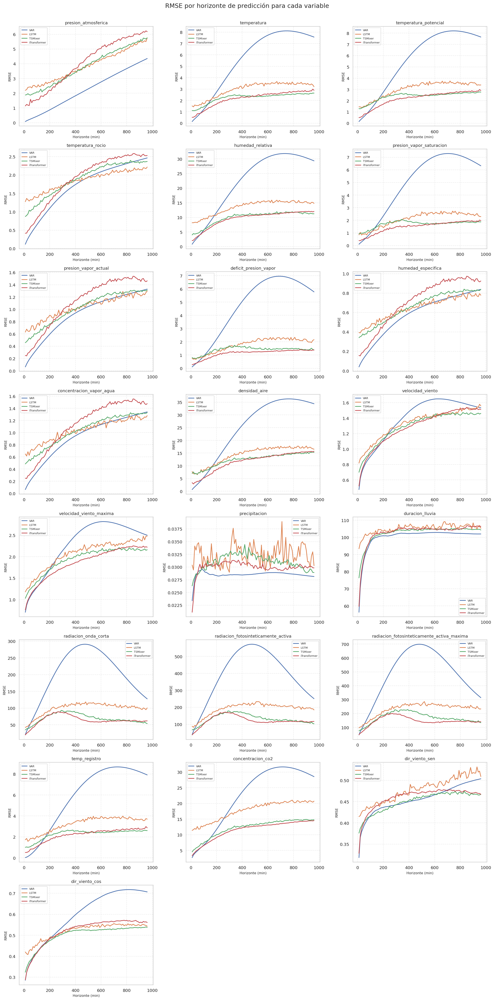

In [ ]:
# ============================================================
# RMSE POR HORIZONTE PARA CADA VARIABLE
# ============================================================
#
# Esta función genera una gráfica para una variable meteorológica
# específica.
#
# En cada gráfica se muestran cuatro líneas:
#
#   - VAR
#   - LSTM
#   - TSMixer
#   - iTransformer
#
# El eje X representa el horizonte de predicción en minutos.
# El eje Y representa el RMSE de la variable seleccionada.
#
# Posteriormente, la función se utilizará para generar una
# gráfica para cada una de las variables del modelo.
# ============================================================


import numpy as np
import matplotlib.pyplot as plt


def graficar_rmse_por_horizonte(nombre_columna):
    """
    Genera una gráfica del RMSE por horizonte de predicción
    para una variable meteorológica específica.

    Parámetros
    ----------
    nombre_columna : str
        Nombre exacto de la variable que se desea analizar.

    Ejemplo
    -------
    graficar_rmse_por_horizonte('temperatura')
    """

    # ========================================================
    # 1. OBTENER EL ÍNDICE DE LA VARIABLE
    # ========================================================
    #
    # 'variables' corresponde a la lista de variables utilizada
    # para entrenar los modelos.
    #
    # El índice nos permite seleccionar una sola variable de
    # las 22 existentes.
    # ========================================================

    indice_variable = variables.index(nombre_columna)


    # ========================================================
    # 2. SELECCIONAR LA VARIABLE
    # ========================================================
    #
    # Las predicciones tienen la forma:
    #
    # [n_muestras, pred_len, n_variables]
    #
    # Al seleccionar una variable obtenemos:
    #
    # [n_muestras, pred_len]
    #
    # Es decir:
    #
    #     filas    -> diferentes ventanas de test
    #     columnas -> diferentes horizontes de predicción
    # ========================================================

    y_real = y_test_original[:, :, indice_variable]

    predicciones = {
        'VAR': pred_var_original[:, :, indice_variable],
        'LSTM': pred_lstm_original[:, :, indice_variable],
        'TSMixer': pred_tsmixer_original[:, :, indice_variable],
        'iTransformer': pred_itransformer_original[:, :, indice_variable]
    }


    # ========================================================
    # 3. CALCULAR EL RMSE PARA CADA HORIZONTE
    # ========================================================
    #
    # Para cada instante futuro calculamos el RMSE utilizando
    # todas las ventanas de test.
    #
    # Ejemplo:
    #
    # Horizonte 1  -> error a 10 minutos
    # Horizonte 2  -> error a 20 minutos
    # ...
    # Horizonte 96 -> error a 16 horas
    # ========================================================

    rmse_modelos = {}

    for nombre_modelo, prediccion in predicciones.items():

        rmse = []

        for h in range(pred_len):

            # Valores reales para este horizonte
            real_h = y_real[:, h]

            # Predicciones del modelo para este horizonte
            pred_h = prediccion[:, h]

            # RMSE
            error = np.sqrt(
                np.mean((real_h - pred_h) ** 2)
            )

            rmse.append(error)

        rmse_modelos[nombre_modelo] = np.array(rmse)


    # ========================================================
    # 4. CREAR EL EJE DEL HORIZONTE
    # ========================================================
    #
    # Cada observación representa 10 minutos.
    #
    # Por lo tanto:
    #
    # 1  -> 10 minutos
    # 6  -> 60 minutos
    # 12 -> 120 minutos
    # 96 -> 960 minutos
    #
    # ========================================================

    horizonte_minutos = np.arange(1, pred_len + 1) * 10


    # ========================================================
    # 5. CREAR LA FIGURA
    # ========================================================

    plt.figure(figsize=(10, 5))


    # ========================================================
    # 6. GRAFICAR CADA MODELO
    # ========================================================

    plt.plot(
        horizonte_minutos,
        rmse_modelos['VAR'],
        linewidth=2,
        label='VAR'
    )

    plt.plot(
        horizonte_minutos,
        rmse_modelos['LSTM'],
        linewidth=2,
        label='LSTM'
    )

    plt.plot(
        horizonte_minutos,
        rmse_modelos['TSMixer'],
        linewidth=2,
        label='TSMixer'
    )

    plt.plot(
        horizonte_minutos,
        rmse_modelos['iTransformer'],
        linewidth=2,
        label='iTransformer'
    )


    # ========================================================
    # 7. CONFIGURAR LA GRÁFICA
    # ========================================================

    plt.title(
        f'RMSE por horizonte - {nombre_columna}',
        fontsize=13
    )

    plt.xlabel(
        'Horizonte de predicción (minutos)',
        fontsize=11
    )

    plt.ylabel(
        'RMSE',
        fontsize=11
    )

    plt.legend()

    plt.grid(
        True,
        linestyle='--',
        alpha=0.5
    )

    plt.tight_layout()

    plt.show()

# ============================================================
# GENERAR TODAS LAS GRÁFICAS
# ============================================================
#
# Se genera una gráfica independiente para cada variable.
#
# Las gráficas se organizan en 3 columnas:
#
#   ┌────────────┬────────────┬────────────┐
#   │ Variable 1 │ Variable 2 │ Variable 3 │
#   ├────────────┼────────────┼────────────┤
#   │ Variable 4 │ Variable 5 │ Variable 6 │
#   ├────────────┼────────────┼────────────┤
#   │     ...    │     ...    │     ...    │
#   └────────────┴────────────┴────────────┘
#
# ============================================================


def graficar_rmse_todas_variables():

    # --------------------------------------------------------
    # Número de variables
    # --------------------------------------------------------

    n_variables = len(variables)

    # --------------------------------------------------------
    # Número de columnas
    # --------------------------------------------------------

    n_columnas = 3

    # --------------------------------------------------------
    # Calcular automáticamente cuántas filas necesitamos
    #
    # Ejemplo:
    #
    # 22 variables / 3 columnas = 8 filas aproximadamente
    # --------------------------------------------------------

    n_filas = int(np.ceil(n_variables / n_columnas))


    # ========================================================
    # CREAR FIGURA Y SUBGRÁFICAS
    # ========================================================

    fig, axes = plt.subplots(
        n_filas,
        n_columnas,
        figsize=(18, 4.5 * n_filas)
    )


    # Convertir los ejes en un arreglo de una dimensión
    axes = np.array(axes).reshape(-1)


    # ========================================================
    # RECORRER TODAS LAS VARIABLES
    # ========================================================

    for i, nombre_columna in enumerate(variables):

        # ----------------------------------------------------
        # Índice de la variable
        # ----------------------------------------------------

        indice_variable = variables.index(nombre_columna)


        # ----------------------------------------------------
        # Valores reales
        # ----------------------------------------------------

        y_real = y_test_original[
            :,
            :,
            indice_variable
        ]


        # ----------------------------------------------------
        # Predicciones de cada modelo
        # ----------------------------------------------------

        predicciones = {
            'VAR': pred_var_original[:, :, indice_variable],
            'LSTM': pred_lstm_original[:, :, indice_variable],
            'TSMixer': pred_tsmixer_original[:, :, indice_variable],
            'iTransformer': pred_itransformer_original[:, :, indice_variable]
        }


        # ----------------------------------------------------
        # Eje correspondiente a esta variable
        # ----------------------------------------------------

        ax = axes[i]


        # ====================================================
        # CALCULAR Y GRAFICAR RMSE DE CADA MODELO
        # ====================================================

        for nombre_modelo, prediccion in predicciones.items():

            rmse = []

            # Recorrer los 96 horizontes
            for h in range(pred_len):

                real_h = y_real[:, h]

                pred_h = prediccion[:, h]

                # RMSE
                error = np.sqrt(
                    np.mean((real_h - pred_h) ** 2)
                )

                rmse.append(error)


            # ------------------------------------------------
            # Eje temporal
            # ------------------------------------------------

            horizonte_minutos = (
                np.arange(1, pred_len + 1) * 10
            )


            # ------------------------------------------------
            # Dibujar línea del modelo
            # ------------------------------------------------

            ax.plot(
                horizonte_minutos,
                rmse,
                linewidth=1.8,
                label=nombre_modelo
            )


        # ====================================================
        # CONFIGURACIÓN DE LA SUBGRÁFICA
        # ====================================================

        ax.set_title(
            nombre_columna,
            fontsize=11
        )

        ax.set_xlabel(
            'Horizonte (min)',
            fontsize=9
        )

        ax.set_ylabel(
            'RMSE',
            fontsize=9
        )

        ax.grid(
            True,
            linestyle='--',
            alpha=0.4
        )

        ax.legend(
            fontsize=7
        )


    # ========================================================
    # ELIMINAR EJES SOBRANTES
    # ========================================================
    #
    # Como tenemos 22 variables y 3 columnas:
    #
    # 8 filas × 3 columnas = 24 espacios
    #
    # Por lo tanto quedan 2 espacios vacíos.
    #
    # Los eliminamos para que la figura quede limpia.
    # ========================================================

    for i in range(n_variables, len(axes)):
        fig.delaxes(axes[i])


    # ========================================================
    # TÍTULO GENERAL
    # ========================================================

    fig.suptitle(
        'RMSE por horizonte de predicción para cada variable',
        fontsize=16,
        y=1.002
    )


    # ========================================================
    # AJUSTAR ESPACIADO
    # ========================================================

    plt.tight_layout()

    plt.show()

graficar_rmse_todas_variables()

Taylor Diagram

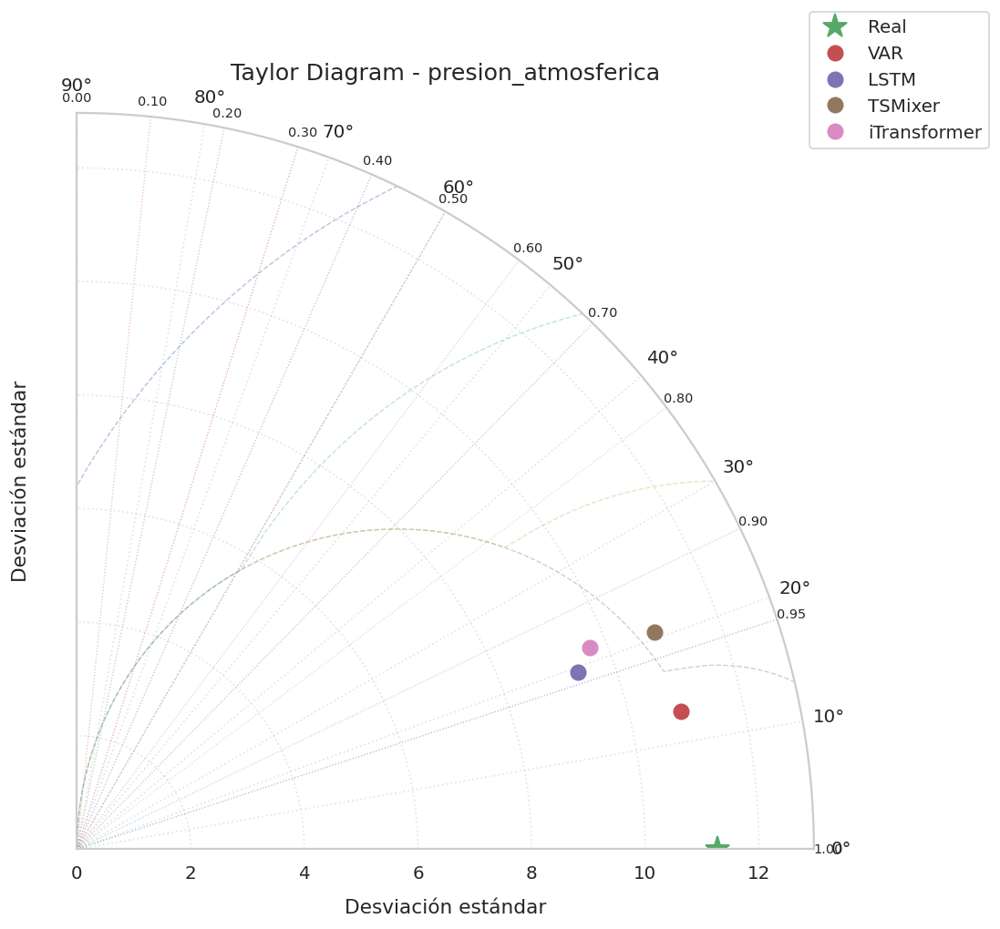


Variable: presion_atmosferica
Desviación estándar real: 11.2770

Resultados:
VAR: STD=10.9062, CORR=0.9748, RMSEc=2.5172
LSTM: STD=9.3435, CORR=0.9429, RMSEc=3.9701
TSMixer: STD=10.8634, CORR=0.9357, RMSEc=3.9899
iTransformer: STD=9.6949, CORR=0.9304, RMSEc=4.2107


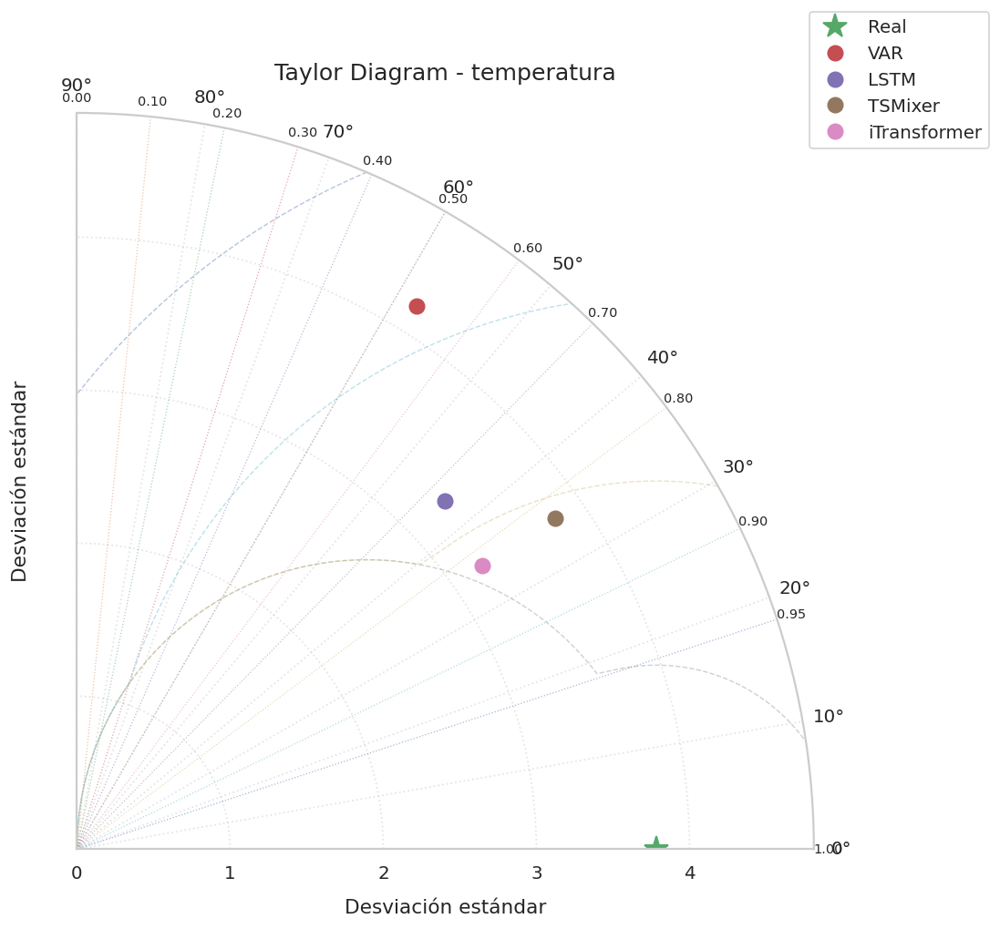


Variable: temperatura
Desviación estándar real: 3.7835

Resultados:
VAR: STD=4.1846, CORR=0.5297, RMSEc=3.8800
LSTM: STD=3.3099, CORR=0.7266, RMSEc=2.6592
TSMixer: STD=3.8008, CORR=0.8220, RMSEc=2.2624
iTransformer: STD=3.2325, CORR=0.8196, RMSEc=2.1717


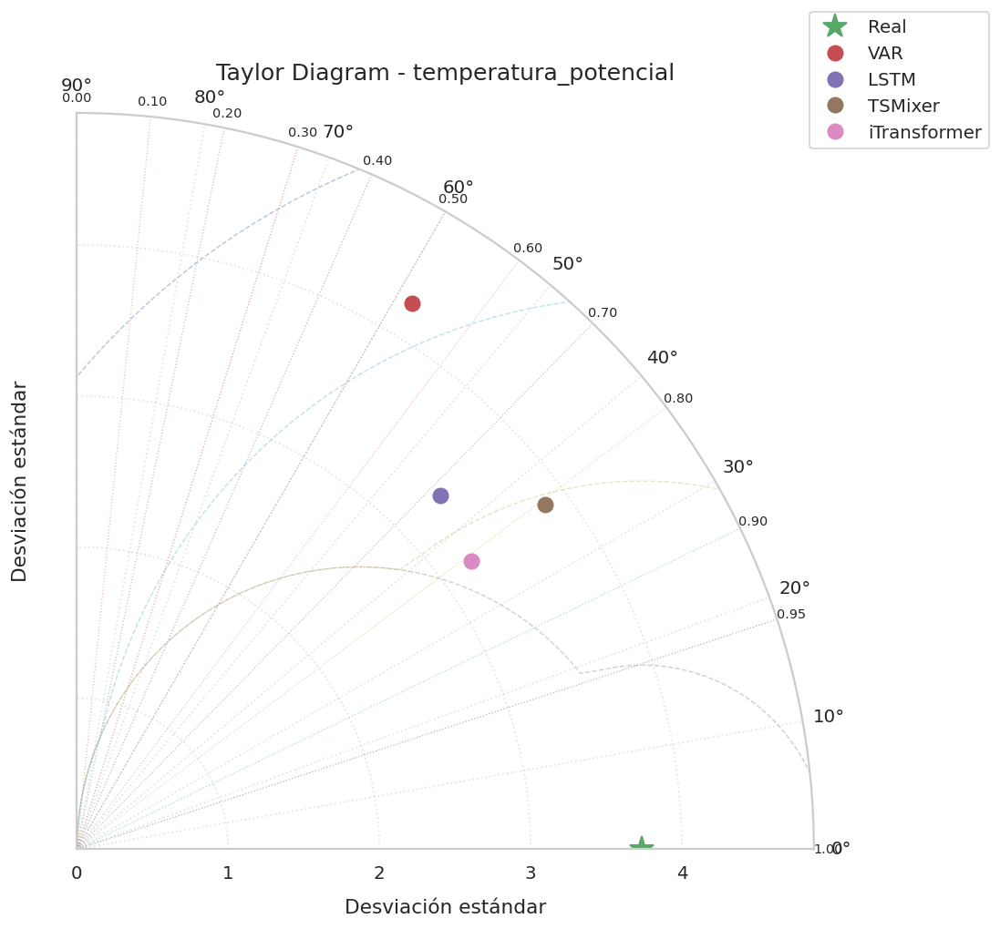


Variable: temperatura_potencial
Desviación estándar real: 3.7369

Resultados:
VAR: STD=4.2376, CORR=0.5228, RMSEc=3.9196
LSTM: STD=3.3578, CORR=0.7162, RMSEc=2.6957
TSMixer: STD=3.8485, CORR=0.8052, RMSEc=2.3700
iTransformer: STD=3.2285, CORR=0.8071, RMSEc=2.2165


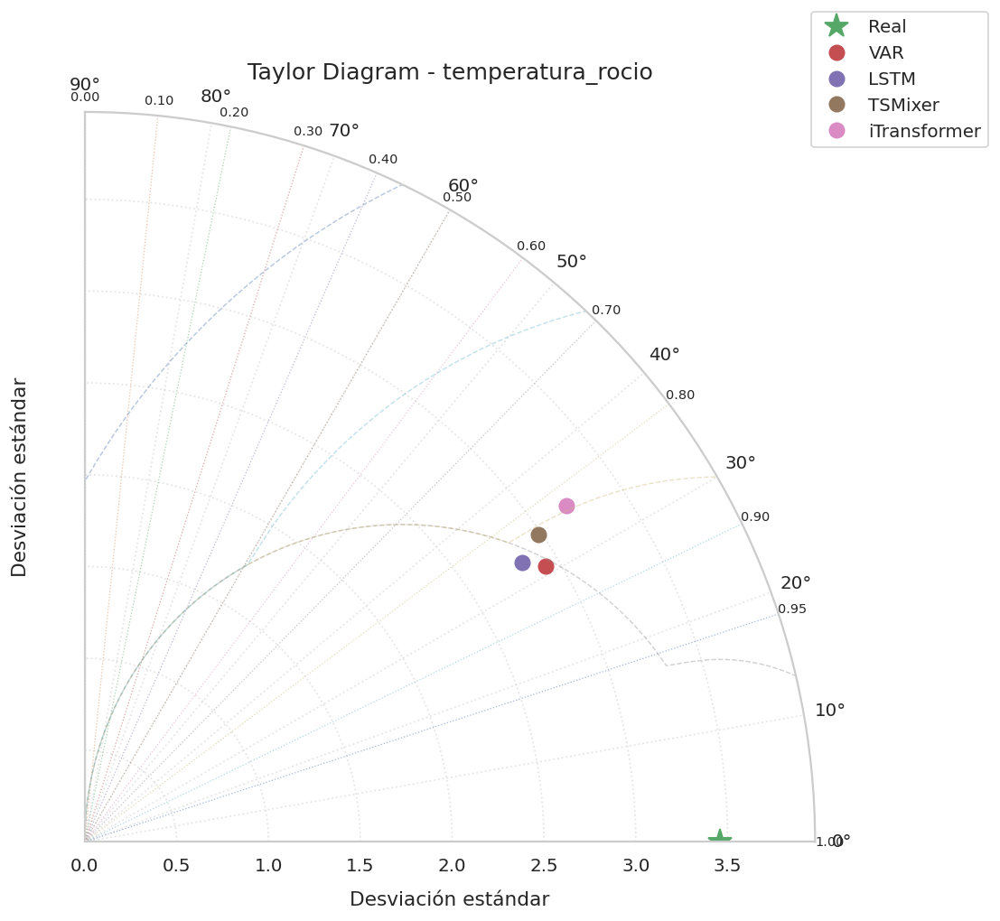


Variable: temperatura_rocio
Desviación estándar real: 3.4574

Resultados:
VAR: STD=2.9259, CORR=0.8582, RMSEc=1.7754
LSTM: STD=2.8274, CORR=0.8425, RMSEc=1.8647
TSMixer: STD=2.9841, CORR=0.8276, RMSEc=1.9443
iTransformer: STD=3.1977, CORR=0.8201, RMSEc=2.0111


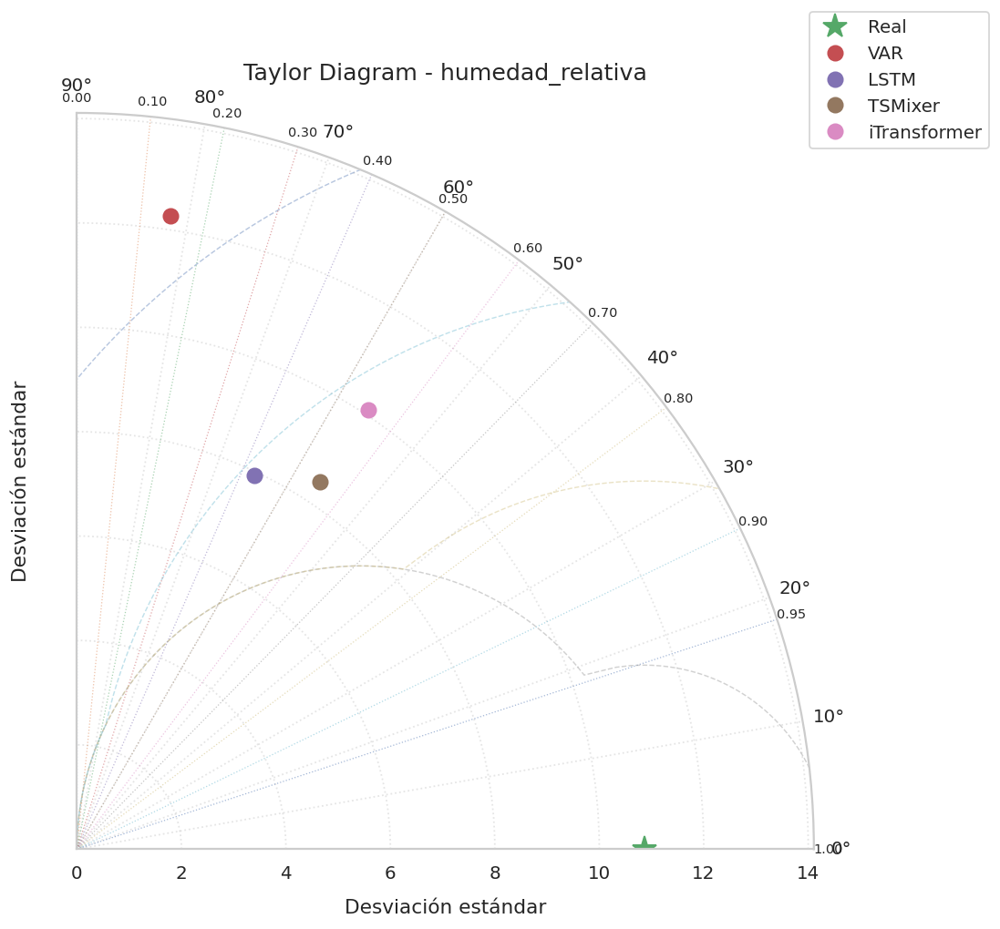


Variable: humedad_relativa
Desviación estándar real: 10.8572

Resultados:
VAR: STD=12.2681, CORR=0.1456, RMSEc=15.1522
LSTM: STD=7.9267, CORR=0.4291, RMSEc=10.3368
TSMixer: STD=8.4450, CORR=0.5517, RMSEc=9.3821
iTransformer: STD=10.1025, CORR=0.5527, RMSEc=9.9347


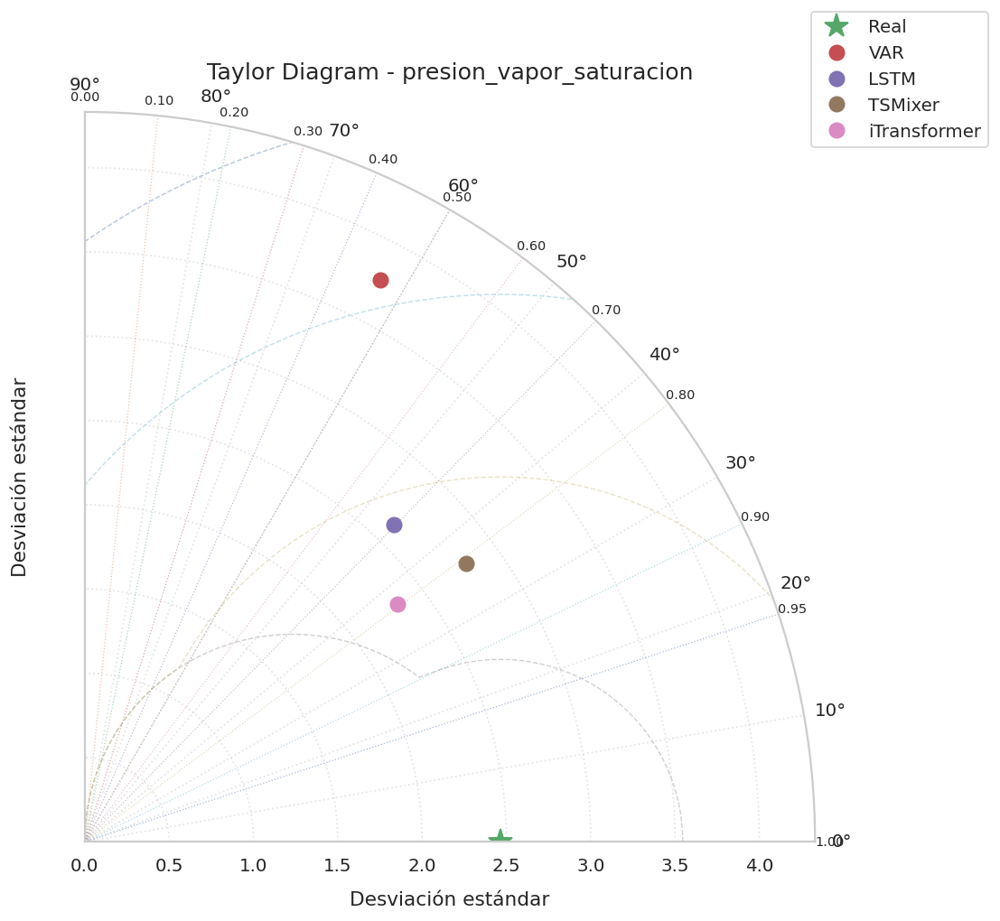


Variable: presion_vapor_saturacion
Desviación estándar real: 2.4631

Resultados:
VAR: STD=3.7654, CORR=0.4652, RMSEc=3.4082
LSTM: STD=2.6266, CORR=0.6981, RMSEc=1.9830
TSMixer: STD=2.7975, CORR=0.8075, RMSEc=1.6627
iTransformer: STD=2.3303, CORR=0.7960, RMSEc=1.5361


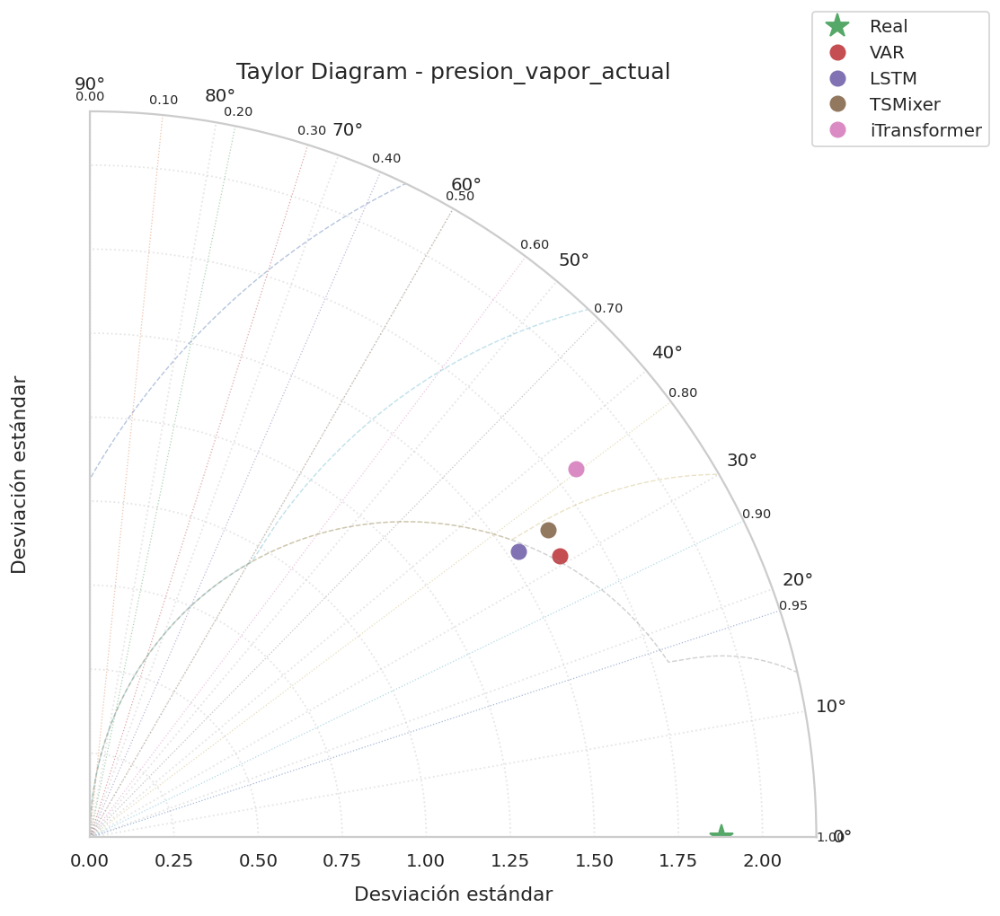


Variable: presion_vapor_actual
Desviación estándar real: 1.8783

Resultados:
VAR: STD=1.6286, CORR=0.8579, RMSEc=0.9653
LSTM: STD=1.5328, CORR=0.8313, RMSEc=1.0445
TSMixer: STD=1.6412, CORR=0.8303, RMSEc=1.0501
iTransformer: STD=1.8155, CORR=0.7967, RMSEc=1.1793


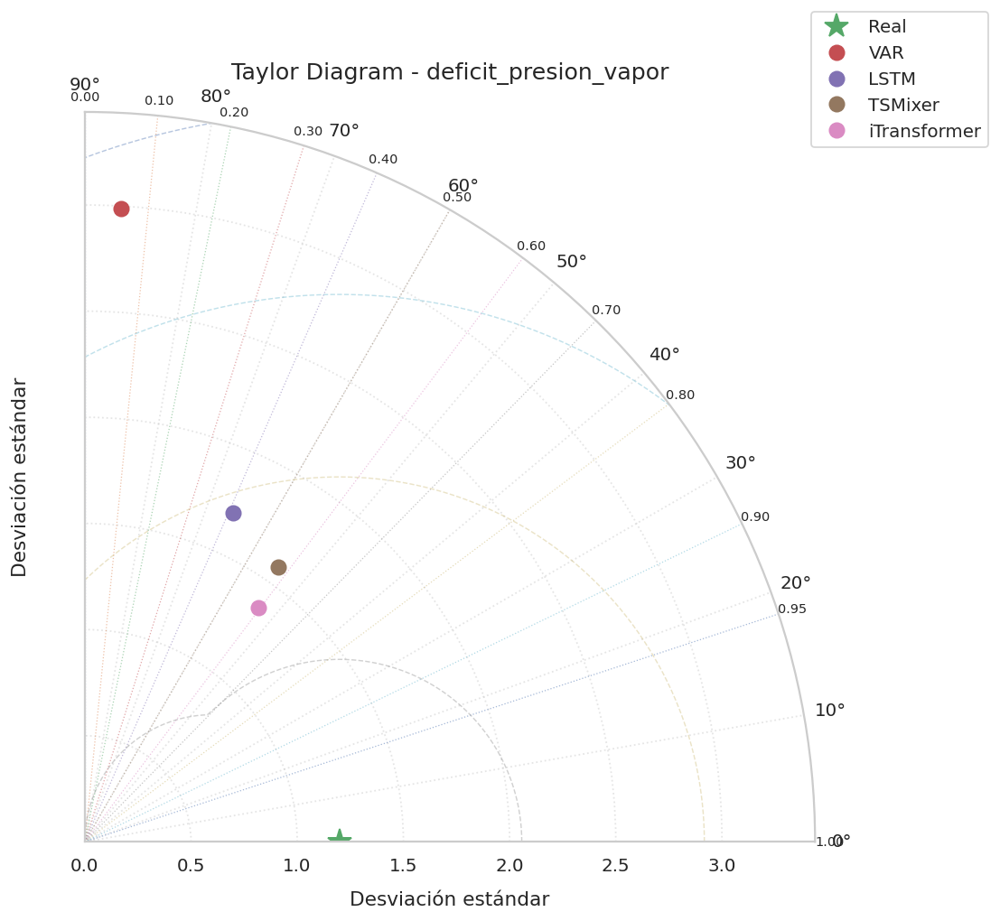


Variable: deficit_presion_vapor
Desviación estándar real: 1.1979

Resultados:
VAR: STD=2.9898, CORR=0.0567, RMSEc=3.1572
LSTM: STD=1.6992, CORR=0.4102, RMSEc=1.6286
TSMixer: STD=1.5811, CORR=0.5753, RMSEc=1.3250
iTransformer: STD=1.3724, CORR=0.5944, RMSEc=1.1679


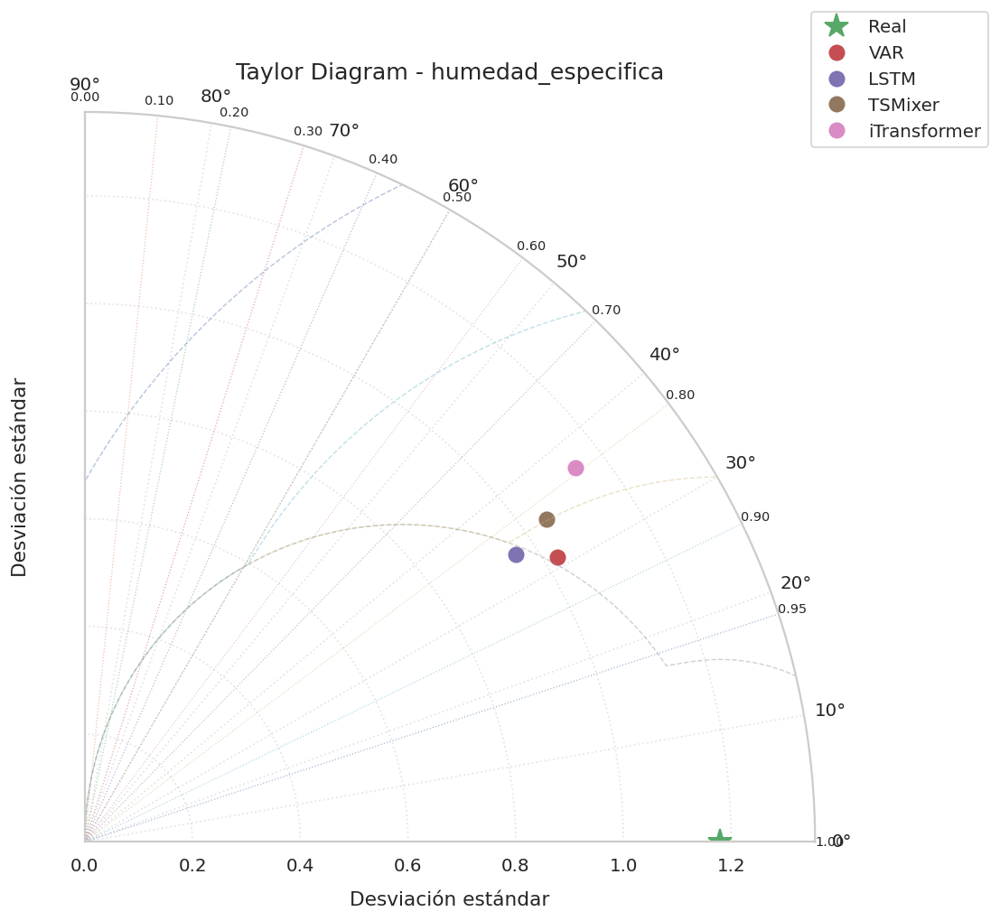


Variable: humedad_especifica
Desviación estándar real: 1.1789

Resultados:
VAR: STD=1.0241, CORR=0.8563, RMSEc=0.6091
LSTM: STD=0.9614, CORR=0.8317, RMSEc=0.6549
TSMixer: STD=1.0464, CORR=0.8200, RMSEc=0.6795
iTransformer: STD=1.1457, CORR=0.7949, RMSEc=0.7451


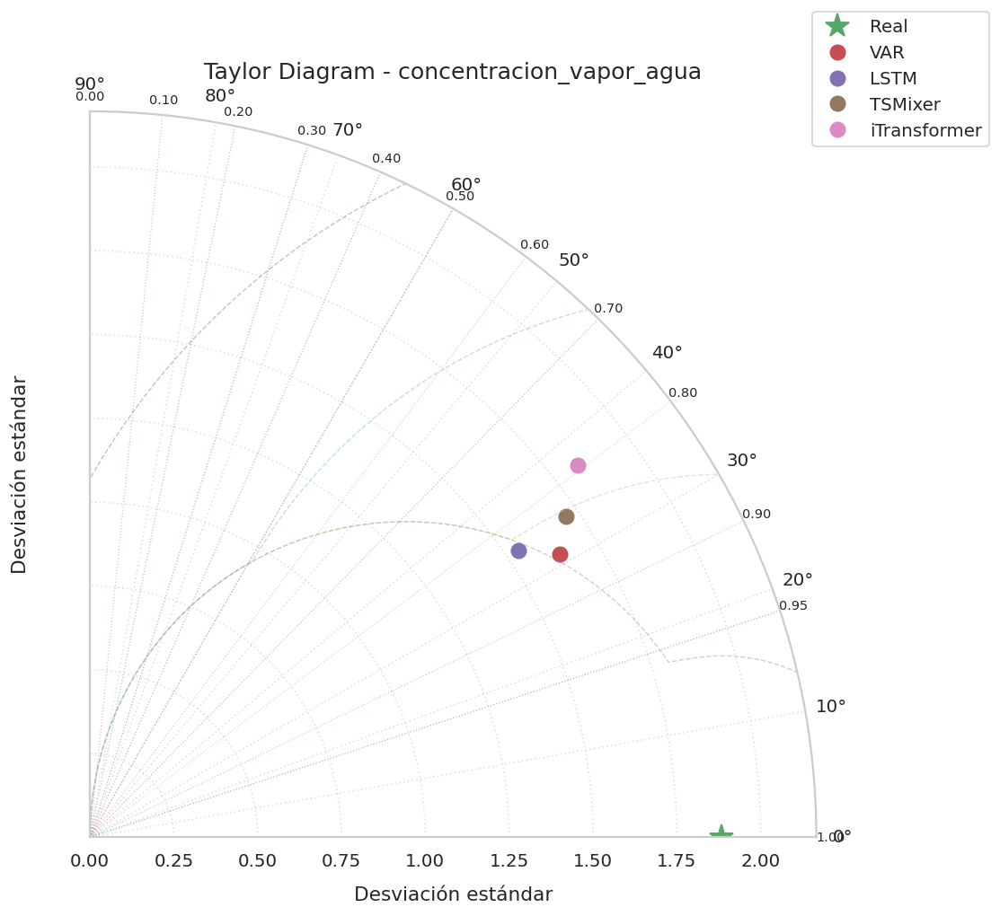


Variable: concentracion_vapor_agua
Desviación estándar real: 1.8836

Resultados:
VAR: STD=1.6354, CORR=0.8563, RMSEc=0.9730
LSTM: STD=1.5372, CORR=0.8303, RMSEc=1.0500
TSMixer: STD=1.7123, CORR=0.8290, RMSEc=1.0642
iTransformer: STD=1.8296, CORR=0.7952, RMSEc=1.1893


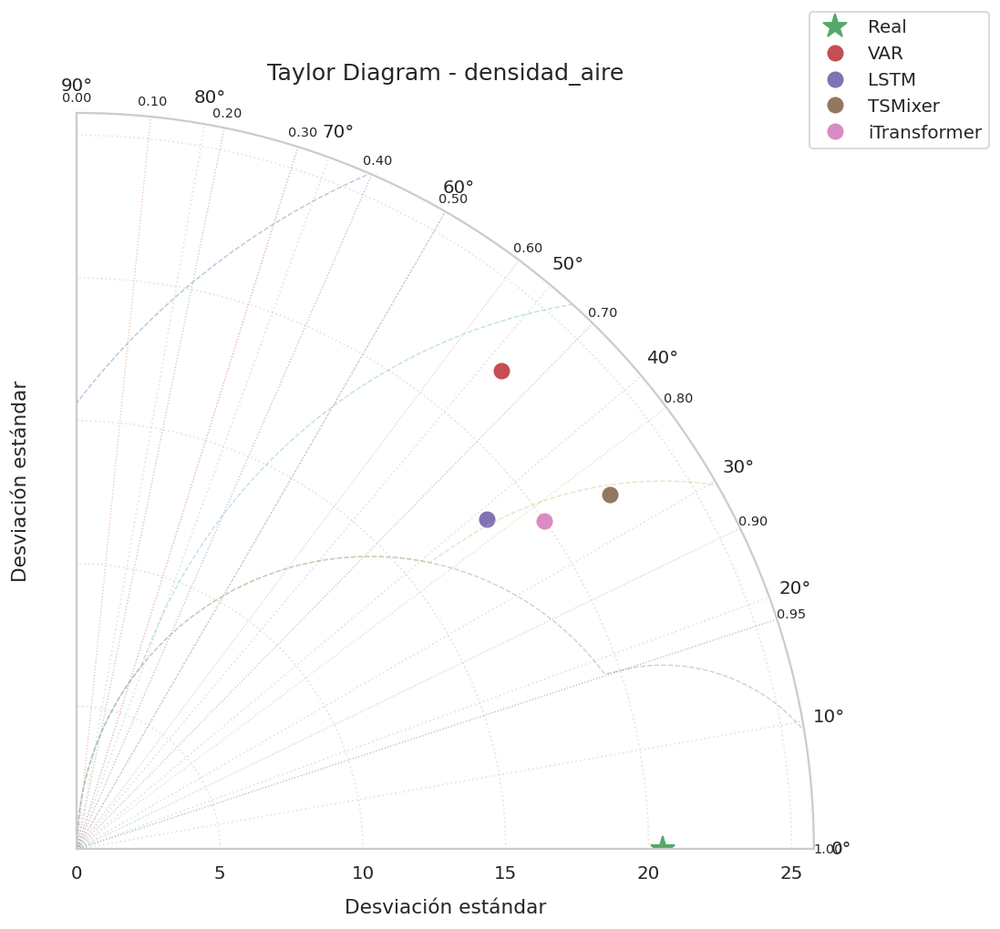


Variable: densidad_aire
Desviación estándar real: 20.5009

Resultados:
VAR: STD=22.3865, CORR=0.6632, RMSEc=17.6837
LSTM: STD=18.4130, CORR=0.7787, RMSEc=13.0936
TSMixer: STD=22.4178, CORR=0.8323, RMSEc=12.5627
iTransformer: STD=19.9852, CORR=0.8187, RMSEc=12.2004


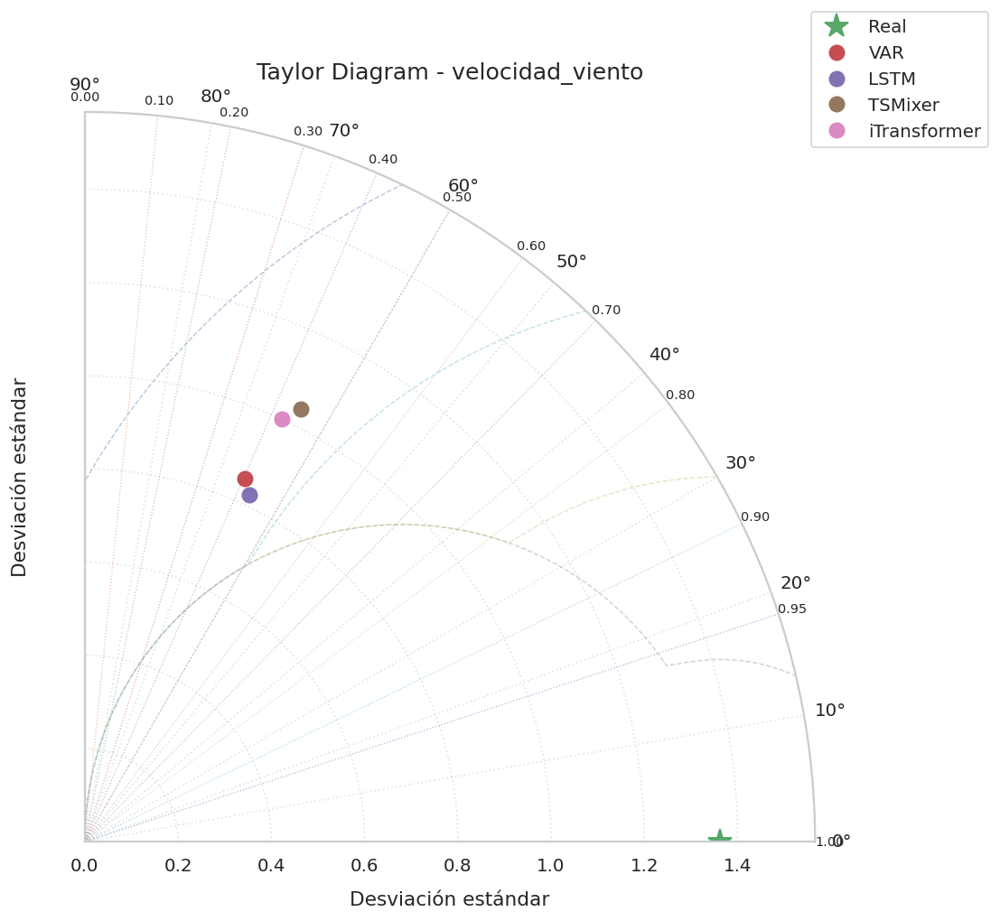


Variable: velocidad_viento
Desviación estándar real: 1.3617

Resultados:
VAR: STD=0.8526, CORR=0.4033, RMSEc=1.2824
LSTM: STD=0.8248, CORR=0.4283, RMSEc=1.2540
TSMixer: STD=1.0375, CORR=0.4470, RMSEc=1.2914
iTransformer: STD=1.0014, CORR=0.4212, RMSEc=1.3070


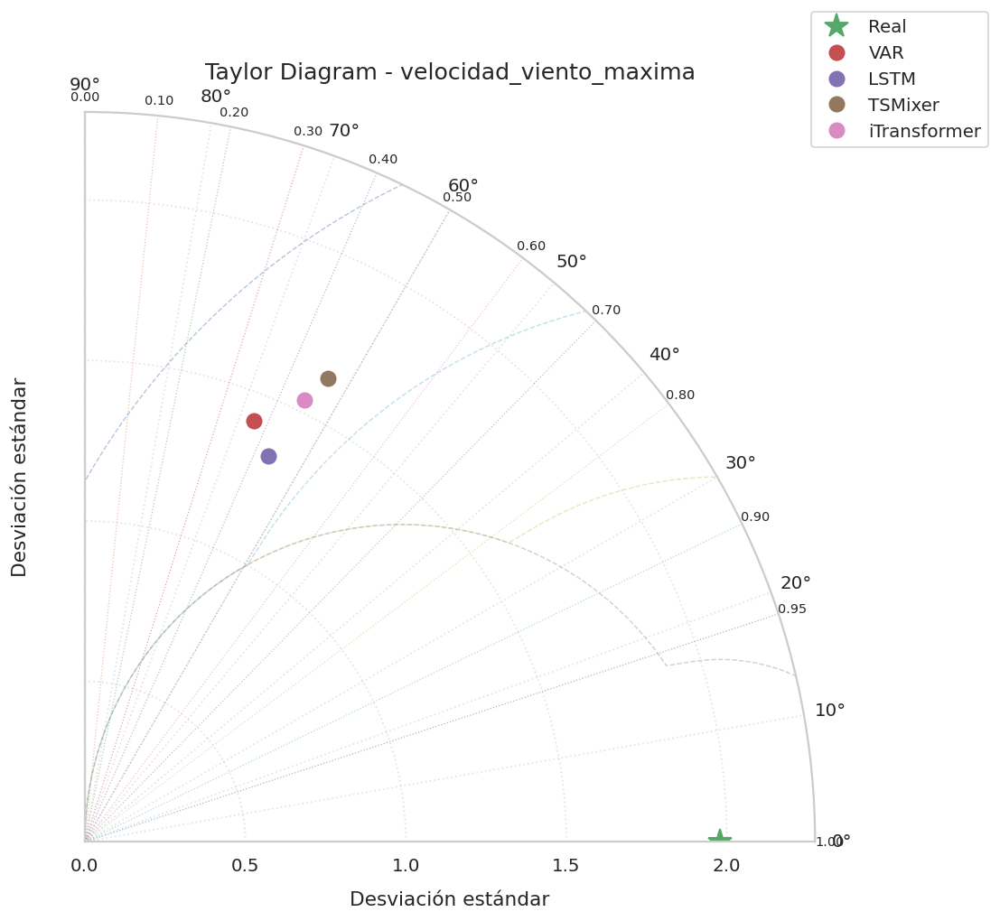


Variable: velocidad_viento_maxima
Desviación estándar real: 1.9778

Resultados:
VAR: STD=1.4130, CORR=0.3727, RMSEc=1.9558
LSTM: STD=1.3320, CORR=0.4296, RMSEc=1.8500
TSMixer: STD=1.6302, CORR=0.4640, RMSEc=1.8914
iTransformer: STD=1.5377, CORR=0.4449, RMSEc=1.8896


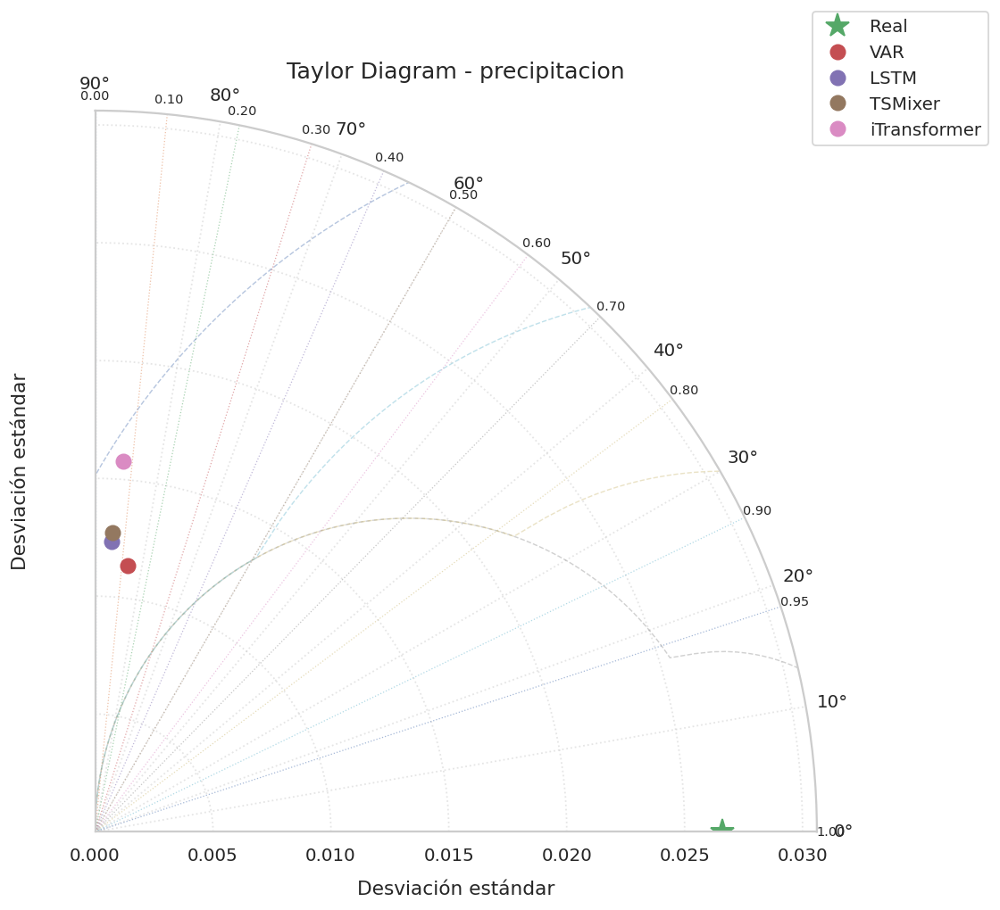


Variable: precipitacion
Desviación estándar real: 0.0266

Resultados:
VAR: STD=0.0114, CORR=0.1208, RMSEc=0.0276
LSTM: STD=0.0124, CORR=0.0560, RMSEc=0.0287
TSMixer: STD=0.0127, CORR=0.0577, RMSEc=0.0288
iTransformer: STD=0.0158, CORR=0.0744, RMSEc=0.0299


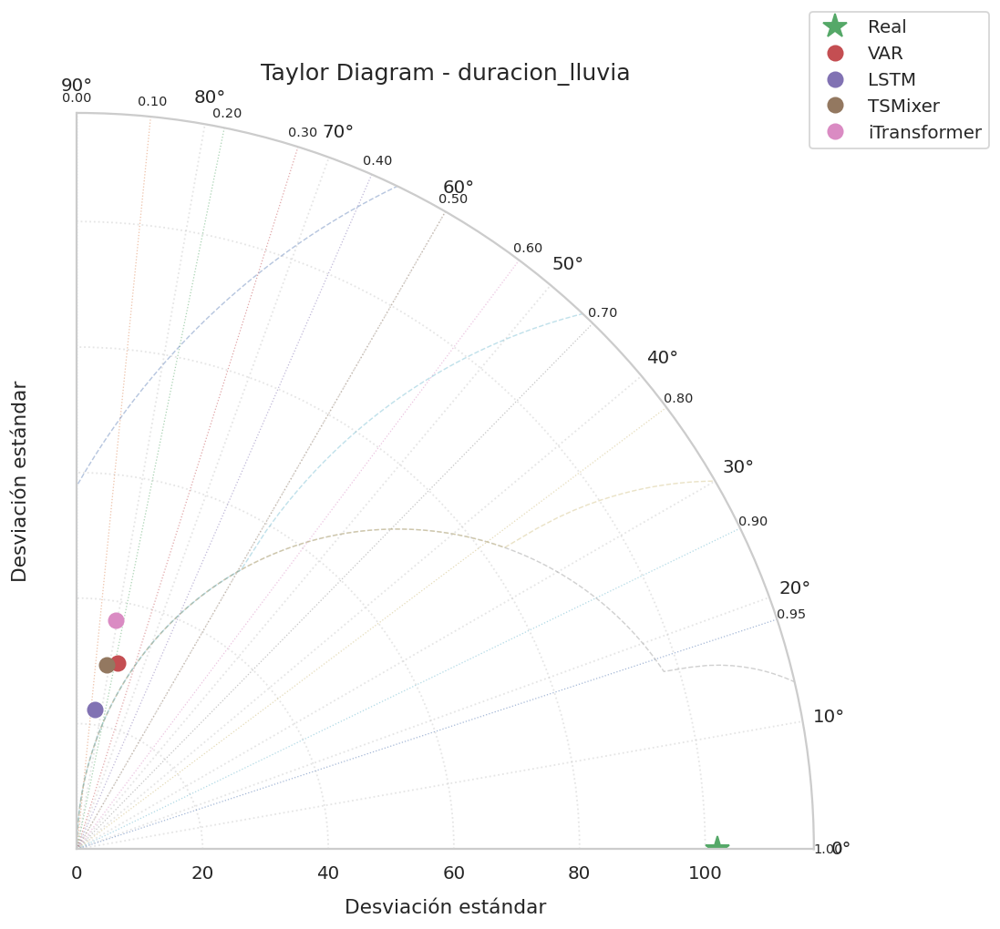


Variable: duracion_lluvia
Desviación estándar real: 102.0020

Resultados:
VAR: STD=30.4004, CORR=0.2126, RMSEc=100.0504
LSTM: STD=22.3869, CORR=0.1299, RMSEc=101.5502
TSMixer: STD=29.8020, CORR=0.1593, RMSEc=101.6088
iTransformer: STD=37.0165, CORR=0.1674, RMSEc=102.5194


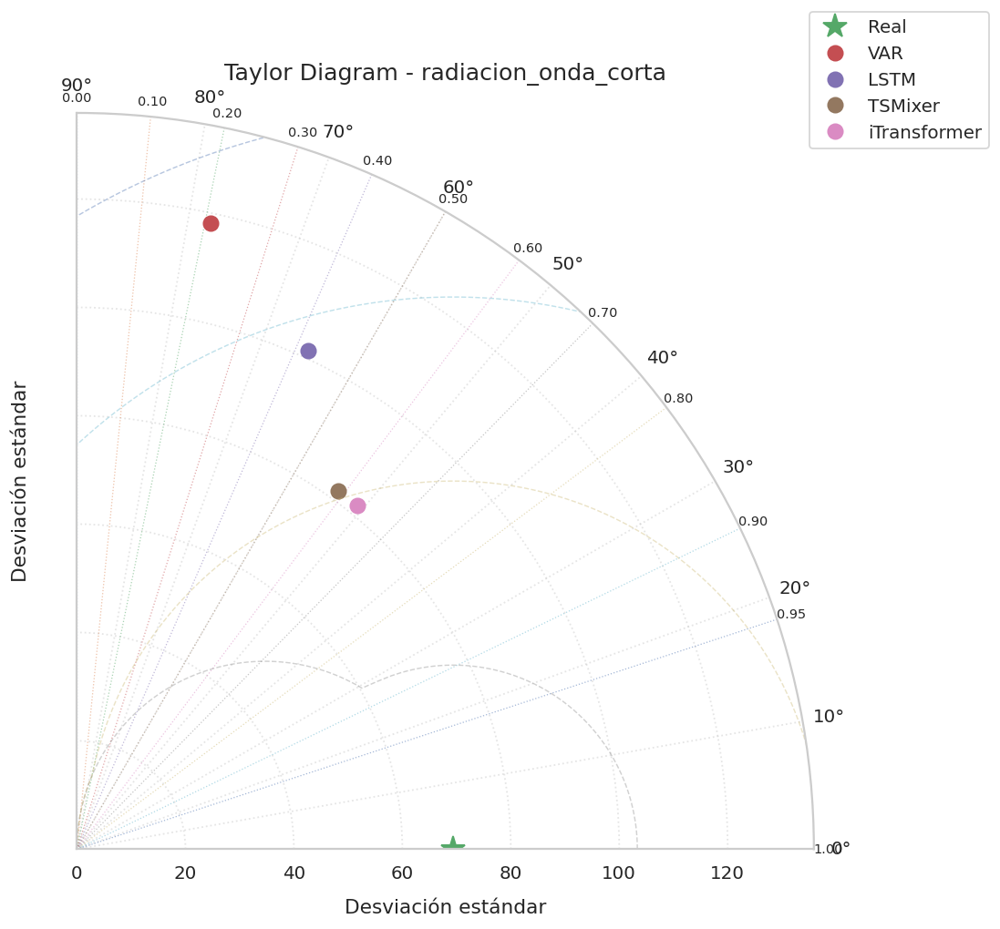


Variable: radiacion_onda_corta
Desviación estándar real: 69.3671

Resultados:
VAR: STD=118.1712, CORR=0.2089, RMSEc=123.9042
LSTM: STD=101.3340, CORR=0.4202, RMSEc=95.7791
TSMixer: STD=81.7701, CORR=0.5896, RMSEc=69.3521
iTransformer: STD=81.7259, CORR=0.6317, RMSEc=65.7955


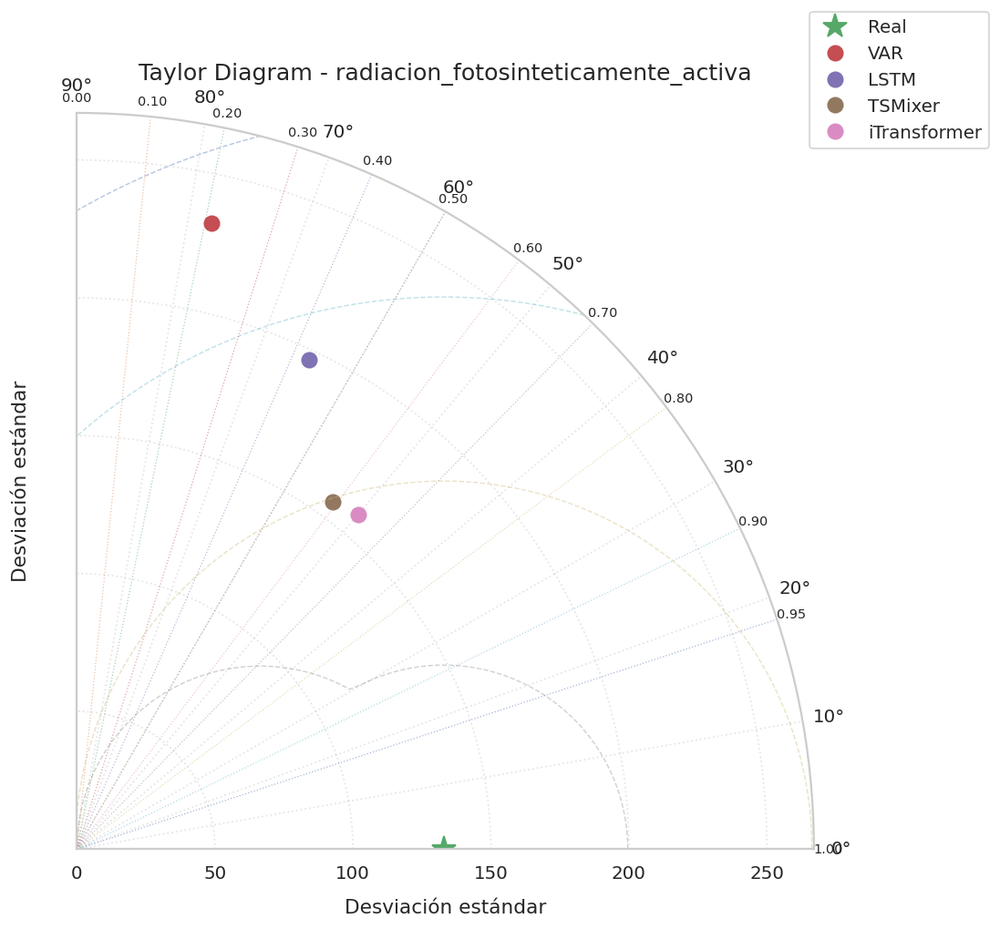


Variable: radiacion_fotosinteticamente_activa
Desviación estándar real: 132.8379

Resultados:
VAR: STD=232.2160, CORR=0.2099, RMSEc=242.1187
LSTM: STD=196.2356, CORR=0.4280, RMSEc=183.9623
TSMixer: STD=156.3070, CORR=0.5930, RMSEc=132.1040
iTransformer: STD=158.3823, CORR=0.6429, RMSEc=125.2118


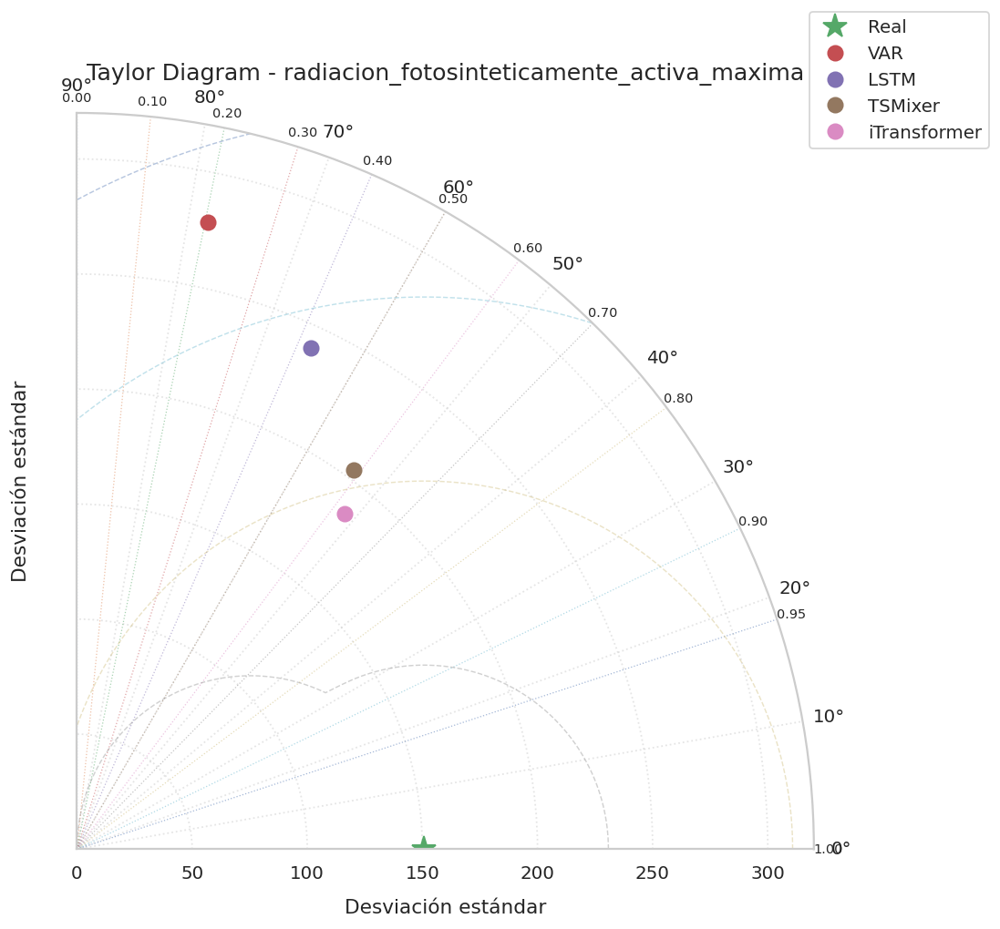


Variable: radiacion_fotosinteticamente_activa_maxima
Desviación estándar real: 150.7829

Resultados:
VAR: STD=278.2844, CORR=0.2041, RMSEc=288.1846
LSTM: STD=240.5760, CORR=0.4226, RMSEc=223.4976
TSMixer: STD=203.8304, CORR=0.5892, RMSEc=167.5324
iTransformer: STD=186.3505, CORR=0.6234, RMSEc=149.7621


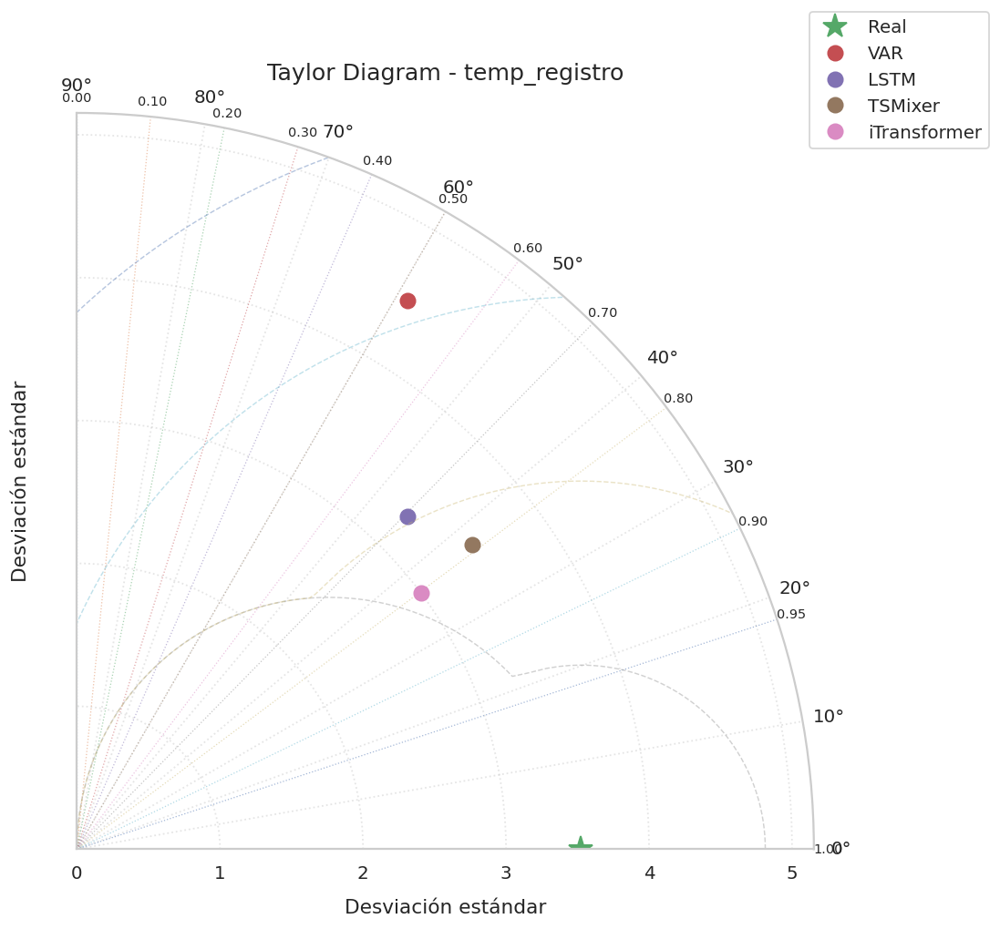


Variable: temp_registro
Desviación estándar real: 3.5250

Resultados:
VAR: STD=4.4807, CORR=0.5156, RMSEc=4.0267
LSTM: STD=3.2797, CORR=0.7048, RMSEc=2.6240
TSMixer: STD=3.4920, CORR=0.7915, RMSEc=2.2656
iTransformer: STD=2.9990, CORR=0.8020, RMSEc=2.1127


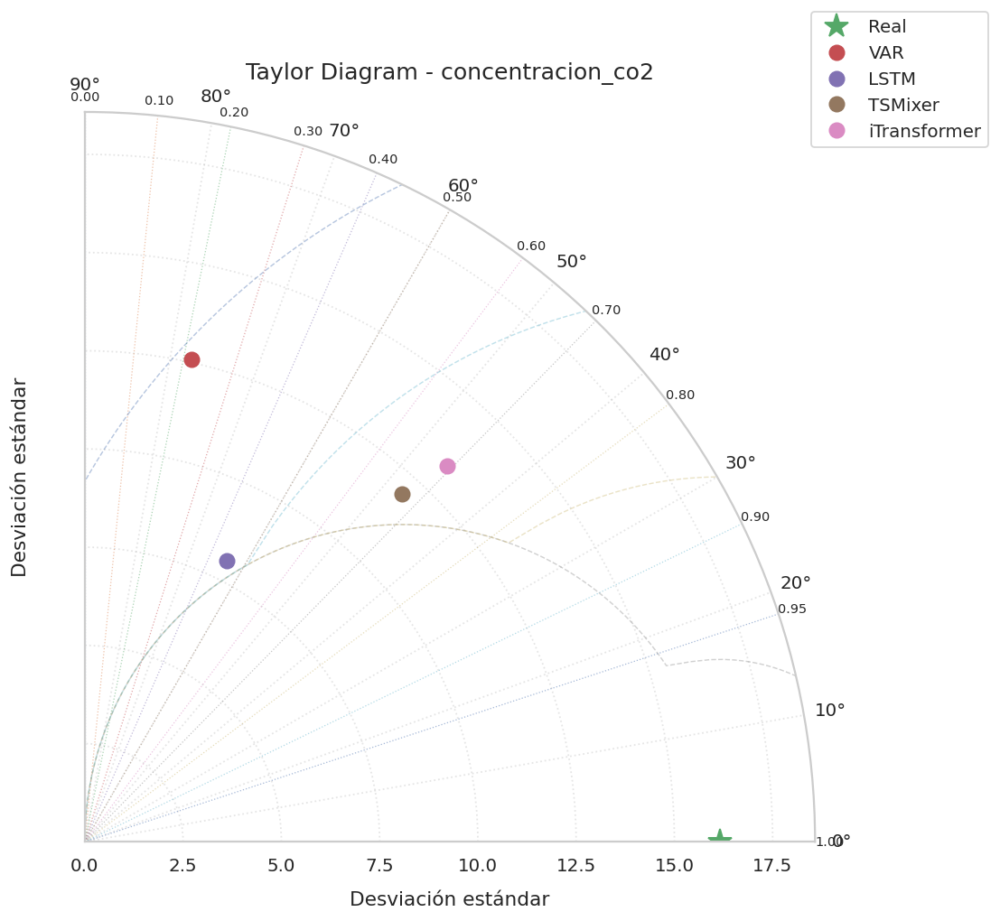


Variable: concentracion_co2
Desviación estándar real: 16.1554

Resultados:
VAR: STD=12.5835, CORR=0.2165, RMSEc=18.2016
LSTM: STD=8.0095, CORR=0.4505, RMSEc=14.4418
TSMixer: STD=11.9909, CORR=0.6736, RMSEc=11.9923
iTransformer: STD=13.2862, CORR=0.6931, RMSEc=11.8321


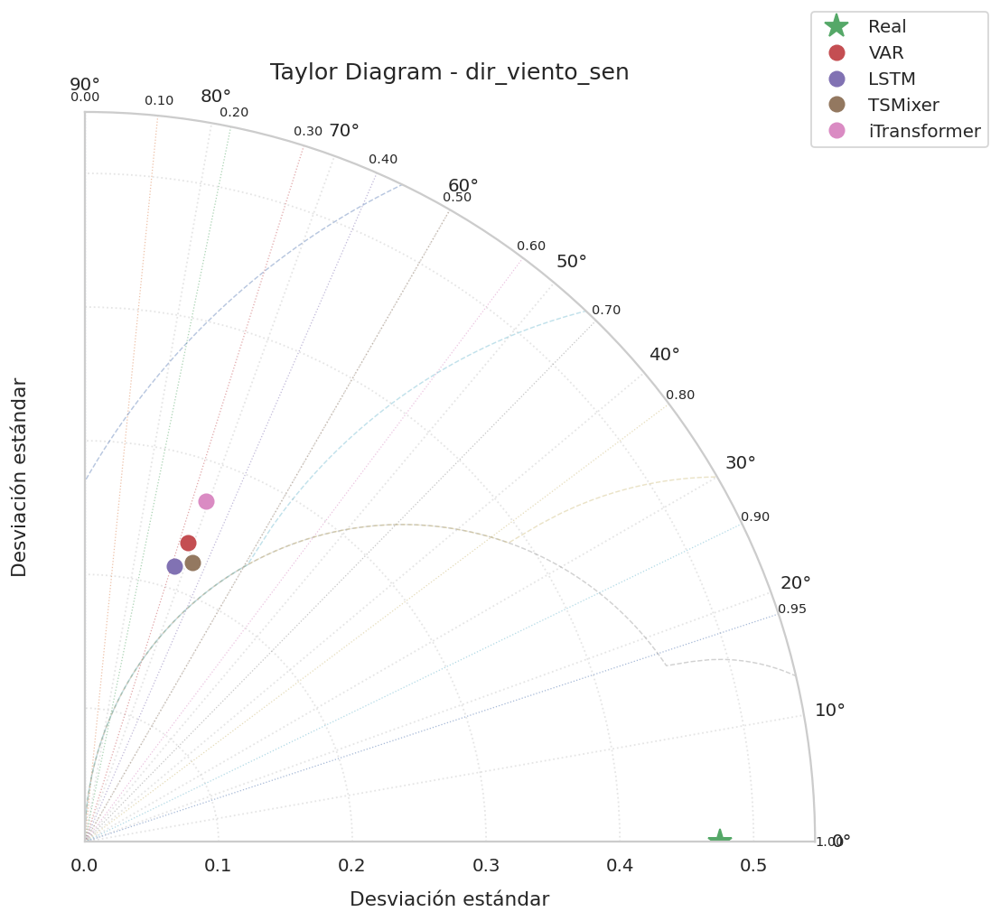


Variable: dir_viento_sen
Desviación estándar real: 0.4747

Resultados:
VAR: STD=0.2363, CORR=0.3250, RMSEc=0.4564
LSTM: STD=0.2168, CORR=0.3074, RMSEc=0.4573
TSMixer: STD=0.2240, CORR=0.3583, RMSEc=0.4465
iTransformer: STD=0.2704, CORR=0.3361, RMSEc=0.4606


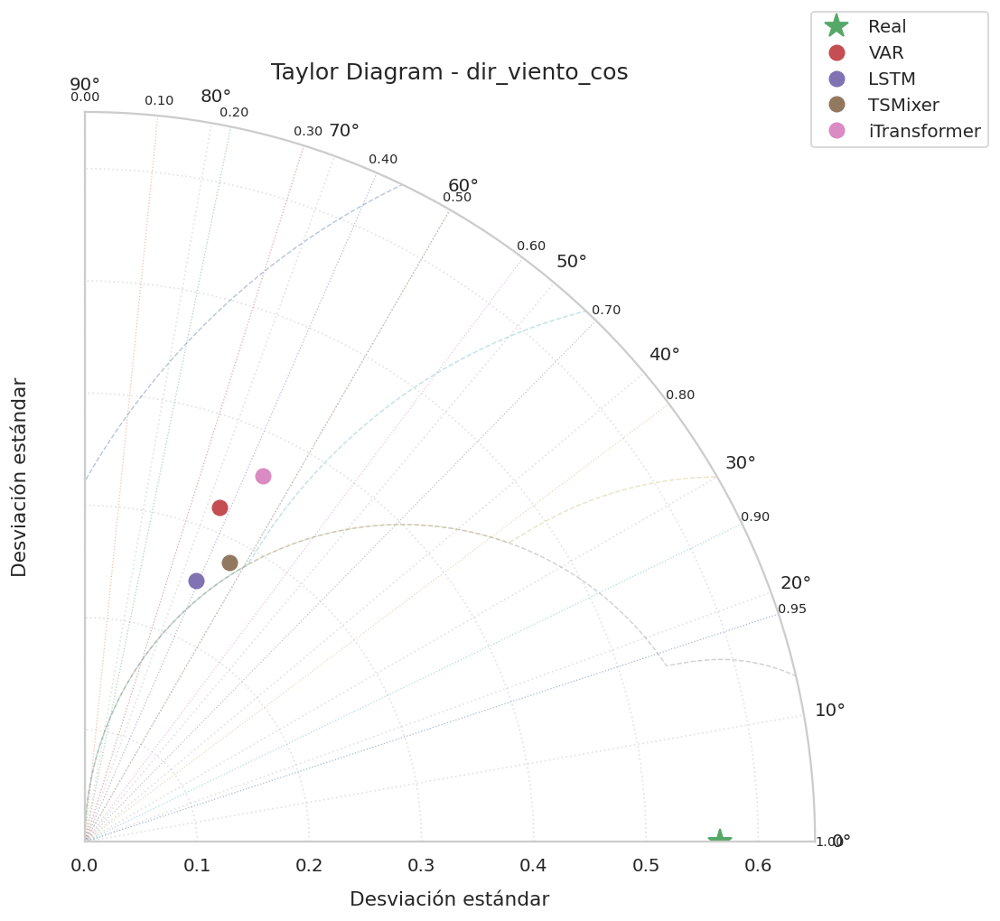


Variable: dir_viento_cos
Desviación estándar real: 0.5658

Resultados:
VAR: STD=0.3216, CORR=0.3729, RMSEc=0.5365
LSTM: STD=0.2528, CORR=0.3923, RMSEc=0.5213
TSMixer: STD=0.2805, CORR=0.4596, RMSEc=0.5029
iTransformer: STD=0.3630, CORR=0.4379, RMSEc=0.5215


In [ ]:
import numpy as np
import matplotlib.pyplot as plt


def taylor_diagram_variable(nombre_columna):
    """
    Genera un Taylor Diagram para una variable específica,
    comparando VAR, LSTM, TSMixer e iTransformer.

    Parámetros
    ----------
    nombre_columna : str
        Nombre exacto de la variable a analizar.
    """

    # ---------------------------------------------------------
    # Buscar índice de la variable
    # ---------------------------------------------------------
    if nombre_columna not in variables:
        raise ValueError(
            f"La variable '{nombre_columna}' no se encuentra en 'variables'."
        )

    indice_variable = variables.index(nombre_columna)

    # ---------------------------------------------------------
    # Extraer valores reales y predicciones
    # ---------------------------------------------------------
    y_real = y_test_original[:, :, indice_variable]

    predicciones = {
        "VAR": pred_var_original[:, :, indice_variable],
        "LSTM": pred_lstm_original[:, :, indice_variable],
        "TSMixer": pred_tsmixer_original[:, :, indice_variable],
        "iTransformer": pred_itransformer_original[:, :, indice_variable]
    }

    # ---------------------------------------------------------
    # Aplanar muestras y horizonte
    # ---------------------------------------------------------
    y_real_flat = y_real.reshape(-1)

    # Desviación estándar de referencia
    std_real = np.std(y_real_flat, ddof=1)

    resultados = {}

    # ---------------------------------------------------------
    # Calcular estadísticas
    # ---------------------------------------------------------
    for nombre_modelo, pred in predicciones.items():

        pred_flat = pred.reshape(-1)

        # Desviación estándar
        std_pred = np.std(pred_flat, ddof=1)

        # Correlación
        correlacion = np.corrcoef(
            y_real_flat,
            pred_flat
        )[0, 1]

        # RMSE centrado
        real_centrado = y_real_flat - np.mean(y_real_flat)
        pred_centrado = pred_flat - np.mean(pred_flat)

        rmse_centrado = np.sqrt(
            np.mean((real_centrado - pred_centrado) ** 2)
        )

        resultados[nombre_modelo] = {
            "std": std_pred,
            "correlacion": correlacion,
            "rmse_centrado": rmse_centrado
        }

    # ---------------------------------------------------------
    # Crear figura
    # ---------------------------------------------------------
    fig = plt.figure(figsize=(9, 8))
    ax = fig.add_subplot(111, polar=True)

    # ---------------------------------------------------------
    # Limitar correlación entre 0 y 1
    # ---------------------------------------------------------
    ax.set_thetamin(0)
    ax.set_thetamax(90)

    # ---------------------------------------------------------
    # Eje radial
    # ---------------------------------------------------------
    max_std = max(
        [std_real] +
        [r["std"] for r in resultados.values()]
    )

    max_std *= 1.15

    ax.set_ylim(0, max_std)

    # ---------------------------------------------------------
    # Líneas de correlación
    # ---------------------------------------------------------
    correlaciones = np.array([
        0.0,
        0.1,
        0.2,
        0.3,
        0.4,
        0.5,
        0.6,
        0.7,
        0.8,
        0.9,
        0.95,
        1.0
    ])

    angulos = np.arccos(correlaciones)

    for angulo, corr in zip(angulos, correlaciones):

        ax.plot(
            [angulo, angulo],
            [0, max_std],
            linestyle=":",
            linewidth=0.7,
            alpha=0.5
        )

        ax.text(
            angulo,
            max_std * 1.02,
            f"{corr:.2f}",
            ha="center",
            va="center",
            fontsize=8
        )

    # ---------------------------------------------------------
    # Punto de referencia: valores reales
    # ---------------------------------------------------------
    ax.plot(
        0,
        std_real,
        marker="*",
        markersize=15,
        linestyle="None",
        label="Real"
    )

    # ---------------------------------------------------------
    # Puntos de los modelos
    # ---------------------------------------------------------
    for nombre_modelo, resultado in resultados.items():

        # Convertir correlación en ángulo
        corr = np.clip(resultado["correlacion"], -1, 1)

        angulo = np.arccos(corr)

        ax.plot(
            angulo,
            resultado["std"],
            marker="o",
            markersize=9,
            linestyle="None",
            label=nombre_modelo
        )

    # ---------------------------------------------------------
    # Círculos de RMSE centrado
    # ---------------------------------------------------------
    theta = np.linspace(0, np.pi / 2, 300)

    for rmse in np.linspace(
        max_std * 0.25,
        max_std,
        4
    ):

        # Curva de RMSE centrado:
        #
        # RMSEc² = std_real² + std_pred²
        #           - 2*std_real*std_pred*corr
        #
        # Resolviendo para std_pred:
        a = 1
        b = -2 * std_real * np.cos(theta)
        c = std_real**2 - rmse**2

        r = (-b + np.sqrt(
            np.maximum(b**2 - 4*a*c, 0)
        )) / (2*a)

        ax.plot(
            theta,
            r,
            linestyle="--",
            linewidth=0.8,
            alpha=0.4
        )

    # ---------------------------------------------------------
    # Configuración visual
    # ---------------------------------------------------------
    ax.set_title(
        f"Taylor Diagram - {nombre_columna}",
        fontsize=14,
        pad=20
    )

    ax.set_xlabel(
        "Desviación estándar",
        labelpad=25
    )

    ax.set_ylabel(
        "Desviación estándar",
        labelpad=25
    )

    ax.legend(
        loc="upper right",
        bbox_to_anchor=(1.25, 1.15)
    )

    ax.grid(True, linestyle=":", alpha=0.5)

    plt.tight_layout()
    plt.show()

    # ---------------------------------------------------------
    # Mostrar estadísticas
    # ---------------------------------------------------------
    print(f"\nVariable: {nombre_columna}")
    print(f"Desviación estándar real: {std_real:.4f}")
    print("\nResultados:")

    for modelo, resultado in resultados.items():

        print(
            f"{modelo}: "
            f"STD={resultado['std']:.4f}, "
            f"CORR={resultado['correlacion']:.4f}, "
            f"RMSEc={resultado['rmse_centrado']:.4f}"
        )

    return resultados

def taylor_diagram_todas_variables():

    for nombre_columna in variables:

        taylor_diagram_variable(nombre_columna)

taylor_diagram_todas_variables()

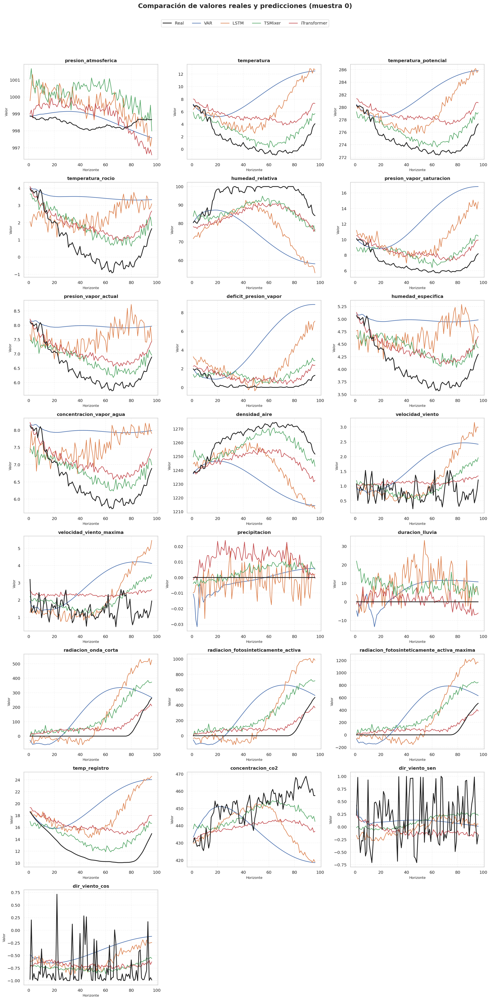

In [ ]:
import numpy as np
import matplotlib.pyplot as plt


# ============================================================
# COLORES DE LOS MODELOS
# ============================================================

COLORES_MODELOS = {
    "VAR": "#4C72B0",
    "LSTM": "#DD8452",
    "TSMixer": "#55A868",
    "iTransformer": "#C44E52"
}

COLOR_REAL = "#222222"


# ============================================================
# FUNCIÓN: SERIE REAL VS PREDICCIONES
# ============================================================

def graficar_serie_tiempo_variable(nombre_columna, muestra=0):
    """
    Grafica los valores reales y las predicciones de los cuatro
    modelos para una variable meteorológica.

    Parámetros
    ----------
    nombre_columna : str
        Nombre de la variable que se desea graficar.

    muestra : int
        Índice de la ventana de test que se desea visualizar.
        Por defecto se utiliza la primera ventana (0).
    """

    # --------------------------------------------------------
    # Verificar que la variable exista
    # --------------------------------------------------------

    if nombre_columna not in variables:
        print(f"La variable '{nombre_columna}' no se encuentra en 'variables'.")
        return

    indice_variable = variables.index(nombre_columna)

    # --------------------------------------------------------
    # Verificar que la muestra exista
    # --------------------------------------------------------

    numero_muestras = y_test_original.shape[0]

    if muestra < 0 or muestra >= numero_muestras:
        print(
            f"La muestra debe estar entre 0 y {numero_muestras - 1}."
        )
        return

    # --------------------------------------------------------
    # Obtener valores reales
    # --------------------------------------------------------

    valores_reales = y_test_original[
        muestra, :, indice_variable
    ]

    # --------------------------------------------------------
    # Obtener predicciones
    # --------------------------------------------------------

    predicciones = {
        "VAR": pred_var_original[muestra, :, indice_variable],
        "LSTM": pred_lstm_original[muestra, :, indice_variable],
        "TSMixer": pred_tsmixer_original[muestra, :, indice_variable],
        "iTransformer": pred_itransformer_original[
            muestra, :, indice_variable
        ]
    }

    # --------------------------------------------------------
    # Horizonte de predicción
    # --------------------------------------------------------

    horizonte = np.arange(1, len(valores_reales) + 1)

    # --------------------------------------------------------
    # Crear gráfica
    # --------------------------------------------------------

    plt.figure(figsize=(14, 5))

    # Valores reales
    plt.plot(
        horizonte,
        valores_reales,
        label="Real",
        color=COLOR_REAL,
        linewidth=2.5,
        zorder=5
    )

    # Predicciones
    for nombre_modelo, valores_predichos in predicciones.items():

        plt.plot(
            horizonte,
            valores_predichos,
            label=nombre_modelo,
            color=COLORES_MODELOS[nombre_modelo],
            linewidth=1.8
        )

    # --------------------------------------------------------
    # Formato
    # --------------------------------------------------------

    plt.title(
        f"{nombre_columna} - Valores reales vs predicciones",
        fontsize=14,
        fontweight="bold"
    )

    plt.xlabel(
        "Horizonte de predicción (pasos de 10 minutos)",
        fontsize=11
    )

    plt.ylabel(
        nombre_columna,
        fontsize=11
    )

    plt.grid(
        True,
        linestyle="--",
        alpha=0.25
    )

    plt.legend(
        loc="best",
        frameon=True
    )

    plt.tight_layout()

    plt.show()

# ============================================================
# FUNCIÓN: TODAS LAS VARIABLES
# ============================================================

def graficar_series_todas_variables(muestra=0, n_columnas=3):

    n_variables = len(variables)

    # Número de filas necesarias
    n_filas = int(np.ceil(n_variables / n_columnas))

    # Crear figura
    fig, axes = plt.subplots(
        n_filas,
        n_columnas,
        figsize=(18, 4.5 * n_filas)
    )

    # Convertir axes en arreglo plano
    axes = np.array(axes).reshape(-1)

    # ========================================================
    # RECORRER TODAS LAS VARIABLES
    # ========================================================

    for i, nombre_columna in enumerate(variables):

        ax = axes[i]

        indice_variable = variables.index(nombre_columna)

        # Valores reales
        valores_reales = y_test_original[
            muestra, :, indice_variable
        ]

        # Predicciones
        predicciones = {
            "VAR": pred_var_original[
                muestra, :, indice_variable
            ],

            "LSTM": pred_lstm_original[
                muestra, :, indice_variable
            ],

            "TSMixer": pred_tsmixer_original[
                muestra, :, indice_variable
            ],

            "iTransformer": pred_itransformer_original[
                muestra, :, indice_variable
            ]
        }

        # Horizonte
        horizonte = np.arange(
            1,
            len(valores_reales) + 1
        )

        # ----------------------------------------------------
        # REAL
        # ----------------------------------------------------

        ax.plot(
            horizonte,
            valores_reales,
            label="Real",
            color=COLOR_REAL,
            linewidth=2.0,
            zorder=5
        )

        # ----------------------------------------------------
        # MODELOS
        # ----------------------------------------------------

        for nombre_modelo, valores_predichos in predicciones.items():

            ax.plot(
                horizonte,
                valores_predichos,
                label=nombre_modelo,
                color=COLORES_MODELOS[nombre_modelo],
                linewidth=1.5
            )

        # ----------------------------------------------------
        # FORMATO DE CADA GRÁFICA
        # ----------------------------------------------------

        ax.set_title(
            nombre_columna,
            fontsize=12,
            fontweight="bold"
        )

        ax.set_xlabel(
            "Horizonte",
            fontsize=9
        )

        ax.set_ylabel(
            "Valor",
            fontsize=9
        )

        ax.grid(
            True,
            linestyle="--",
            alpha=0.25
        )

    # ========================================================
    # ELIMINAR GRÁFICAS SOBRANTES
    # ========================================================

    for i in range(n_variables, len(axes)):
        fig.delaxes(axes[i])

    # ========================================================
    # LEYENDA GENERAL
    # ========================================================

    handles, labels = axes[0].get_legend_handles_labels()

    fig.legend(
        handles,
        labels,
        loc="upper center",
        ncol=5,
        bbox_to_anchor=(0.5, 0.995),
        fontsize=11
    )

    # ========================================================
    # TÍTULO GENERAL
    # ========================================================

    fig.suptitle(
        f"Comparación de valores reales y predicciones "
        f"(muestra {muestra})",
        fontsize=17,
        fontweight="bold",
        y=1.01
    )

    plt.tight_layout(
        rect=[0, 0, 1, 0.97]
    )

    plt.show()


graficar_series_todas_variables()